<a href="https://colab.research.google.com/github/innovateDotAI/outlier_system/blob/main/AD_1DCNN-AE_Based_on_snapshot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# In this notebook we will directly use TS data with domain knowledge  study the temporal behaviour changes of given data

# 1. Load the Library

In [ ]:
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras import regularizers
#from google.colab import drive
np.set_printoptions(precision=3, suppress=True)

# 2. Load the data,enrich with given knowledge and One Hot Encoding

In [ ]:
def rawDataload():
# Load data from UCI and retrun TS as pandas and list of indexes where failure happends in mfList
  #Data loading and keeping one type of failure
  #First download and import the dataset using pandas:
  url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00601/ai4i2020.csv'
  #url = r'C:\Users\Admin\Downloads\ai4i2020.csv'
  #url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00601/ai4i2020.csv'
  #column_names = ['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
                  #'Acceleration', 'Model Year', 'Origin']
  col_name = ['UID','PID','Type','airTemp','processTemp','rotationalSpeed','torque','toolwear','machineFailure','TWF','HDF','PWF','OSF','RNF']
  raw_dataset = pd.read_csv(url, names=col_name,
                            na_values='?', comment='\t',
                            sep=',', skipinitialspace=True,header=0)
  # Data Enrichment as per domain knowledge
    # 1. Heat dissipation failure (HDF) heat dissipation causes a process failure, if the difference between air- and process temperature is below 8.6 K and the tool’s 
    #  rotational speed is below 1380 rpm. This is the case for 115 data points
  rd = raw_dataset.copy()
  rd['hd'] = (rd['airTemp'] - rd['processTemp']).abs()
    #2. Power failure (PWF) the product of torque and rotational speed (in rad/s) equals the power required for the process. If this power is below 3500 W or above 9000 W, 
    #the process fails, which is the case 95 times in our dataset
  rd['pow'] = rd['torque']*rd['rotationalSpeed']
    #Overstrain failure (OSF) if the product of tool wear and torque exceeds 11,000 minNm for the L product variant (12,000 for M, 13,000 for H), 
    #the process fails due to overstrain. This is true for 98 datapoints.
  rd['os'] = rd['toolwear']*rd['rotationalSpeed']


  #Drop those rows which will not be part of feature vector:
  rd.drop(['UID','PID'], axis = 1, inplace = True)
  rd_oneHot = pd.get_dummies(rd, columns=["Type"], prefix=["Type_is"] )
  return rd,rd_oneHot

In [ ]:
def OnlyTWF(rd_oneHot):
  rtwf = rd_oneHot.copy()
  rtwf = rtwf[(rtwf['machineFailure']==0) |(rtwf['TWF']==1)]
  return rtwf

In [ ]:
def OnlyHDF(rd_oneHot):
  rhdf = rd_oneHot.copy()
  rhdf = rhdf[(rhdf['machineFailure']==0) |(rhdf['HDF']==1)]
  return rhdf

In [ ]:
def OnlyPWF(rd_oneHot):
  rpwf = rd_oneHot.copy()
  rpwf = rpwf[(rpwf['machineFailure']==0) |(rpwf['PWF']==1)]
  return rpwf

In [ ]:
def OnlyOSF(rd_oneHot):
  rosf = rd_oneHot.copy()
  rosf = rosf[(rosf['machineFailure']==0) |(rosf['OSF']==1)]
  return rosf

In [ ]:
def OnlyRNF(rd_oneHot):
  rrnf = rd_oneHot.copy()
  rrnf = rrnf[(rrnf['machineFailure']==0) |(rrnf['RNF']==1)]
  return rrnf

# 3. Train and Test Dataset

In [ ]:
def winTrain_test(rdf,b1,fField):
    # Generate failure points:
    rawTS = rdf.reset_index(drop=True)
    mfList = rawTS.index[rawTS[fField] == 1].tolist()
    raw_np = rawTS.values
    #print("Input shape of rawTS:",raw_np.shape)
  #print("Input mfList values:",mfList)
    X_test = np.empty((0,raw_np.shape[1]), np.float32)
  # Training dataset creation based on windows size
  # initialize outlier data:
    for i in mfList:
        X_test = np.append(X_test, raw_np[i-b1+1:i+1], axis=0)
  #print(X_test.shape)
    X_train = np.copy(raw_np)
    #print("Shape of X_train before deletion:",X_train.shape)
    indexList = []
    for i in mfList:
        #print("Index value i:",i)
        tmp = [i for i in range(i-b1+1,i+1)]
        #print(tmp)
        X= [indexList.append(j) for j in tmp]

    #print("Index List:",indexList)
    X_train = np.delete(X_train, indexList, axis=0)
  #print("Shape of X_train after deletion:",X_train.shape)
  #Split features from labels
  #The pop() method removes the specified column from the DataFrame. The pop() method returns the removed columns as a Pandas Series object.
    Y_train = np.copy(X_train)
    Y_test = np.copy(X_test)
    XPopIndex = [5,6,7,8,9,10] # Lable value which needs to remove from matrix to generate feature 
    YPopIndex = [0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16] # All featrues index value which needs to be removed.
    X_train = np.delete(X_train, XPopIndex, axis=1)
    X_test = np.delete(X_test, XPopIndex, axis=1)
    Y_train = np.delete(Y_train, YPopIndex, axis=1) # Removing label from Traning_set data
    Y_test = np.delete(Y_test, YPopIndex, axis=1)
    return X_train,Y_train,X_test,Y_test
def TS_window(b,n,TS_C):
    # Function Module to convet TS into Sliding wondows based TS
    # b = window size
    #n = number of features in given TS data
    # TS_C = Normalized TS data
    i = 0
    TS_G = np.empty((0,b,n), np.float32)
    for w in range(0,len(TS_C),int(b)):
        #count+=1
        #print("windows")
        win = np.empty((0,n), np.float32)
        for i in range(b):
            try:
                #print("feature vector",w+i,"Values are:",X_train_scaled[w+i])
                win = np.append(win, np.array([TS_C[w+i]]), axis=0)
            except:
                continue
        if win.shape[0] == b:
            TS_G = np.append(TS_G, np.array([win]), axis=0)
    return TS_G
def maxWinSiz(rdf,fField):
    # Generate failure points:
    rawTS = rdf.reset_index(drop=True)
    mflist = rawTS.index[rawTS[fField] == 1].tolist()
    wsiz = 0
    for i in range(len(mflist)):
      try:
        tsiz = int(mflist[i+1]) - int(mflist[i])
        if tsiz > wsiz:
          wsiz = tsiz
      except:
        return wsiz,mflist
    

# Build Train and Test Model

In [ ]:
def m1_rnf_1dcnn(Xtrain,e):
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_PWF")
  # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  # x = layers.Dropout(rate=0.2)(x)
  # x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  # y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  # Y = layers.Dropout(rate=0.2)(y)
  # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
  x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  x = layers.Dropout(rate=0.3)(x)
  y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(x)

  model = keras.Model(input,y,name='m1_pwf_1dcnn')
  # Compilation
  model.compile(optimizer='adam',loss='mean_squared_error')
  # Training
  history = model.fit(Xtrain,Xtrain,
                epochs = e,
                validation_split = 0.2,
                shuffle=True,
                verbose=1,
                callbacks=[callback]
                )
  print(model.summary())
  
  return model,history


In [ ]:
def m1_osf_1dcnn(Xtrain,e):
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_PWF")
  x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  x = layers.Dropout(rate=0.2)(x)
  x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  Y = layers.Dropout(rate=0.2)(y)
  y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
  # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  # x = layers.Dropout(rate=0.3)(x)
  # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(x)

  model = keras.Model(input,y,name='m1_pwf_1dcnn')
  # Compilation
  model.compile(optimizer='adam',loss='mean_squared_error')
  # Training
  history = model.fit(Xtrain,Xtrain,
                epochs = e,
                validation_split = 0.2,
                shuffle=True,
                verbose=1,
                callbacks=[callback]
                )
  print(model.summary())
  
  return model,history


In [ ]:
def m1_hdf_1dcnn(Xtrain,e):
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_PWF")
  x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  x = layers.Dropout(rate=0.2)(x)
  x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  Y = layers.Dropout(rate=0.2)(y)
  y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
  # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  # x = layers.Dropout(rate=0.3)(x)
  # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(x)

  model = keras.Model(input,y,name='m1_pwf_1dcnn')
  # Compilation
  model.compile(optimizer='adam',loss='mean_squared_error')
  # Training
  history = model.fit(Xtrain,Xtrain,
                epochs = e,
                validation_split = 0.2,
                shuffle=True,
                verbose=1,
                callbacks=[callback]
                )
  print(model.summary())
  
  return model,history

In [ ]:
def m1_pwf_1dcnn(Xtrain,e):
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_PWF")
  x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  x = layers.Dropout(rate=0.3)(x)
  x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  Y = layers.Dropout(rate=0.3)(y)
  y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
  # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  # x = layers.Dropout(rate=0.3)(x)
  # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(x)

  model = keras.Model(input,y,name='m1_pwf_1dcnn')
  # Compilation
  model.compile(optimizer='adam',loss='mean_squared_error')
  # Training
  history = model.fit(Xtrain,Xtrain,
                epochs = e,
                validation_split = 0.2,
                shuffle=True,
                verbose=1,
                callbacks=[callback]
                )
  print(model.summary())
  
  return model,history


In [ ]:
def m2_twf_1dcnn(Xtrain,e):
  tf.keras.backend.clear_session()
  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
  input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_TWF")
  x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  x = layers.Dropout(rate=0.2)(x)
  x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
  Y = layers.Dropout(rate=0.2)(y)
  y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
  # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
  # x = layers.Dropout(rate=0.3)(x)
  # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(x)

  model = keras.Model(input,y,name='m1_twf_1dcnn')
  # Compilation
  model.compile(optimizer='adam',loss='mean_squared_error')
  # Training
  history = model.fit(Xtrain,Xtrain,
                epochs = e,
                validation_split = 0.2,
                shuffle=True,
                verbose=1,
                callbacks=[callback]
                )
  print(model.summary())
  
  return model,history


In [ ]:
def m1_twf_1dcnn(Xtrain,e):
    tf.keras.backend.clear_session()
    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
    input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE")
    # x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
    # x = layers.Dropout(rate=0.2)(x)
    # x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
    # y = layers.Conv1DTranspose(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
    # y = layers.Dropout(rate=0.2)(y)
    # #y = layers.Conv1DTranspose(filters=32, kernel_size=7, padding="same", strides=2, activation="relu")(y)
    # y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
    x = layers.Conv1D(1,3, activation="relu")(input)
    y = layers.Conv1DTranspose(Xtrain.shape[2],3,activation="relu")(x)

    model = keras.Model(input,y)
    # Compilation
    model.compile(optimizer='adam',loss='mean_squared_error')
    # Training
    history = model.fit(Xtrain,Xtrain,
                  epochs = e,
                  validation_split = 0.2,
                  shuffle=True,
                  verbose=1,
                  callbacks=[callback]
                  )
    print(model.summary())
    
    return model,history

# Model Acurracy Plotting

In [ ]:
def plt_model_accuracy(history):
  # Plot the graphs
  import matplotlib.pyplot as plt
  # Increase size of plot in jupyter

  plt.rcParams["figure.figsize"] = (16,5.5)  
  # list all data in history
  print(history.history.keys())
  loss = list(history.history.keys())[0]
  val_loss = list(history.history.keys())[1]
  plt.plot(history.history[loss])
  plt.plot(history.history[val_loss])
  plt.title('recreation loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'Validation'], loc='upper left')
  plt.show()

# Inliear and Outlier lable as per Model(Y_pred)

In [ ]:
def model_analysis(train_2,X_test_2,MODEL1):
  import matplotlib.pyplot as plt
  data = train_2
  #data = X_test_2
  y_pred = MODEL1.predict(data)
  y_true = data
  loss=tf.keras.losses.MeanSquaredError()
  inlier_lst= []
  for i in range(len(data)):
    max_val = loss(y_true[i], y_pred[i]).numpy()
    inlier_lst.append(max_val)

  print("Intlier max value:",max(inlier_lst),"Index Val:",inlier_lst.index(max(inlier_lst)))
  data = X_test_2
  outlier_lst = []
  y_pred = MODEL1.predict(data)
  y_true = data
  loss=tf.keras.losses.MeanSquaredError()
  for i in range(len(data)):
    max_val = loss(y_true[i], y_pred[i]).numpy()
    outlier_lst.append(max_val)

  print("outlier max value:",max(outlier_lst),"Index Val:",outlier_lst.index(max(outlier_lst)))
  print("outlier min value:",min(outlier_lst),"Index Val:",outlier_lst.index(min(outlier_lst)))
  # plotting
  plt.figure(figsize=(50,10))
  plt.title("Recreation error graph")
  plt.xlabel("X axis")
  plt.ylabel("Y axis")
  plt.plot(np.array(inlier_lst), color ="green")
  plt.plot(np.array(outlier_lst), color ="red")
  plt.show()
  return inlier_lst,outlier_lst

# Confusion matrix generation

In [ ]:
def confusionMatrix(oc,inlier_lst,outlier_lst):
  Inclass_lable = {}
  Outclass_lable = {}
  count = 0
  print("Total member in inlear:",len(inlier_lst))
  y_pred = []
  for i in range(len(inlier_lst)):
    if oc < inlier_lst[i]:
      y_pred.append(1)
      count+=1
    else:
      y_pred.append(0)   
  print("Total False alarm:",count)
  count=0
  print("Total member in Outlier:",len(outlier_lst))
  for i in range(len(outlier_lst)):
    if oc > outlier_lst[i]:
      y_pred.append(0)
      count+=1
    else:
      y_pred.append(1) 
  print("Total missed true alarm:",count)
  y_true = [0]*len(inlier_lst)+[1]*len(outlier_lst)
  #Check the classification model strength
  from sklearn.metrics import classification_report
  target_names = ['0','1'] # Need to automate this step later
  y_true_labled = np.array(y_true)
  y_pred_labled = np.array(y_pred)
  #y_predict_ana = yhat_test.astype('int64')
  #print(classification_report(np.array(test_labels.astype('float32'))), test_predictions, target_names=target_names))
  cm = classification_report(y_true_labled, y_pred_labled, target_names=target_names,output_dict=True)
  print(classification_report(y_true_labled, y_pred_labled, target_names=target_names))
  # Note: Precision: TP/(Total predicted positves) , Recall = TP/(Total Actual positves)
  import matplotlib.pyplot as plt
  import numpy
  from sklearn import metrics
  confusion_matrix = metrics.confusion_matrix(y_true_labled, y_pred_labled)
  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

  cm_display.plot()
  plt.show()
  return cm

In [ ]:
def confusionMatrix_hdf(oc,inlier_lst,outlier_lst):
  Inclass_lable = {}
  Outclass_lable = {}
  count = 0
  print("Total member in inlear:",len(inlier_lst))
  y_pred = []
  for i in range(len(inlier_lst)):
    if oc < inlier_lst[i]:
      y_pred.append(0)
      count+=1
    else:
      y_pred.append(1)   
  print("Total False alarm:",count)
  count=0
  print("Total member in Outlier:",len(outlier_lst))
  for i in range(len(outlier_lst)):
    if oc > outlier_lst[i]:
      y_pred.append(1)
      count+=1
    else:
      y_pred.append(0) 
  print("Total missed true alarm:",count)
  y_true = [0]*len(inlier_lst)+[1]*len(outlier_lst)
  #Check the classification model strength
  from sklearn.metrics import classification_report
  target_names = ['0','1'] # Need to automate this step later
  y_true_labled = np.array(y_true)
  y_pred_labled = np.array(y_pred)
  #y_predict_ana = yhat_test.astype('int64')
  #print(classification_report(np.array(test_labels.astype('float32'))), test_predictions, target_names=target_names))
  cm = classification_report(y_true_labled, y_pred_labled, target_names=target_names,output_dict=True)
  print(classification_report(y_true_labled, y_pred_labled, target_names=target_names))
  # Note: Precision: TP/(Total predicted positves) , Recall = TP/(Total Actual positves)
  import matplotlib.pyplot as plt
  import numpy
  from sklearn import metrics
  confusion_matrix = metrics.confusion_matrix(y_true_labled, y_pred_labled)
  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])

  cm_display.plot()
  plt.show()
  return cm

# Python Main Body

### Global Oulier using 1DCNN

#### RNF Model

[2.427e+17 2.996e+17 1.033e+24 8.235e+12 5.452e+16 3.797e+07 3.458e+34
 1.348e+40 1.000e+00 1.000e+00 1.000e+00]
Mounted at /content/gdrive
Folder already exist
Epoch 1/20
60/60 [==============================] - 1s 4ms/step - loss: 0.1534 - val_loss: 0.0734
Epoch 2/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0668 - val_loss: 0.0376
Epoch 3/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0424 - val_loss: 0.0210
Epoch 4/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0306 - val_loss: 0.0155
Epoch 5/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0248 - val_loss: 0.0131
Epoch 6/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0232 - val_loss: 0.0117
Epoch 7/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0209 - val_loss: 0.0110
Epoch 8/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0199 - val_loss: 0.0106
Epoch 9/20
60/60 [==============================] - 0s 

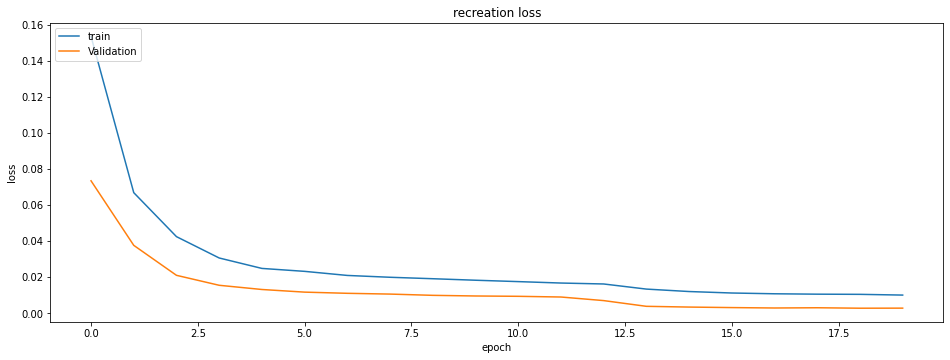

Intlier max value: 0.037113942 Index Val: 1543
outlier max value: 0.0060944217 Index Val: 2
outlier min value: 0.0008033673 Index Val: 5


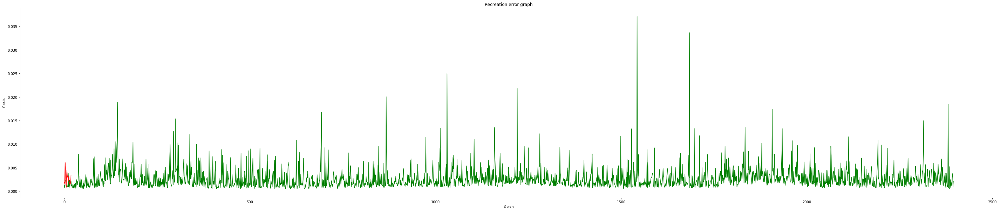

Total member in inlear: 2396
Total False alarm: 2217
Total member in Outlier: 19
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.99      0.07      0.14      2396
           1       0.01      0.95      0.02        19

    accuracy                           0.08      2415
   macro avg       0.50      0.51      0.08      2415
weighted avg       0.99      0.08      0.14      2415



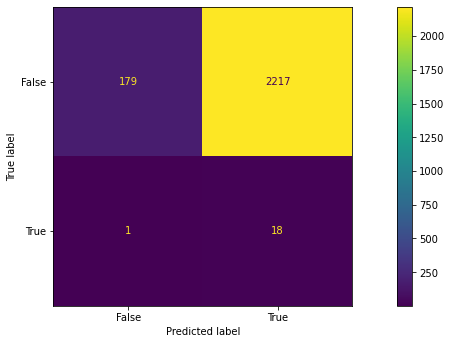

trecall_max: 0.07470784641068448 frecall_max: 0.9473684210526315 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


Epoch 1/20
60/60 [==============================] - 1s 4ms/step - loss: 0.1676 - val_loss: 0.0830
Epoch 2/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0715 - val_loss: 0.0388
Epoch 3/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0438 - val_loss: 0.0244
Epoch 4/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0321 - val_loss: 0.0160
Epoch 5/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0262 - val_loss: 0.0124
Epoch 6/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0223 - val_loss: 0.0096
Epoch 7/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0198 - val_loss: 0.0085
Epoch 8/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0180 - val_loss: 0.0069
Epoch 9/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0169 - val_loss: 0.0065
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0158 - val_loss: 0.0061
Epoch 11/20
60/60 [

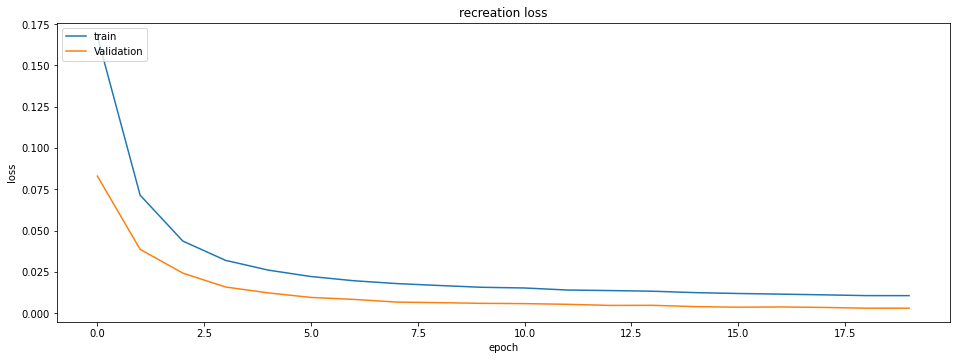

Intlier max value: 0.036033347 Index Val: 1543
outlier max value: 0.007606948 Index Val: 3
outlier min value: 0.00079626776 Index Val: 5


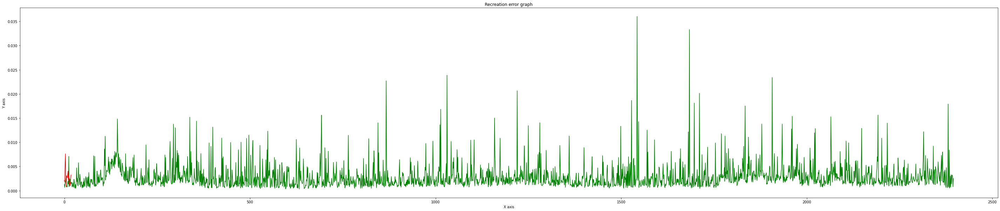

Total member in inlear: 2396
Total False alarm: 2204
Total member in Outlier: 19
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       0.99      0.08      0.15      2396
           1       0.01      0.95      0.02        19

    accuracy                           0.09      2415
   macro avg       0.50      0.51      0.08      2415
weighted avg       0.99      0.09      0.15      2415



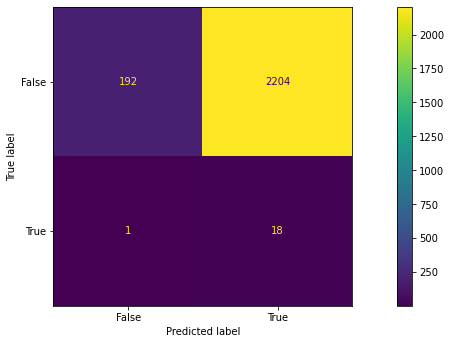

trecall_max: 0.08013355592654424 frecall_max: 0.9473684210526315 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


Epoch 1/20
60/60 [==============================] - 1s 8ms/step - loss: 0.1348 - val_loss: 0.0598
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0542 - val_loss: 0.0283
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0344 - val_loss: 0.0178
Epoch 4/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0268 - val_loss: 0.0132
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0234 - val_loss: 0.0108
Epoch 6/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0195 - val_loss: 0.0066
Epoch 7/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0056
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0152 - val_loss: 0.0053
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0141 - val_loss: 0.0048
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0139 - val_loss: 0.0048
Epoch 11/20
60/60 [

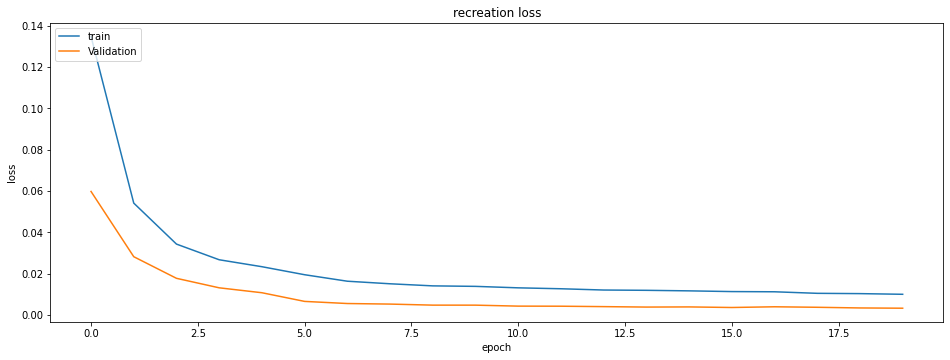

Intlier max value: 0.042071596 Index Val: 692
outlier max value: 0.00790965 Index Val: 9
outlier min value: 0.00075059675 Index Val: 5


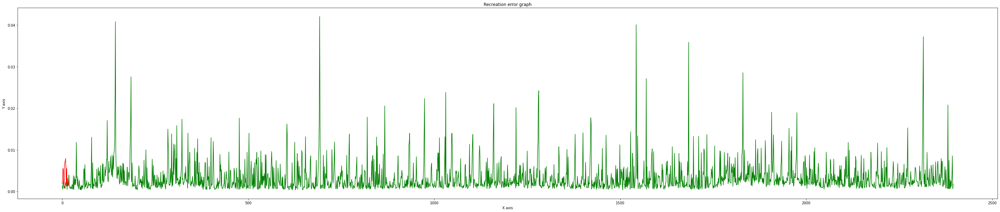

Total member in inlear: 2396
Total False alarm: 2179
Total member in Outlier: 19
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.09      0.17      2396
           1       0.01      0.95      0.02        19

    accuracy                           0.10      2415
   macro avg       0.50      0.52      0.09      2415
weighted avg       0.99      0.10      0.16      2415



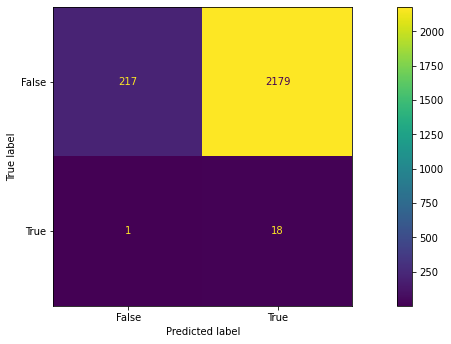

trecall_max: 0.09056761268781302 frecall_max: 0.9473684210526315 Count: 3


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn/assets


In [ ]:
# Inputs for RNF model:
w = 4
epochs = 20
# Get Raw Data for RNF
#fFiled = 'machineFailure'
fFiled = 'RNF'
rd, rd_o = rawDataload()
md = OnlyRNF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# amplify the diffrences 
amp = 7
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
recall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_rnf_1dcnn'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# Build,train the Model
while count < 5:
    # Build,train the Model
    m1_rnf , history = m1_rnf_1dcnn(Tr_w,epochs)
    m1 = m1_rnf
    # Check model accuracy
    print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
    plt_model_accuracy(history)
    inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1)
    #outlier cut-off point:
    oc_rnf = min(outlier_lst)
    oc_rnf = oc_rnf+oc_rnf*0.1
    oc = oc_rnf
    mat1 = confusionMatrix(oc_rnf,inlier_lst,outlier_lst)
    trecall = mat1['0']['recall']
    frecall = mat1['1']['recall']
    recall = trecall + frecall
    if recall_max < recall:
        recall_max = recall
        trecall_max = trecall
        frecall_max = frecall
        count+=1
        print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
        m1.save(m1_path)
        if count == 3:
            break
    inf+=1
    if inf > 20:
        break

In [ ]:
XT[1]

array([  298.2,   308.7,  1408. ,    46.3,     3. ,    10.5, 65190.4,
        4224. ,     0. ,     1. ,     0. ])

#### HDF model Freezed

[3.831e+20 3.138e+06]
Mounted at /content/gdrive
Folder already exist
Epoch 1/20
59/59 [==============================] - 2s 9ms/step - loss: 0.0288 - val_loss: 0.0067
Epoch 2/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0014 - val_loss: 9.5994e-04
Epoch 7/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0012 - val_loss: 8.3268e-04
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 9.9153e-04 - val_loss: 8.8287e-04
Epoch 9/20
59/59 [==============================] - 0s 3ms/step - loss: 8.6421e-04 - val_loss: 5.9162e-04
Epoch 10/20
59/59 [=====

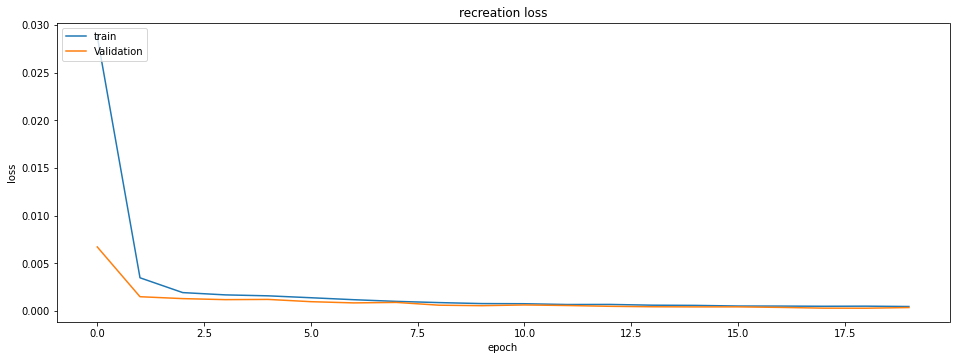

Intlier max value: 0.0043772026 Index Val: 2335
outlier max value: 0.00034757095 Index Val: 98
outlier min value: 3.1792384e-05 Index Val: 100


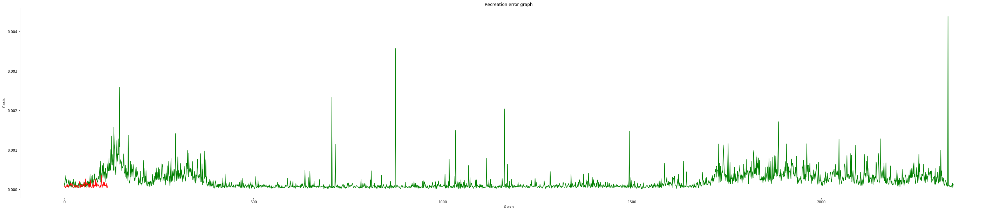

Total member in inlear: 2350
Total False alarm: 522
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       1.00      0.22      0.36      2350
           1       0.06      0.99      0.11       115

    accuracy                           0.26      2465
   macro avg       0.53      0.61      0.24      2465
weighted avg       0.95      0.26      0.35      2465



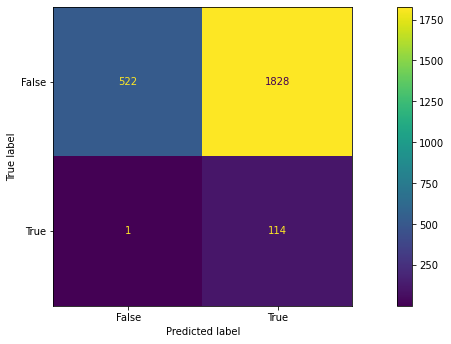

trecall_max: 0.2221276595744681 frecall_max: 0.991304347826087 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0249 - val_loss: 0.0057
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0028 - val_loss: 0.0013
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0013 - val_loss: 8.9739e-04
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0012 - val_loss: 8.3134e-04
Epoch 11/20

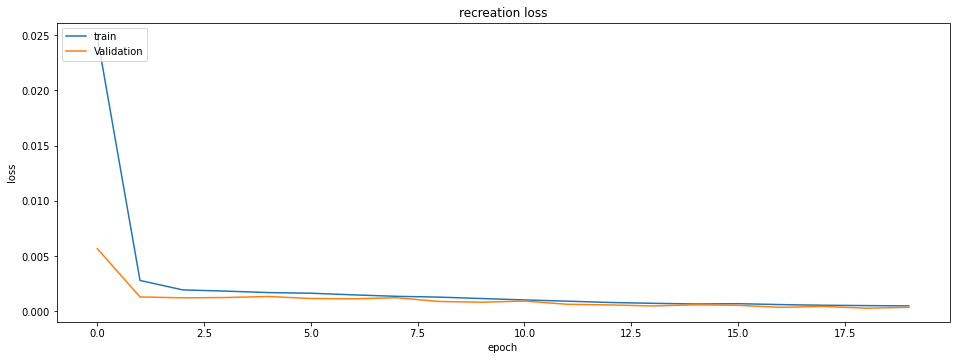

Intlier max value: 0.011337567 Index Val: 1017
outlier max value: 0.00059324945 Index Val: 61
outlier min value: 8.988196e-06 Index Val: 23


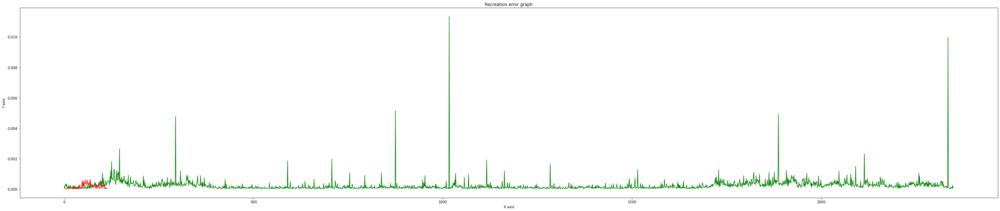

Total member in inlear: 2350
Total False alarm: 182
Total member in Outlier: 115
Total missed true alarm: 109
              precision    recall  f1-score   support

           0       0.97      0.08      0.14      2350
           1       0.05      0.95      0.09       115

    accuracy                           0.12      2465
   macro avg       0.51      0.51      0.12      2465
weighted avg       0.93      0.12      0.14      2465



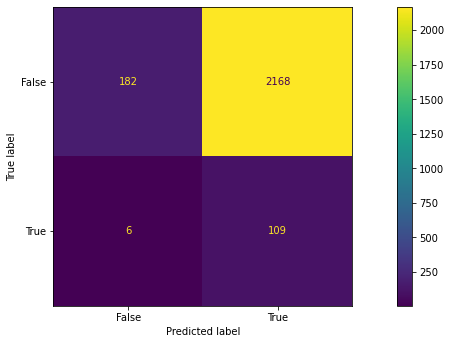

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.0403 - val_loss: 0.0101
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0054 - val_loss: 0.0013
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0020 - val_loss: 0.0012
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 8.6664e-04
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0010 - val_loss: 7.5120e-04
Epoch 11/20

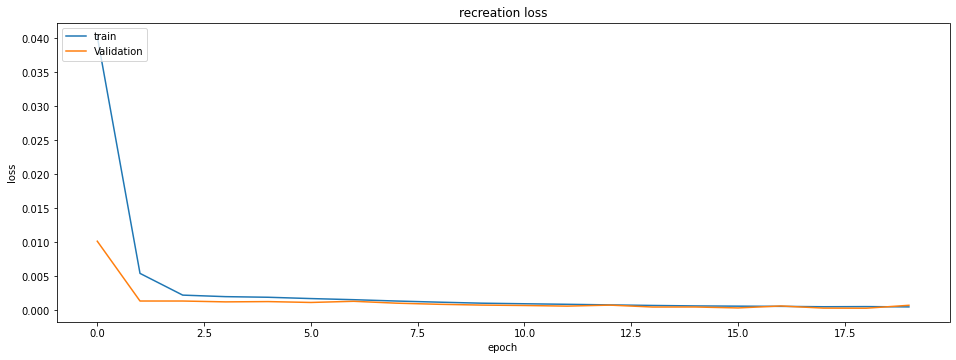

Intlier max value: 0.004947073 Index Val: 1017
outlier max value: 0.00070791686 Index Val: 50
outlier min value: 2.7109978e-05 Index Val: 2


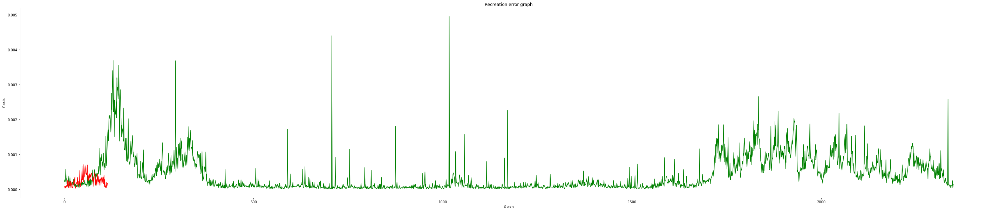

Total member in inlear: 2350
Total False alarm: 576
Total member in Outlier: 115
Total missed true alarm: 111
              precision    recall  f1-score   support

           0       0.99      0.25      0.39      2350
           1       0.06      0.97      0.11       115

    accuracy                           0.28      2465
   macro avg       0.53      0.61      0.25      2465
weighted avg       0.95      0.28      0.38      2465



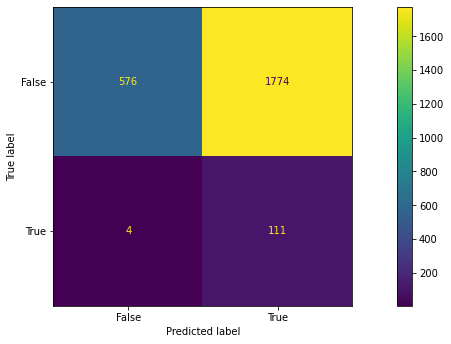

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0442 - val_loss: 0.0461
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0218 - val_loss: 0.0434
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0202 - val_loss: 0.0431
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0200 - val_loss: 0.0430
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0088 - val_loss: 0.0015
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0013 - val_loss: 9.8197e-04
Epoch 11/20
59/

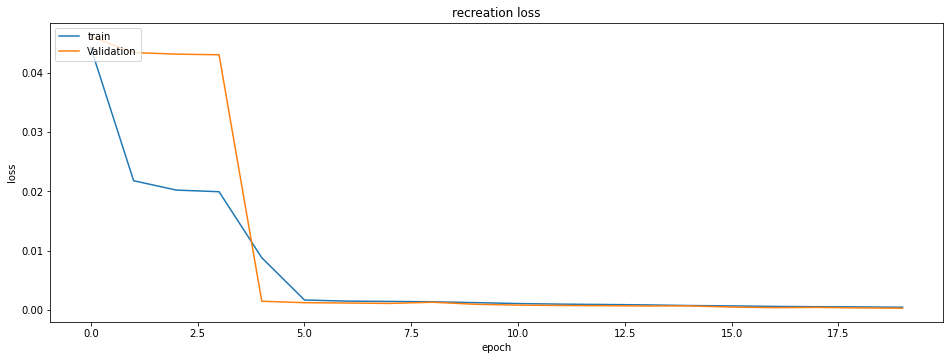

Intlier max value: 0.013316139 Index Val: 1017
outlier max value: 0.0010165166 Index Val: 56
outlier min value: 2.0385047e-05 Index Val: 4


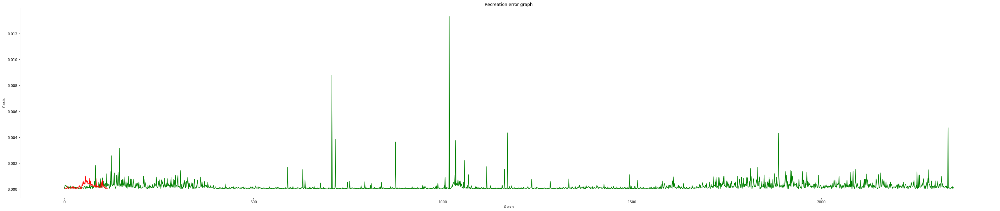

Total member in inlear: 2350
Total False alarm: 68
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       0.99      0.03      0.06      2350
           1       0.05      0.99      0.09       115

    accuracy                           0.07      2465
   macro avg       0.52      0.51      0.07      2465
weighted avg       0.94      0.07      0.06      2465



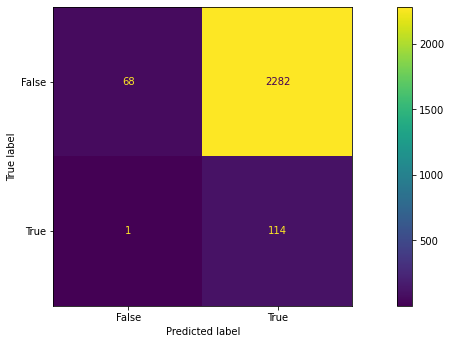

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0264 - val_loss: 0.0056
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0032 - val_loss: 0.0015
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 8.9381e-04
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0011 - val_loss: 9.5395e-04
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 9.9652e-04 - val_loss: 6.7551e-04
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 8.7386e-04 - val_loss: 5.8128

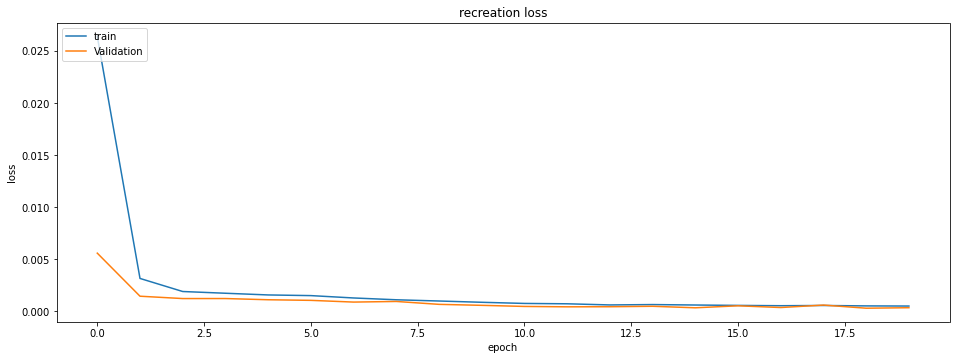

Intlier max value: 0.008065239 Index Val: 2335
outlier max value: 0.001191158 Index Val: 98
outlier min value: 2.871254e-05 Index Val: 4


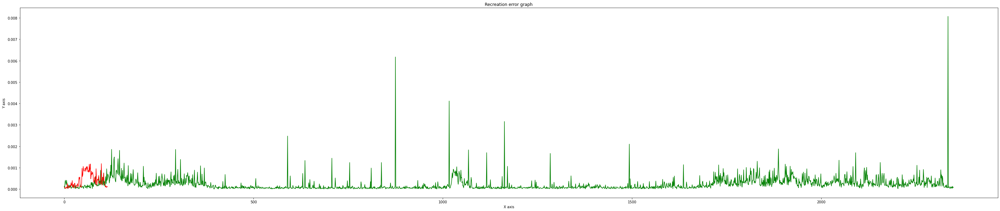

Total member in inlear: 2350
Total False alarm: 33
Total member in Outlier: 115
Total missed true alarm: 112
              precision    recall  f1-score   support

           0       0.92      0.01      0.03      2350
           1       0.05      0.97      0.09       115

    accuracy                           0.06      2465
   macro avg       0.48      0.49      0.06      2465
weighted avg       0.88      0.06      0.03      2465



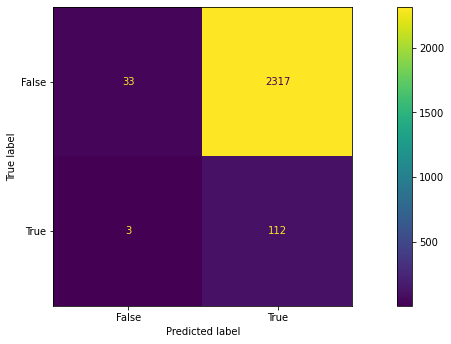

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.0296 - val_loss: 0.0096
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0044 - val_loss: 0.0019
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0025 - val_loss: 0.0016
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0021 - val_loss: 0.0014
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0015 - val_loss: 0.0010
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 8.6058e-04
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 5.0713e-04
Epoch 11/20

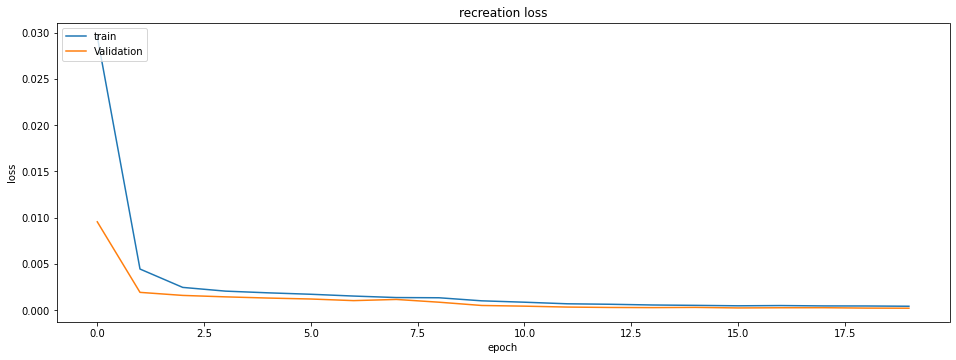

Intlier max value: 0.006413389 Index Val: 1017
outlier max value: 0.0006906192 Index Val: 98
outlier min value: 4.615656e-05 Index Val: 10


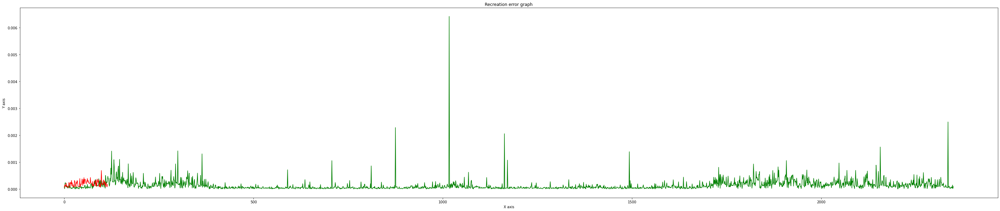

Total member in inlear: 2350
Total False alarm: 41
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       0.98      0.02      0.03      2350
           1       0.05      0.99      0.09       115

    accuracy                           0.06      2465
   macro avg       0.51      0.50      0.06      2465
weighted avg       0.93      0.06      0.04      2465



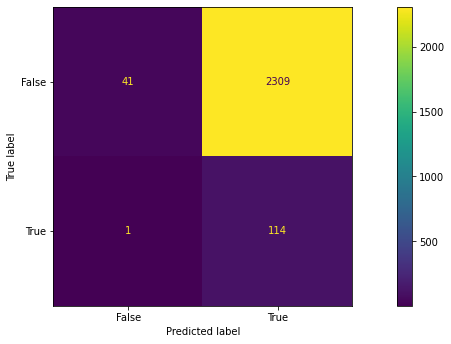

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.0336 - val_loss: 0.0055
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 0.0014
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 8.1298e-04 - val_loss: 8.4519e-04
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 7.5378e-04 - val_loss: 9.0344e-04
Epo

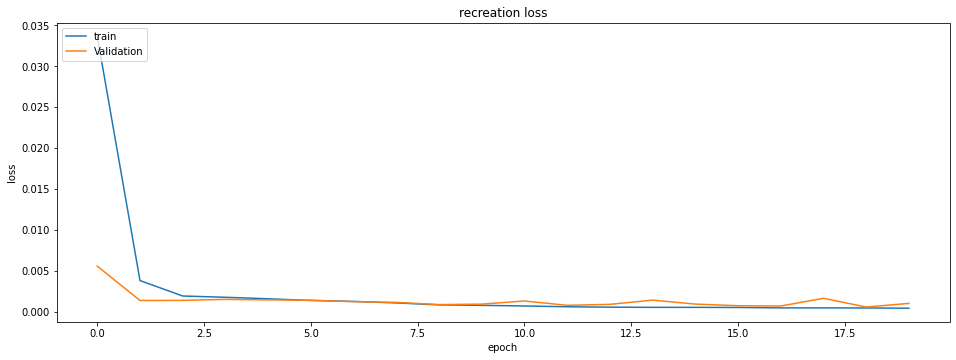

Intlier max value: 0.0044326363 Index Val: 2335
outlier max value: 0.00056296453 Index Val: 98
outlier min value: 1.2959004e-05 Index Val: 31


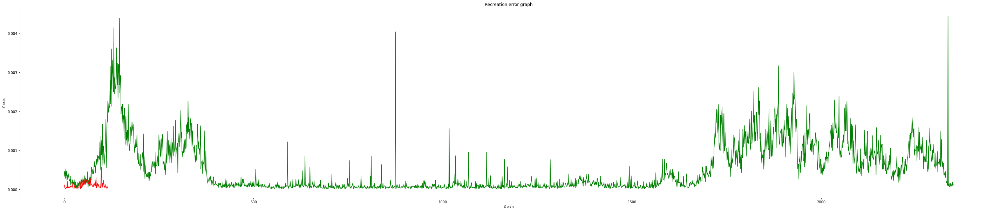

Total member in inlear: 2350
Total False alarm: 864
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       1.00      0.37      0.54      2350
           1       0.07      0.99      0.13       115

    accuracy                           0.40      2465
   macro avg       0.54      0.68      0.34      2465
weighted avg       0.96      0.40      0.52      2465



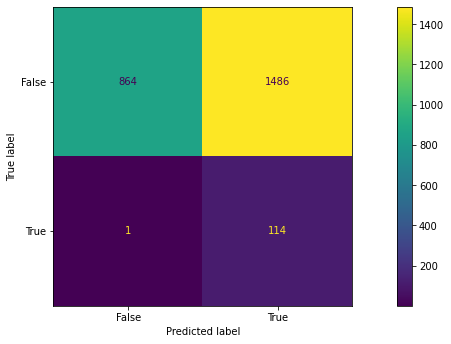

trecall_max: 0.3676595744680851 frecall_max: 0.991304347826087 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0376 - val_loss: 0.0086
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0055 - val_loss: 0.0016
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0021 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0016 - val_loss: 0.0010
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 6.1182e-04
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 8.2207e-04 - val_loss: 5.5054e-04
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 7.0502e-04 - val_loss: 6.4097e-04
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 6.2722e-04 - val_loss: 3.

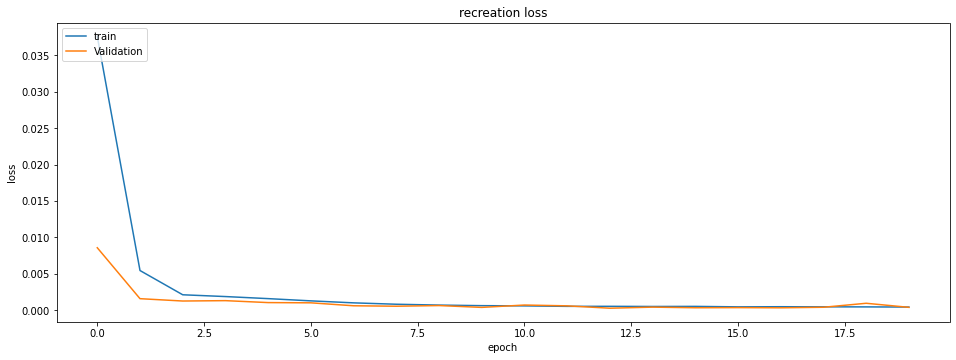

Intlier max value: 0.0023816102 Index Val: 1887
outlier max value: 0.00061120687 Index Val: 61
outlier min value: 2.881265e-05 Index Val: 10


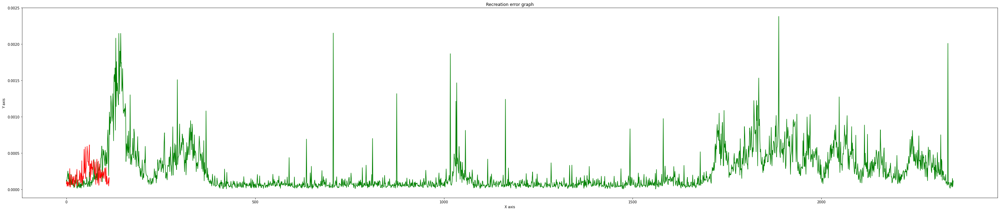

Total member in inlear: 2350
Total False alarm: 264
Total member in Outlier: 115
Total missed true alarm: 111
              precision    recall  f1-score   support

           0       0.99      0.11      0.20      2350
           1       0.05      0.97      0.10       115

    accuracy                           0.15      2465
   macro avg       0.52      0.54      0.15      2465
weighted avg       0.94      0.15      0.20      2465



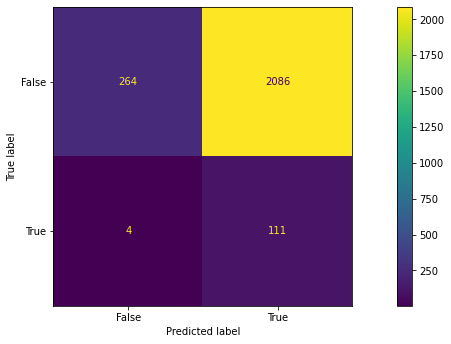

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.0391 - val_loss: 0.0067
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0042 - val_loss: 0.0014
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0020 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 9/20
59/59 [==============================] - 1s 12ms/step - loss: 0.0012 - val_loss: 9.6723e-04
Epoch 10/20
59/59 [==============================] - 1s 13ms/step - loss: 0.0010 - val_loss: 8.3996e-04
Epoch 11/

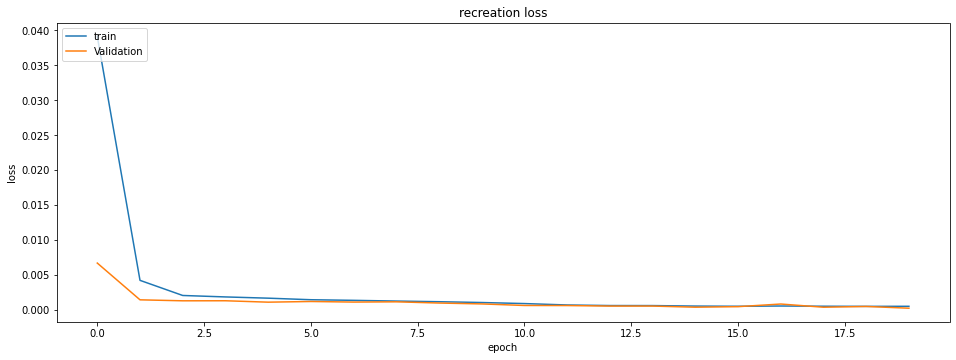

Intlier max value: 0.005366119 Index Val: 1163
outlier max value: 0.0004556073 Index Val: 55
outlier min value: 1.6490794e-05 Index Val: 22


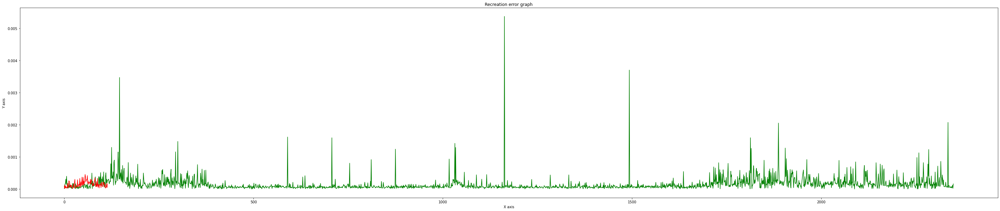

Total member in inlear: 2350
Total False alarm: 157
Total member in Outlier: 115
Total missed true alarm: 113
              precision    recall  f1-score   support

           0       0.99      0.07      0.13      2350
           1       0.05      0.98      0.09       115

    accuracy                           0.11      2465
   macro avg       0.52      0.52      0.11      2465
weighted avg       0.94      0.11      0.12      2465



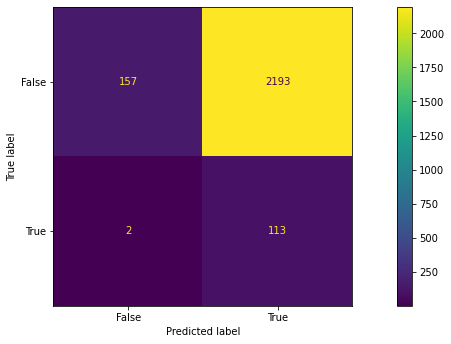

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0234 - val_loss: 0.0055
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0033 - val_loss: 0.0015
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0022 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0014 - val_loss: 9.3766e-04
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0013 - val_loss: 8.1586e-04
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0011 - val_loss: 7.2983e-04
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0010 - val_loss: 6.0899e-04
Epo

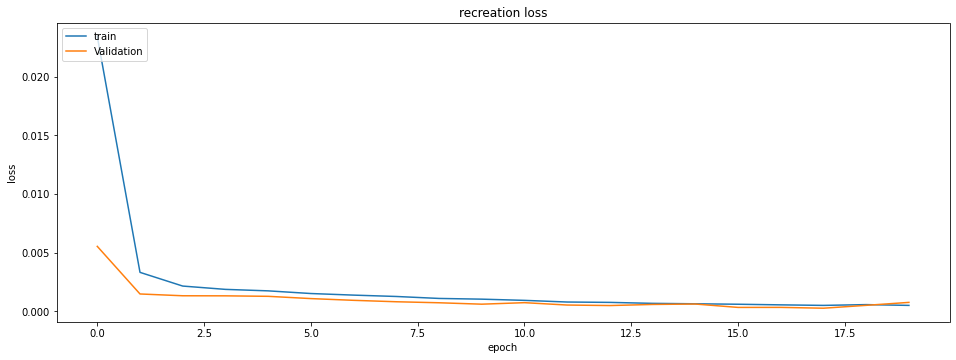

Intlier max value: 0.015657058 Index Val: 2335
outlier max value: 0.0011765277 Index Val: 98
outlier min value: 1.8297562e-05 Index Val: 2


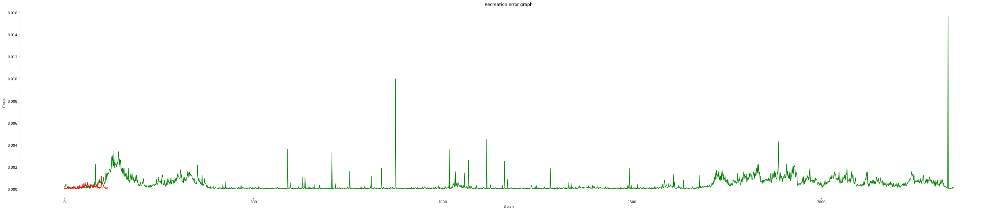

Total member in inlear: 2350
Total False alarm: 256
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       1.00      0.11      0.20      2350
           1       0.05      0.99      0.10       115

    accuracy                           0.15      2465
   macro avg       0.52      0.55      0.15      2465
weighted avg       0.95      0.15      0.19      2465



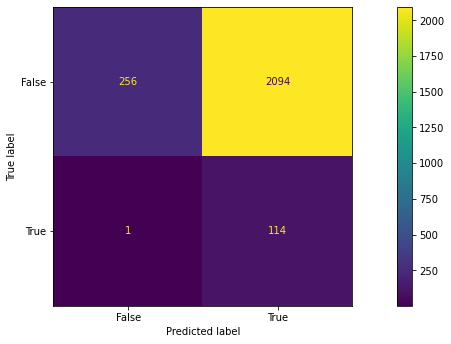

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0368 - val_loss: 0.0069
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0040 - val_loss: 0.0013
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0014 - val_loss: 0.0010
Epoch 8/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 9/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0013 - val_loss: 9.8840e-04
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0011 - val_loss: 8.8931e-04
Epoch 11/20

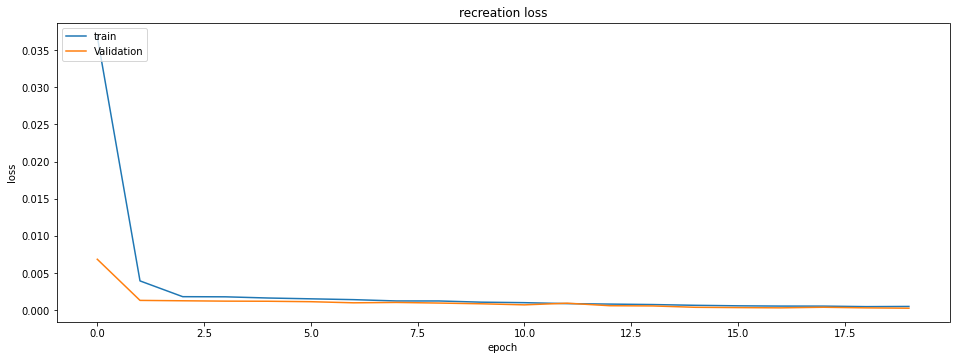

Intlier max value: 0.0070170406 Index Val: 1017
outlier max value: 0.0014779357 Index Val: 61
outlier min value: 4.4593893e-05 Index Val: 30


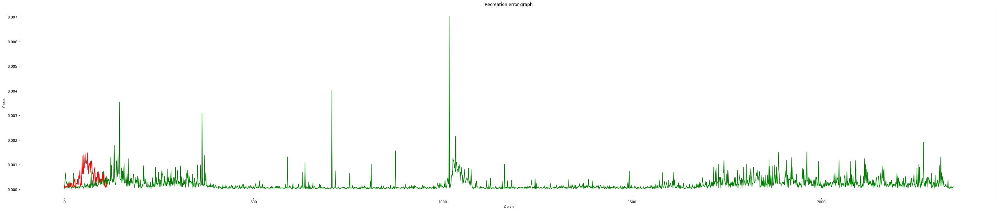

Total member in inlear: 2350
Total False alarm: 12
Total member in Outlier: 115
Total missed true alarm: 111
              precision    recall  f1-score   support

           0       0.75      0.01      0.01      2350
           1       0.05      0.97      0.09       115

    accuracy                           0.05      2465
   macro avg       0.40      0.49      0.05      2465
weighted avg       0.72      0.05      0.01      2465



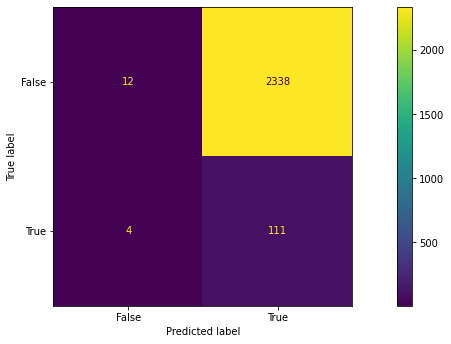

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.0257 - val_loss: 0.0079
Epoch 2/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0035 - val_loss: 0.0015
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0019 - val_loss: 0.0013
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 8/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0011 - val_loss: 7.5360e-04
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 9.8559e-04 - val_loss: 8.4882e-04
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 8.0632e-04 - val_loss: 5.7769e-04

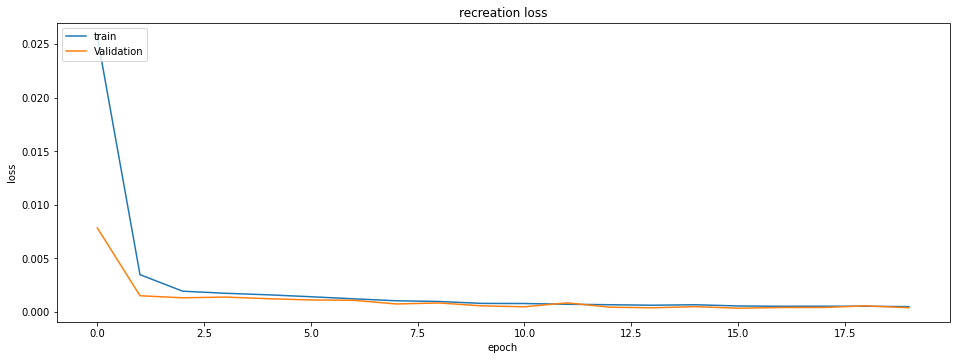

Intlier max value: 0.0096910335 Index Val: 2335
outlier max value: 0.0006976683 Index Val: 98
outlier min value: 2.2948827e-05 Index Val: 4


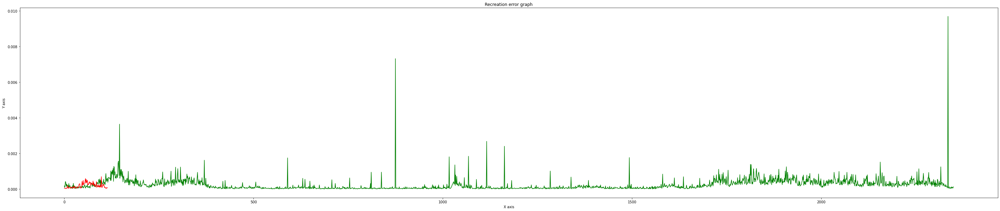

Total member in inlear: 2350
Total False alarm: 151
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       0.99      0.06      0.12      2350
           1       0.05      0.99      0.09       115

    accuracy                           0.11      2465
   macro avg       0.52      0.53      0.11      2465
weighted avg       0.95      0.11      0.12      2465



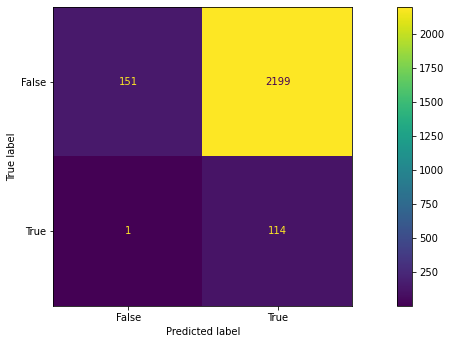

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.0301 - val_loss: 0.0080
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0036 - val_loss: 0.0014
Epoch 3/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0012 - val_loss: 8.3963e-04
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0010 - val_loss: 8.0664e-04
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 8.4482e-04 - val_loss: 5.0489e-04
Epo

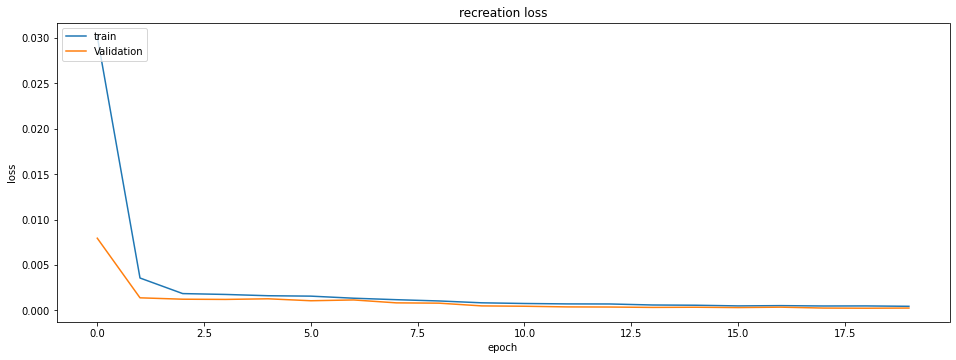

Intlier max value: 0.0093735885 Index Val: 1017
outlier max value: 0.000603787 Index Val: 61
outlier min value: 1.3221102e-05 Index Val: 2


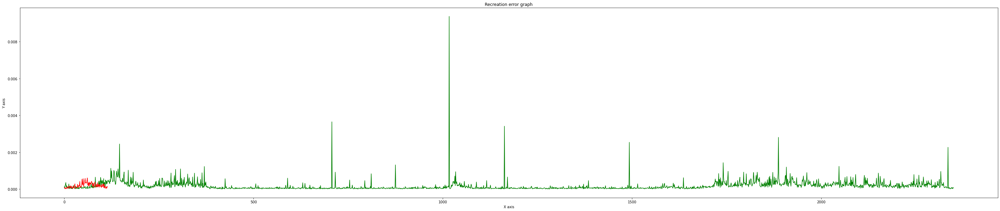

Total member in inlear: 2350
Total False alarm: 115
Total member in Outlier: 115
Total missed true alarm: 112
              precision    recall  f1-score   support

           0       0.97      0.05      0.09      2350
           1       0.05      0.97      0.09       115

    accuracy                           0.09      2465
   macro avg       0.51      0.51      0.09      2465
weighted avg       0.93      0.09      0.09      2465



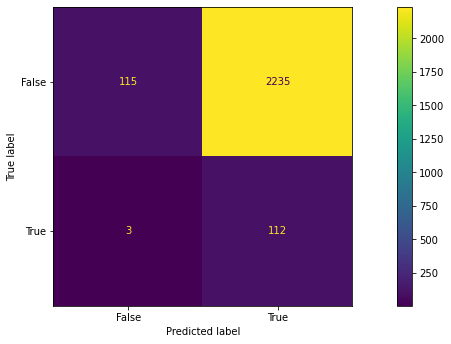

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.0463 - val_loss: 0.0857
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0386 - val_loss: 0.0848
Epoch 3/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0382 - val_loss: 0.0847
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0381 - val_loss: 0.0846
Epoch 5/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0380 - val_loss: 0.0846
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0379 - val_loss: 0.0845
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0378 - val_loss: 0.0843
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0376 - val_loss: 0.0842
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0374 - val_loss: 0.0840
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0373 - val_loss: 0.0839
Epoch 11/20
59/59 [

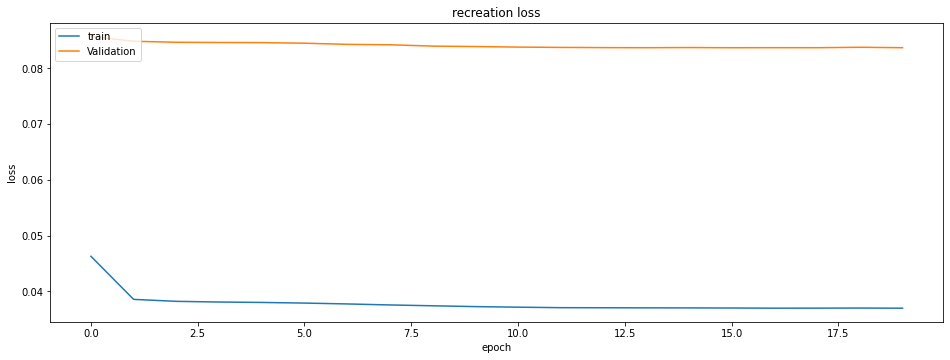

Intlier max value: 0.25007075 Index Val: 139
outlier max value: 0.0055788374 Index Val: 1
outlier min value: 0.0014354123 Index Val: 66


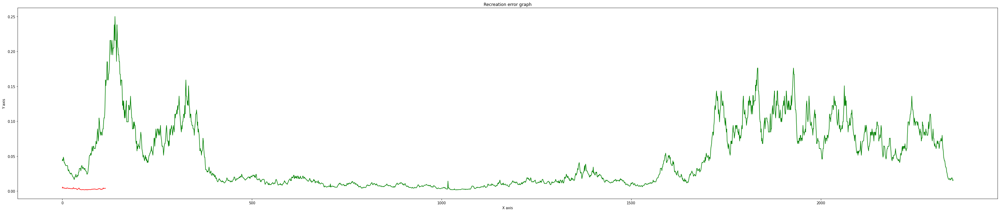

Total member in inlear: 2350
Total False alarm: 2221
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      2350
           1       0.47      0.99      0.64       115

    accuracy                           0.95      2465
   macro avg       0.73      0.97      0.80      2465
weighted avg       0.97      0.95      0.96      2465



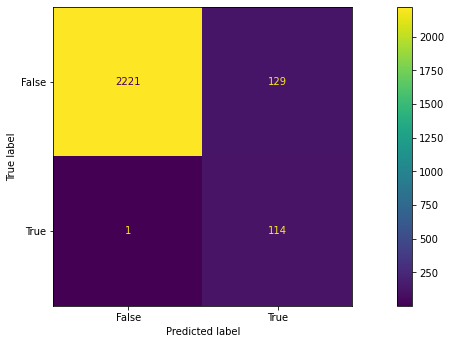

trecall_max: 0.9451063829787234 frecall_max: 0.991304347826087 Count: 3


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn/assets


In [ ]:
# Inputs for HDF model:
w = 4
epochs = 20
# Get Raw Data for HDF
#fFiled = 'machineFailure'
fFiled = 'HDF'
rd, rd_o = rawDataload()
md = OnlyHDF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only pow related field
XPopIndex = [0,1,3,4,6,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 6
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# Build,train the Model
while count < 5:
    # Build,train the Model
    m1_pwf , history = m1_hdf_1dcnn(Tr_w,epochs)
    m1 = m1_pwf
    # Check model accuracy
    print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
    plt_model_accuracy(history)
    inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1)
    #outlier cut-off point:
    oc_hdf = max(outlier_lst)
    oc_hdf = oc_hdf-oc_hdf*0.1
    oc = oc_hdf
    mat1 = confusionMatrix_hdf(oc,inlier_lst,outlier_lst)
    trecall = mat1['0']['recall']
    frecall = mat1['1']['recall']
    if trecall_max <= trecall and frecall_max <= frecall:
        trecall_max = trecall
        frecall_max = frecall
        count+=1
        print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
        m1.save(m1_path)
        if count == 3:
            break
    inf+=1
    if inf > 20:
        break

[3.831e+20 3.138e+06]
Mounted at /content/gdrive
Folder already exist
Intlier max value: 0.25007075 Index Val: 139
outlier max value: 0.0055788374 Index Val: 1
outlier min value: 0.0014354123 Index Val: 66


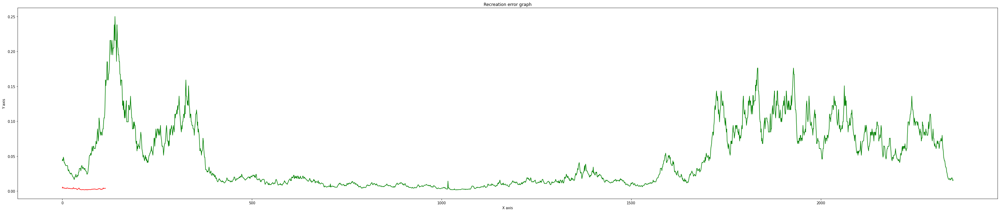

Total member in inlear: 2350
Total False alarm: 2221
Total member in Outlier: 115
Total missed true alarm: 114
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      2350
           1       0.47      0.99      0.64       115

    accuracy                           0.95      2465
   macro avg       0.73      0.97      0.80      2465
weighted avg       0.97      0.95      0.96      2465



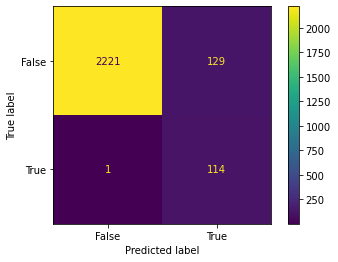

In [ ]:
# Inputs for HDF model Freezed:
w = 4
epochs = 20
# Get Raw Data for HDF
#fFiled = 'machineFailure'
fFiled = 'HDF'
rd, rd_o = rawDataload()
md = OnlyHDF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only pow related field
XPopIndex = [0,1,3,4,6,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 6
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m1_hdf_1dcnn_freezed'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# load the model
m1_hdf_load = tf.keras.models.load_model(m1_path)
inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1_hdf_load)
#outlier cut-off point:
oc_hdf = max(outlier_lst)
oc_hdf = oc_hdf-oc_hdf*0.1
oc = oc_hdf
mat1 = confusionMatrix_hdf(oc,inlier_lst,outlier_lst)

#### PWF model - Freezed

[ 2695.     70.  85924.8]
Mounted at /content/gdrive
Folder already exist
Epoch 1/20
59/59 [==============================] - 1s 10ms/step - loss: 995260416.0000 - val_loss: 699219008.0000
Epoch 2/20
59/59 [==============================] - 0s 3ms/step - loss: 638093248.0000 - val_loss: 624955136.0000
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 621998976.0000 - val_loss: 623676416.0000
Epoch 4/20
59/59 [==============================] - 0s 3ms/step - loss: 619190720.0000 - val_loss: 622078592.0000
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 617156224.0000 - val_loss: 620321152.0000
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 616138944.0000 - val_loss: 618484224.0000
Epoch 7/20
59/59 [==============================] - 0s 3ms/step - loss: 614804480.0000 - val_loss: 620068992.0000
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 613773696.0000 - val_loss: 617215488.0000
Epoch 9/20
59

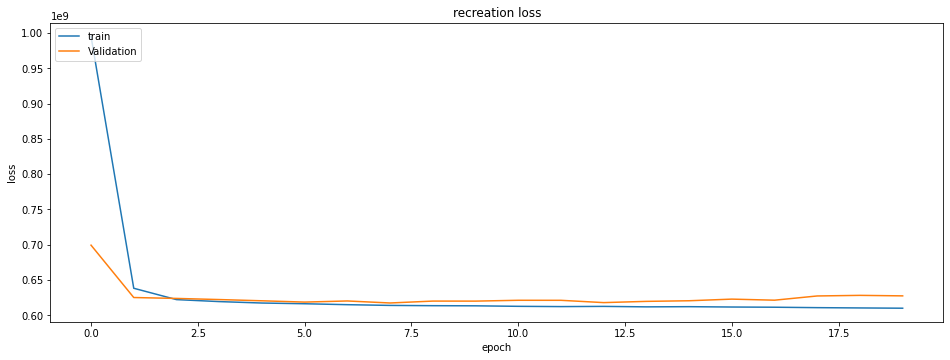

Intlier max value: 1074875600.0 Index Val: 799
outlier max value: 1295628500.0 Index Val: 63
outlier min value: 224843600.0 Index Val: 48


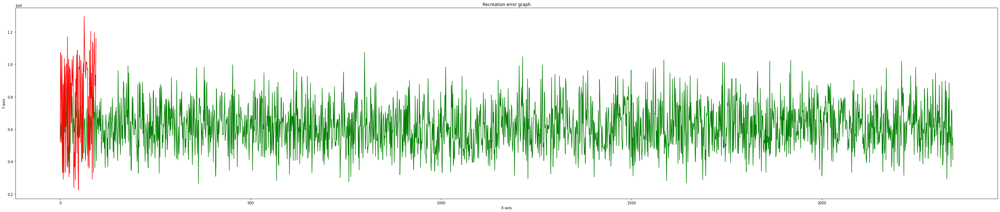

Total member in inlear: 2345
Total False alarm: 1057
Total member in Outlier: 95
Total missed true alarm: 29
              precision    recall  f1-score   support

           0       0.98      0.55      0.70      2345
           1       0.06      0.69      0.11        95

    accuracy                           0.55      2440
   macro avg       0.52      0.62      0.41      2440
weighted avg       0.94      0.55      0.68      2440



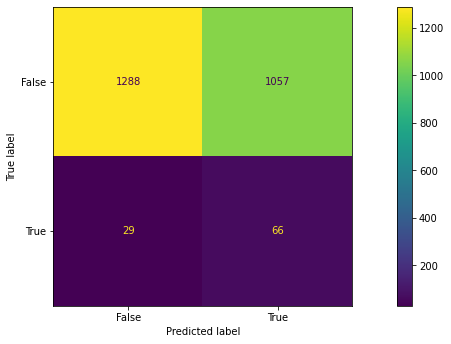

trecall_max: 0.5492537313432836 frecall_max: 0.6947368421052632 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 6ms/step - loss: 542017856.0000 - val_loss: 25868102.0000
Epoch 2/20
59/59 [==============================] - 0s 3ms/step - loss: 53466948.0000 - val_loss: 23698162.0000
Epoch 3/20
59/59 [==============================] - 0s 3ms/step - loss: 44772232.0000 - val_loss: 23673972.0000
Epoch 4/20
59/59 [==============================] - 0s 3ms/step - loss: 40341308.0000 - val_loss: 21936008.0000
Epoch 5/20
59/59 [==============================] - 0s 3ms/step - loss: 35950672.0000 - val_loss: 25044128.0000
Epoch 6/20
59/59 [==============================] - 0s 3ms/step - loss: 33595620.0000 - val_loss: 20354062.0000
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 31911738.0000 - val_loss: 17129784.0000
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 29424358.0000 - val_loss: 16661390.0000
Epoch 9/20
59/59 [==============================] - 0s 3ms/step - loss: 28184554.0000 - val_loss: 17057

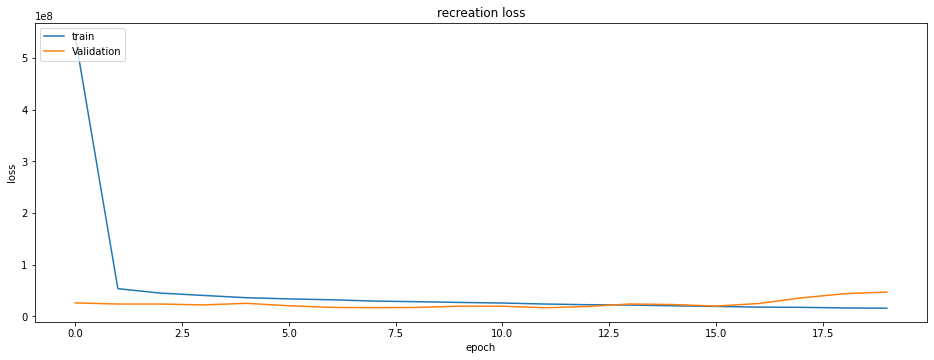

Intlier max value: 85270110.0 Index Val: 385
outlier max value: 110164940.0 Index Val: 0
outlier min value: 22332254.0 Index Val: 47


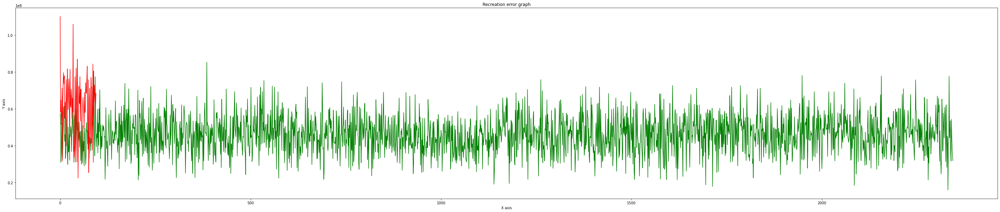

Total member in inlear: 2345
Total False alarm: 122
Total member in Outlier: 95
Total missed true alarm: 45
              precision    recall  f1-score   support

           0       0.98      0.95      0.96      2345
           1       0.29      0.53      0.37        95

    accuracy                           0.93      2440
   macro avg       0.64      0.74      0.67      2440
weighted avg       0.95      0.93      0.94      2440



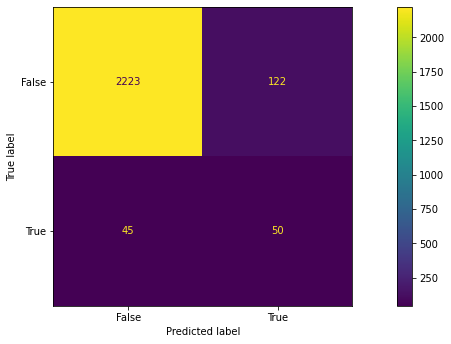

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 697566784.0000 - val_loss: 62600112.0000
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 56803060.0000 - val_loss: 23609968.0000
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 45007140.0000 - val_loss: 21810650.0000
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 41242300.0000 - val_loss: 19832310.0000
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 38337484.0000 - val_loss: 18492770.0000
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 34121460.0000 - val_loss: 16662639.0000
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 33238906.0000 - val_loss: 15442335.0000
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 30825316.0000 - val_loss: 15649553.0000
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 28707600.0000 - val_loss: 16036

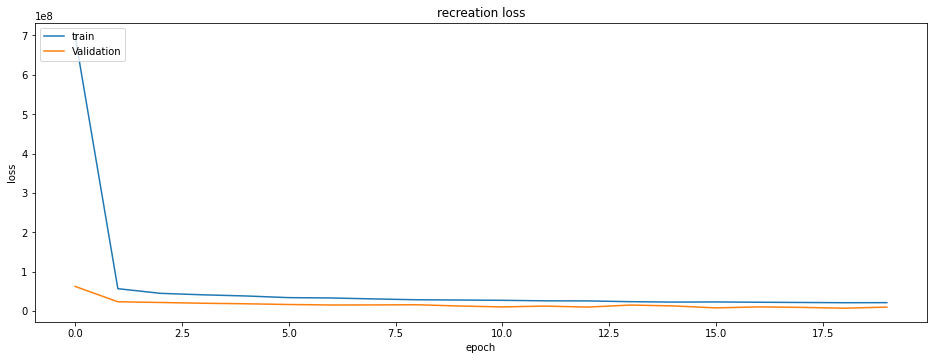

Intlier max value: 48724250.0 Index Val: 712
outlier max value: 82226900.0 Index Val: 0
outlier min value: 7189897.5 Index Val: 47


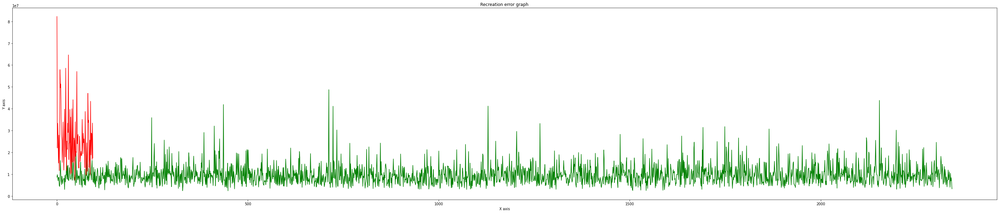

Total member in inlear: 2345
Total False alarm: 80
Total member in Outlier: 95
Total missed true alarm: 35
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2345
           1       0.43      0.63      0.51        95

    accuracy                           0.95      2440
   macro avg       0.71      0.80      0.74      2440
weighted avg       0.96      0.95      0.96      2440



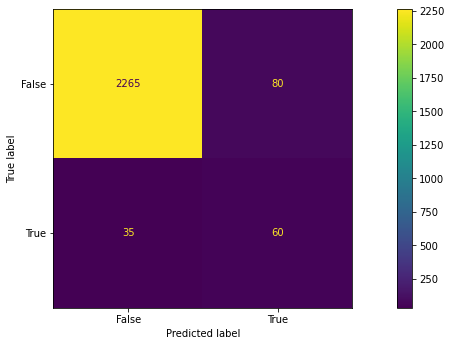

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 626843264.0000 - val_loss: 34786828.0000
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 50230420.0000 - val_loss: 22414316.0000
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 44331480.0000 - val_loss: 24443946.0000
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 40150304.0000 - val_loss: 20902216.0000
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 37934656.0000 - val_loss: 24763034.0000
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 33920928.0000 - val_loss: 23246334.0000
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 32504060.0000 - val_loss: 22265452.0000
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 31381074.0000 - val_loss: 23589146.0000
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 30013096.0000 - val_loss: 16180

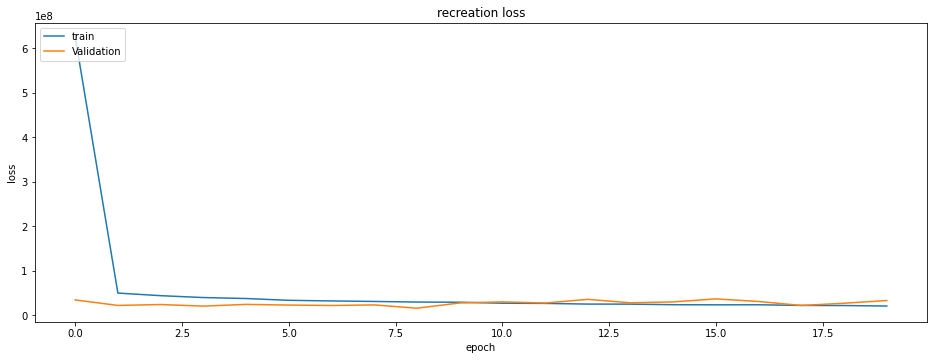

Intlier max value: 74104940.0 Index Val: 1891
outlier max value: 109954140.0 Index Val: 52
outlier min value: 21040952.0 Index Val: 6


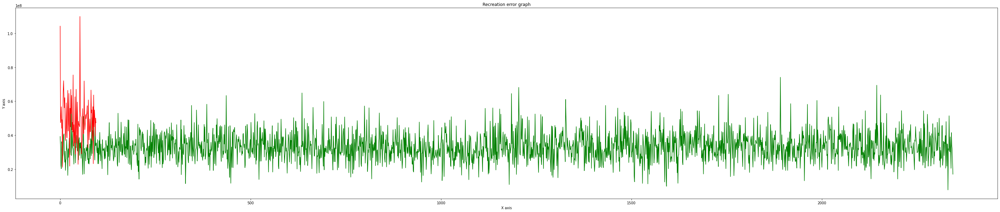

Total member in inlear: 2345
Total False alarm: 12
Total member in Outlier: 95
Total missed true alarm: 76
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2345
           1       0.61      0.20      0.30        95

    accuracy                           0.96      2440
   macro avg       0.79      0.60      0.64      2440
weighted avg       0.95      0.96      0.96      2440



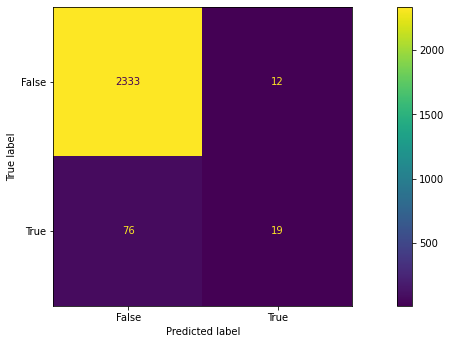

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 708019712.0000 - val_loss: 72503544.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 51303492.0000 - val_loss: 23622302.0000
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 41613712.0000 - val_loss: 21812936.0000
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 38583052.0000 - val_loss: 19562584.0000
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 35310404.0000 - val_loss: 18495270.0000
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 32833360.0000 - val_loss: 17382064.0000
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 31083360.0000 - val_loss: 14189904.0000
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 28783948.0000 - val_loss: 12565229.0000
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 25613746.0000 - val_loss: 89064

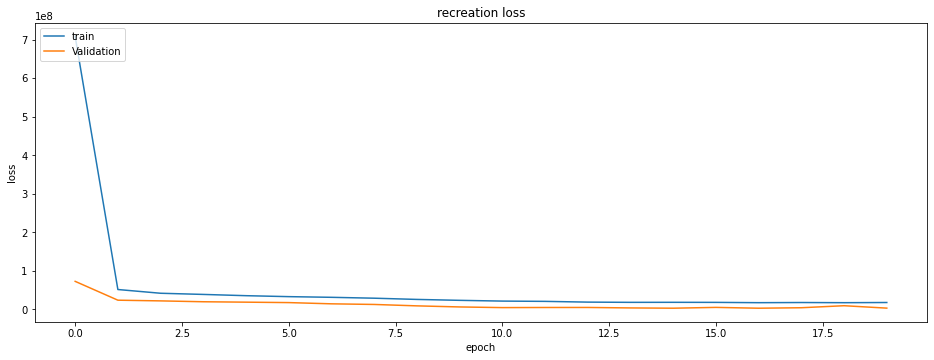

Intlier max value: 24015512.0 Index Val: 2144
outlier max value: 66147644.0 Index Val: 0
outlier min value: 1498295.5 Index Val: 4


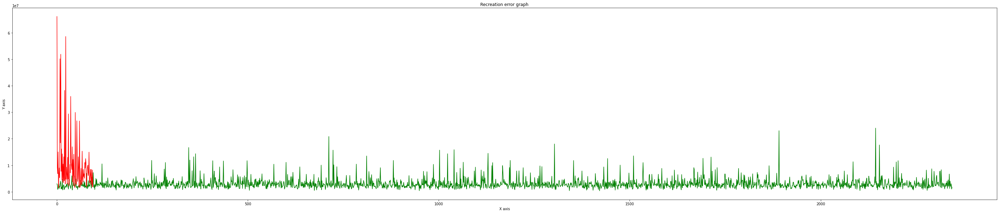

Total member in inlear: 2345
Total False alarm: 335
Total member in Outlier: 95
Total missed true alarm: 25
              precision    recall  f1-score   support

           0       0.99      0.86      0.92      2345
           1       0.17      0.74      0.28        95

    accuracy                           0.85      2440
   macro avg       0.58      0.80      0.60      2440
weighted avg       0.96      0.85      0.89      2440



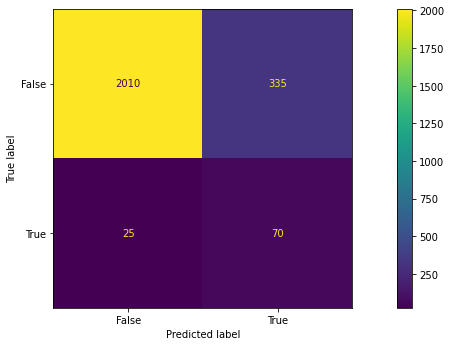

trecall_max: 0.8571428571428571 frecall_max: 0.7368421052631579 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 998795264.0000 - val_loss: 488442016.0000
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 371057984.0000 - val_loss: 323077952.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 340252704.0000 - val_loss: 321731776.0000
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 335751360.0000 - val_loss: 318717504.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 333895712.0000 - val_loss: 318961344.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 331343968.0000 - val_loss: 318344800.0000
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 330087168.0000 - val_loss: 318235616.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 328004864.0000 - val_loss: 315228864.0000
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 326367872.0000 -

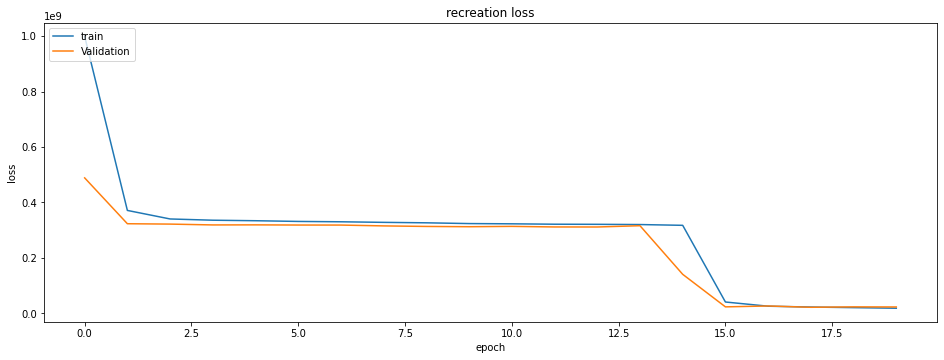

Intlier max value: 56020304.0 Index Val: 1865
outlier max value: 64834216.0 Index Val: 0
outlier min value: 9448679.0 Index Val: 75


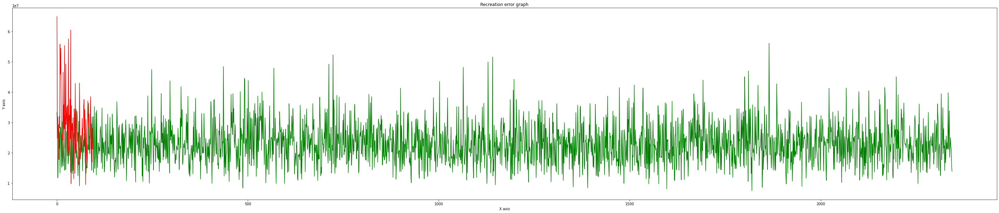

Total member in inlear: 2345
Total False alarm: 620
Total member in Outlier: 95
Total missed true alarm: 48
              precision    recall  f1-score   support

           0       0.97      0.74      0.84      2345
           1       0.07      0.49      0.12        95

    accuracy                           0.73      2440
   macro avg       0.52      0.62      0.48      2440
weighted avg       0.94      0.73      0.81      2440



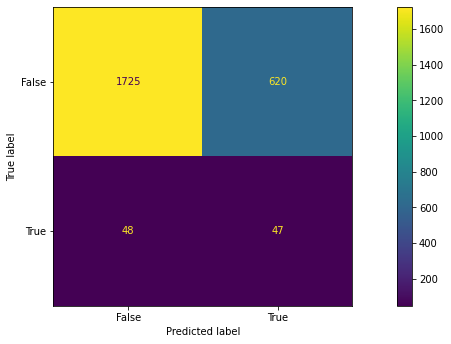

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 852180288.0000 - val_loss: 334970272.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 105007224.0000 - val_loss: 22425886.0000
Epoch 3/20
59/59 [==============================] - 0s 7ms/step - loss: 46276640.0000 - val_loss: 25355922.0000
Epoch 4/20
59/59 [==============================] - 0s 7ms/step - loss: 44529724.0000 - val_loss: 27286838.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 40094880.0000 - val_loss: 28623666.0000
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 38773200.0000 - val_loss: 25591292.0000
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 36177384.0000 - val_loss: 27718518.0000
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 33539260.0000 - val_loss: 30639546.0000
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 32525862.0000 - val_loss: 384

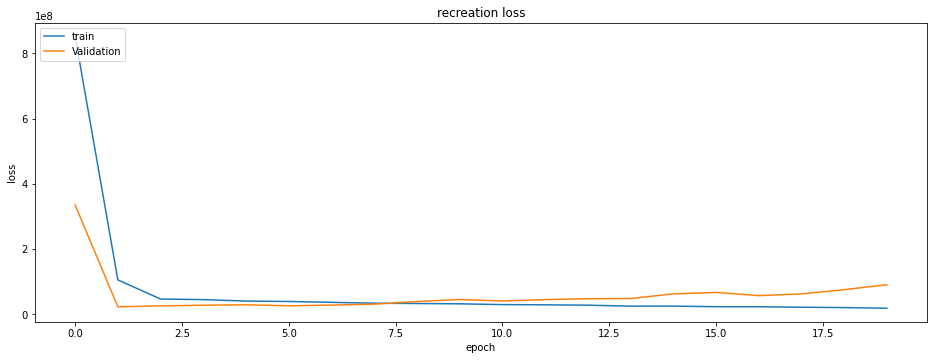

Intlier max value: 159038640.0 Index Val: 385
outlier max value: 205289980.0 Index Val: 34
outlier min value: 39644630.0 Index Val: 1


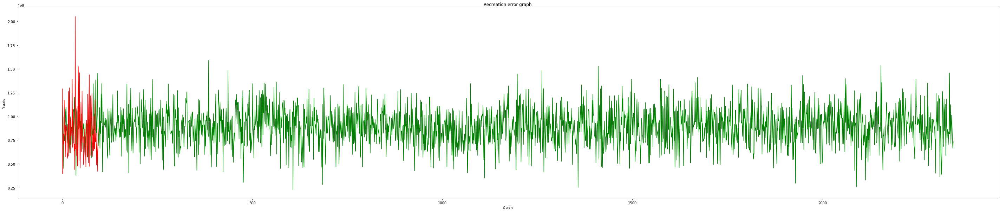

Total member in inlear: 2345
Total False alarm: 281
Total member in Outlier: 95
Total missed true alarm: 79
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      2345
           1       0.05      0.17      0.08        95

    accuracy                           0.85      2440
   macro avg       0.51      0.52      0.50      2440
weighted avg       0.93      0.85      0.89      2440



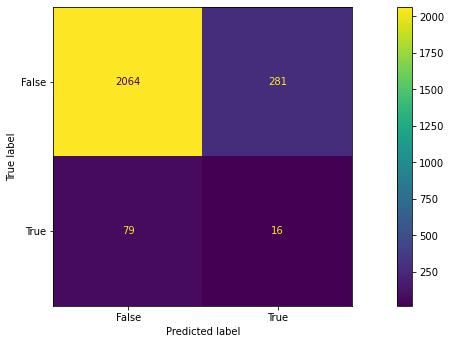

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 759727808.0000 - val_loss: 251464432.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 90140992.0000 - val_loss: 23560454.0000
Epoch 3/20
59/59 [==============================] - 0s 7ms/step - loss: 43403320.0000 - val_loss: 24225668.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 41743528.0000 - val_loss: 21998760.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 38184976.0000 - val_loss: 22465608.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 37292496.0000 - val_loss: 20327140.0000
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 35661988.0000 - val_loss: 27206312.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 33669796.0000 - val_loss: 21665598.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 31995560.0000 - val_loss: 1829

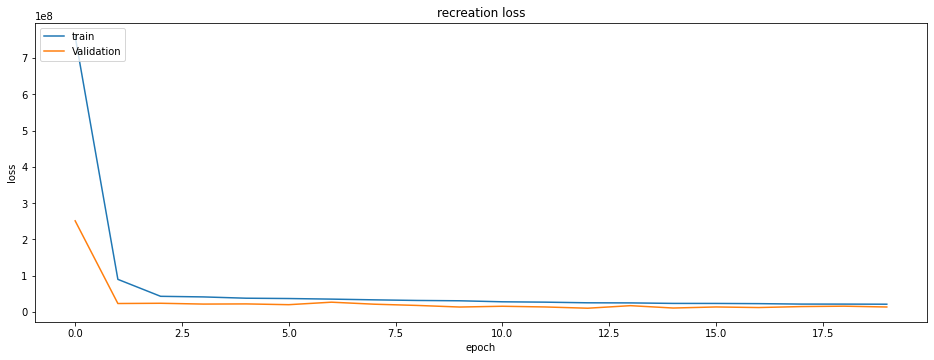

Intlier max value: 47532884.0 Index Val: 712
outlier max value: 90154410.0 Index Val: 0
outlier min value: 9804911.0 Index Val: 47


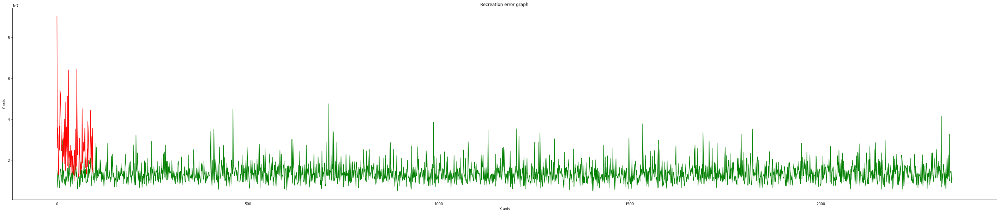

Total member in inlear: 2345
Total False alarm: 42
Total member in Outlier: 95
Total missed true alarm: 66
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2345
           1       0.41      0.31      0.35        95

    accuracy                           0.96      2440
   macro avg       0.69      0.64      0.66      2440
weighted avg       0.95      0.96      0.95      2440



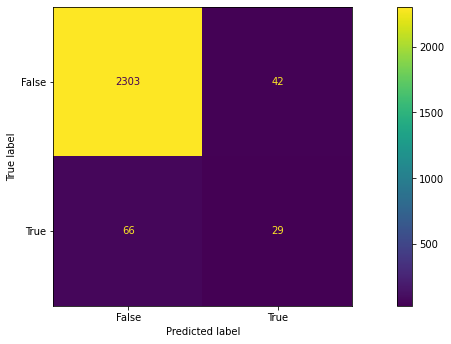

Epoch 1/20
59/59 [==============================] - 1s 10ms/step - loss: 770860672.0000 - val_loss: 126243480.0000
Epoch 2/20
59/59 [==============================] - 1s 11ms/step - loss: 60574940.0000 - val_loss: 23684360.0000
Epoch 3/20
59/59 [==============================] - 1s 17ms/step - loss: 45422748.0000 - val_loss: 24319842.0000
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 41131396.0000 - val_loss: 23807544.0000
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 38382120.0000 - val_loss: 26555246.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 36939512.0000 - val_loss: 26046392.0000
Epoch 7/20
59/59 [==============================] - 0s 7ms/step - loss: 36198556.0000 - val_loss: 21481998.0000
Epoch 8/20
59/59 [==============================] - 0s 7ms/step - loss: 34657048.0000 - val_loss: 20771100.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 32336484.0000 - val_loss: 2

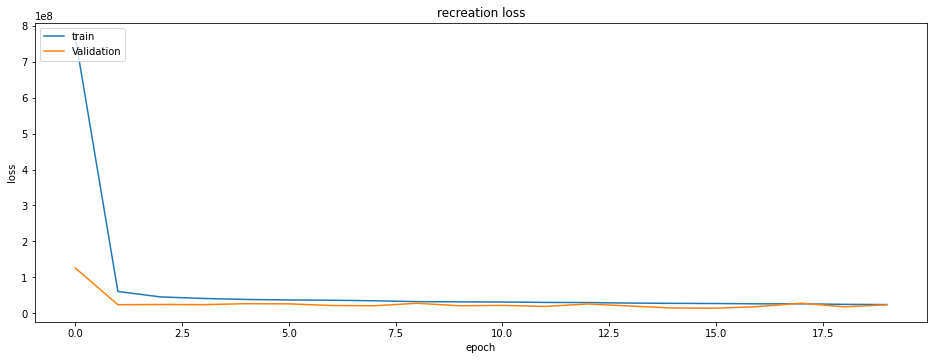

Intlier max value: 70842480.0 Index Val: 712
outlier max value: 116399330.0 Index Val: 0
outlier min value: 15690620.0 Index Val: 47


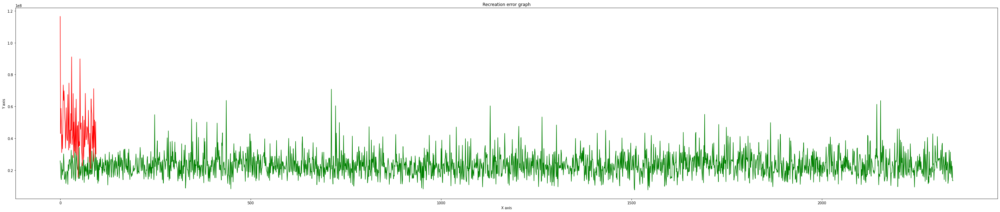

Total member in inlear: 2345
Total False alarm: 25
Total member in Outlier: 95
Total missed true alarm: 49
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2345
           1       0.65      0.48      0.55        95

    accuracy                           0.97      2440
   macro avg       0.81      0.74      0.77      2440
weighted avg       0.97      0.97      0.97      2440



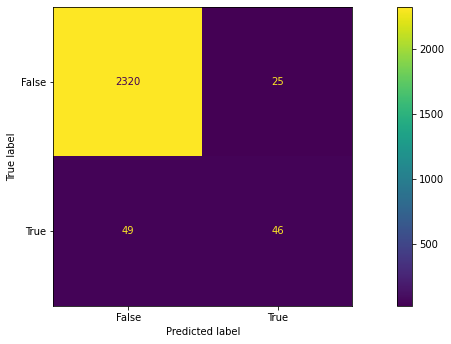

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 950281728.0000 - val_loss: 213718816.0000
Epoch 2/20
59/59 [==============================] - 0s 7ms/step - loss: 97108280.0000 - val_loss: 26377268.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 45055344.0000 - val_loss: 27588680.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 38286552.0000 - val_loss: 25708338.0000
Epoch 5/20
59/59 [==============================] - 0s 7ms/step - loss: 37337404.0000 - val_loss: 28854240.0000
Epoch 6/20
59/59 [==============================] - 0s 7ms/step - loss: 34952056.0000 - val_loss: 30489532.0000
Epoch 7/20
59/59 [==============================] - 0s 7ms/step - loss: 32925170.0000 - val_loss: 31895772.0000
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 31991646.0000 - val_loss: 40009884.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 30953380.0000 - val_loss: 3558

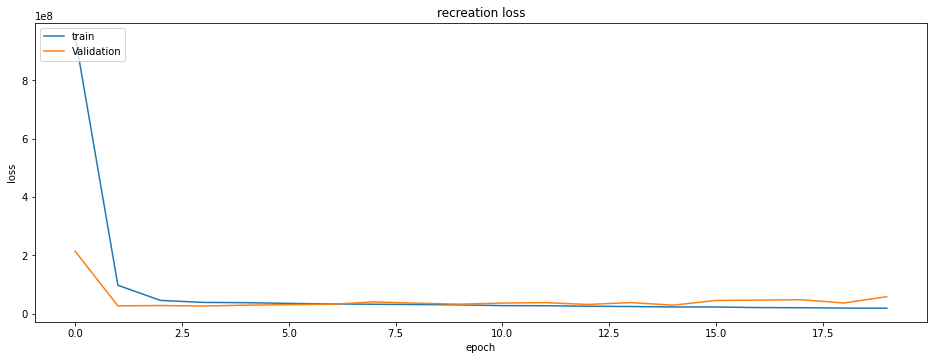

Intlier max value: 99533620.0 Index Val: 2334
outlier max value: 107699660.0 Index Val: 34
outlier min value: 25022118.0 Index Val: 47


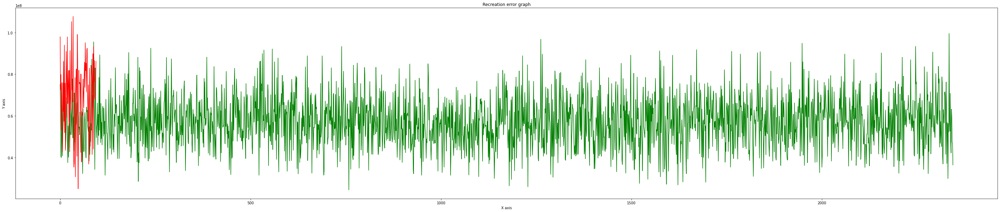

Total member in inlear: 2345
Total False alarm: 335
Total member in Outlier: 95
Total missed true alarm: 39
              precision    recall  f1-score   support

           0       0.98      0.86      0.91      2345
           1       0.14      0.59      0.23        95

    accuracy                           0.85      2440
   macro avg       0.56      0.72      0.57      2440
weighted avg       0.95      0.85      0.89      2440



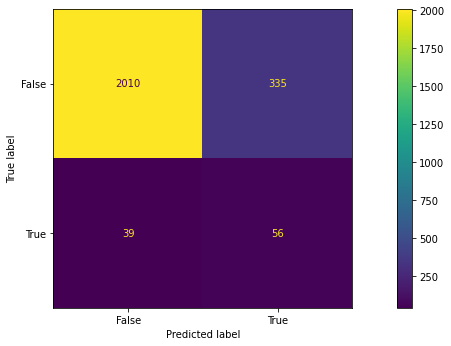

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 713258432.0000 - val_loss: 72896872.0000
Epoch 2/20
59/59 [==============================] - 0s 7ms/step - loss: 47260548.0000 - val_loss: 22391198.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 39453424.0000 - val_loss: 20967160.0000
Epoch 4/20
59/59 [==============================] - 0s 7ms/step - loss: 37510840.0000 - val_loss: 21961224.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 33752012.0000 - val_loss: 21357596.0000
Epoch 6/20
59/59 [==============================] - 0s 7ms/step - loss: 32279450.0000 - val_loss: 23610770.0000
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 30608010.0000 - val_loss: 19673134.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 29187578.0000 - val_loss: 20674694.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 26450578.0000 - val_loss: 20874

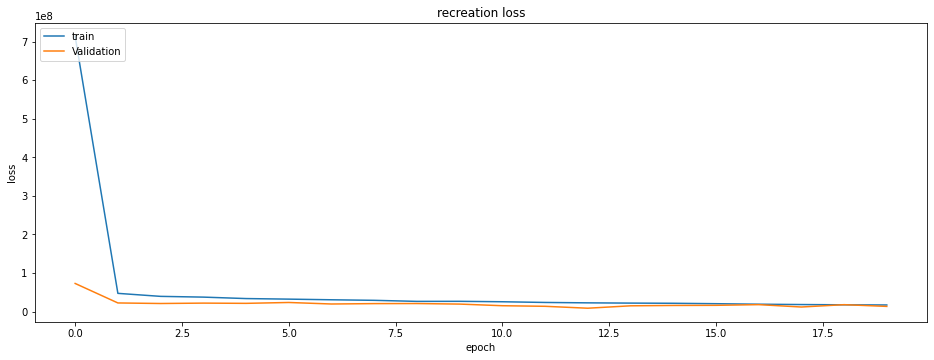

Intlier max value: 44432356.0 Index Val: 2154
outlier max value: 62281144.0 Index Val: 0
outlier min value: 4099077.2 Index Val: 80


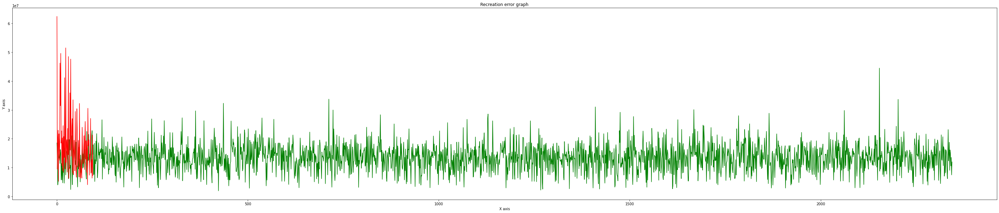

Total member in inlear: 2345
Total False alarm: 1602
Total member in Outlier: 95
Total missed true alarm: 31
              precision    recall  f1-score   support

           0       0.96      0.32      0.48      2345
           1       0.04      0.67      0.07        95

    accuracy                           0.33      2440
   macro avg       0.50      0.50      0.27      2440
weighted avg       0.92      0.33      0.46      2440



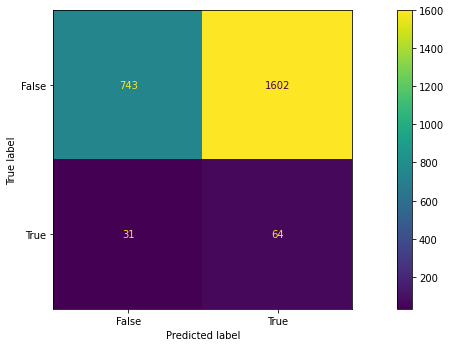

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 732164992.0000 - val_loss: 107917024.0000
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 64452540.0000 - val_loss: 22795360.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 46415880.0000 - val_loss: 23305950.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 39875796.0000 - val_loss: 27651348.0000
Epoch 5/20
59/59 [==============================] - 0s 7ms/step - loss: 36890528.0000 - val_loss: 30051496.0000
Epoch 6/20
59/59 [==============================] - 0s 7ms/step - loss: 34267436.0000 - val_loss: 37524916.0000
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 32882834.0000 - val_loss: 42974776.0000
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 30893776.0000 - val_loss: 35516552.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 28794766.0000 - val_loss: 3666

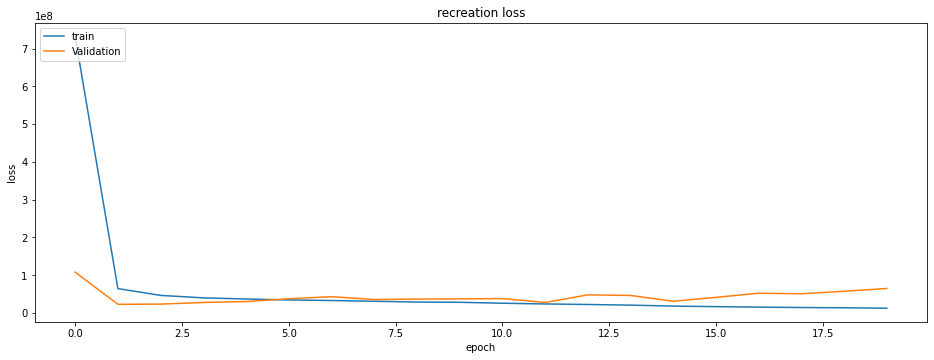

Intlier max value: 112691480.0 Index Val: 2334
outlier max value: 122099310.0 Index Val: 0
outlier min value: 26195882.0 Index Val: 9


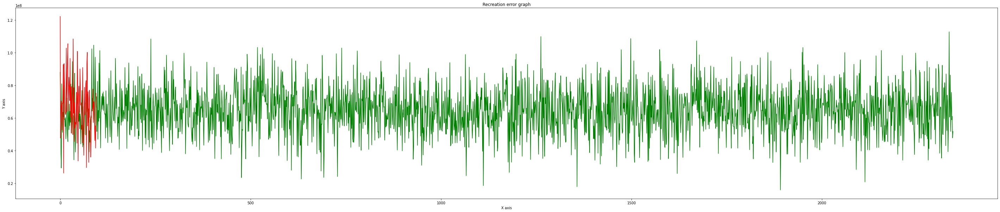

Total member in inlear: 2345
Total False alarm: 597
Total member in Outlier: 95
Total missed true alarm: 62
              precision    recall  f1-score   support

           0       0.97      0.75      0.84      2345
           1       0.05      0.35      0.09        95

    accuracy                           0.73      2440
   macro avg       0.51      0.55      0.47      2440
weighted avg       0.93      0.73      0.81      2440



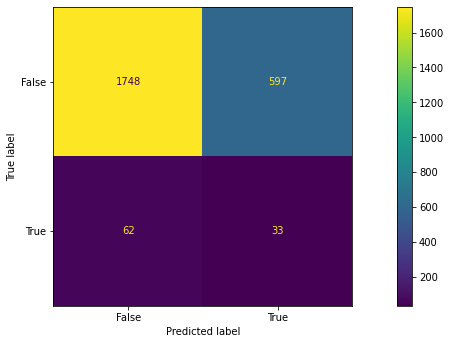

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 600052992.0000 - val_loss: 37057760.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 47895068.0000 - val_loss: 23838484.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 39748748.0000 - val_loss: 23060358.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 37485780.0000 - val_loss: 21170138.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 34681064.0000 - val_loss: 18546592.0000
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 33776904.0000 - val_loss: 17600906.0000
Epoch 7/20
59/59 [==============================] - 0s 7ms/step - loss: 30818400.0000 - val_loss: 15868792.0000
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 30108124.0000 - val_loss: 16062141.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 27978734.0000 - val_loss: 12362

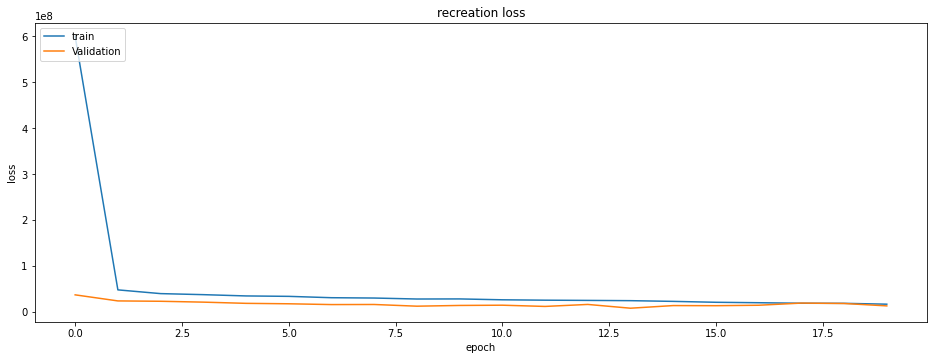

Intlier max value: 39228724.0 Index Val: 1534
outlier max value: 42855270.0 Index Val: 0
outlier min value: 5566008.0 Index Val: 37


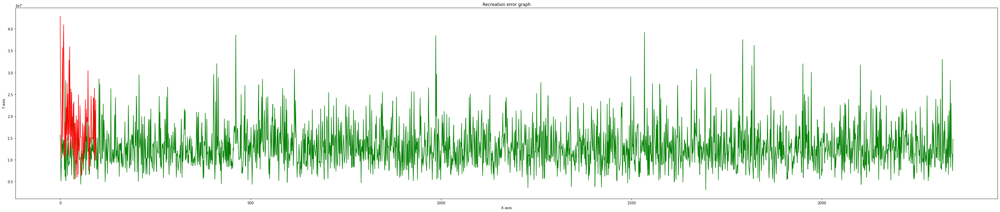

Total member in inlear: 2345
Total False alarm: 536
Total member in Outlier: 95
Total missed true alarm: 45
              precision    recall  f1-score   support

           0       0.98      0.77      0.86      2345
           1       0.09      0.53      0.15        95

    accuracy                           0.76      2440
   macro avg       0.53      0.65      0.50      2440
weighted avg       0.94      0.76      0.83      2440



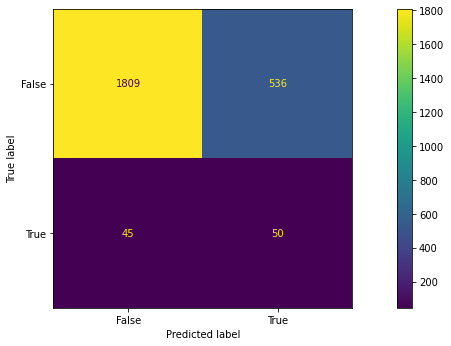

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 538749440.0000 - val_loss: 27429808.0000
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 50917588.0000 - val_loss: 25681706.0000
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 45327956.0000 - val_loss: 23126012.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 40629660.0000 - val_loss: 20785134.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 36217776.0000 - val_loss: 18478228.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 32319330.0000 - val_loss: 15745047.0000
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 30724098.0000 - val_loss: 17772408.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 28820460.0000 - val_loss: 14882617.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 27001384.0000 - val_loss: 15547

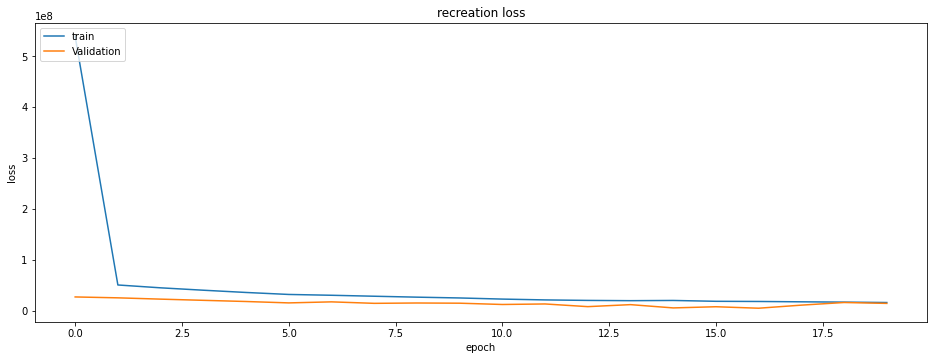

Intlier max value: 29217396.0 Index Val: 1948
outlier max value: 56985092.0 Index Val: 0
outlier min value: 5605192.0 Index Val: 47


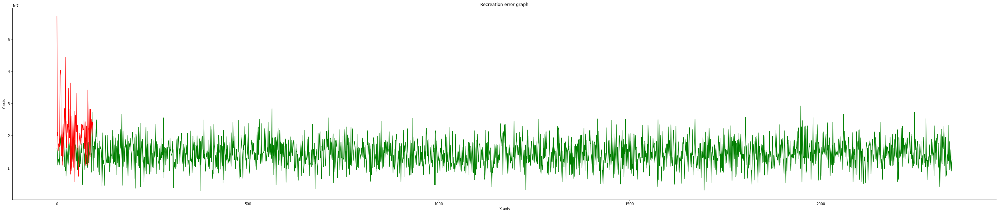

Total member in inlear: 2345
Total False alarm: 857
Total member in Outlier: 95
Total missed true alarm: 19
              precision    recall  f1-score   support

           0       0.99      0.63      0.77      2345
           1       0.08      0.80      0.15        95

    accuracy                           0.64      2440
   macro avg       0.53      0.72      0.46      2440
weighted avg       0.95      0.64      0.75      2440



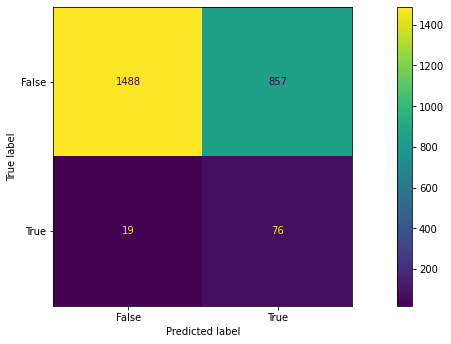

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 906598336.0000 - val_loss: 164858928.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 81505240.0000 - val_loss: 22802660.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 47786448.0000 - val_loss: 21446920.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 40670608.0000 - val_loss: 20416578.0000
Epoch 5/20
59/59 [==============================] - 0s 7ms/step - loss: 36230008.0000 - val_loss: 18788790.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 32682820.0000 - val_loss: 20812920.0000
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 31136802.0000 - val_loss: 19217258.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 29043142.0000 - val_loss: 21199602.0000
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 27715020.0000 - val_loss: 2129

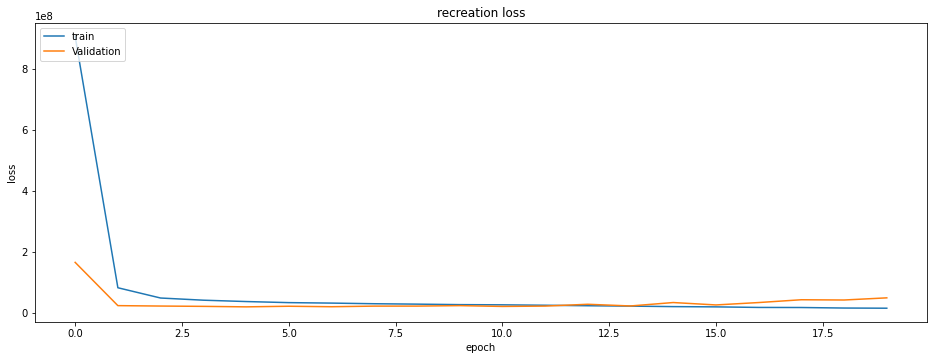

Intlier max value: 81756130.0 Index Val: 1948
outlier max value: 89034680.0 Index Val: 45
outlier min value: 19765752.0 Index Val: 36


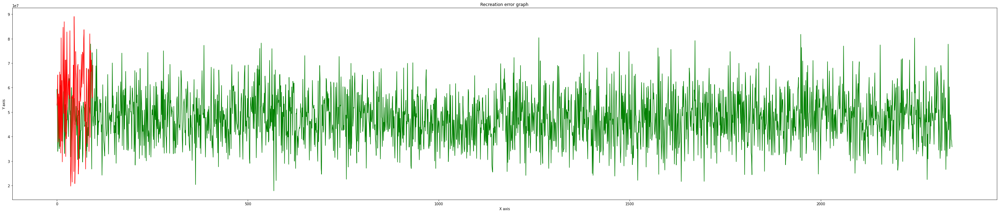

Total member in inlear: 2345
Total False alarm: 510
Total member in Outlier: 95
Total missed true alarm: 36
              precision    recall  f1-score   support

           0       0.98      0.78      0.87      2345
           1       0.10      0.62      0.18        95

    accuracy                           0.78      2440
   macro avg       0.54      0.70      0.52      2440
weighted avg       0.95      0.78      0.84      2440



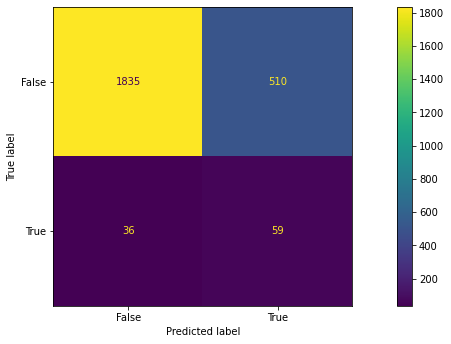

Epoch 1/20
59/59 [==============================] - 2s 10ms/step - loss: 632428992.0000 - val_loss: 38727732.0000
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 55433120.0000 - val_loss: 22900754.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 49124040.0000 - val_loss: 21750774.0000
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 42977832.0000 - val_loss: 20438986.0000
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 38381016.0000 - val_loss: 20138490.0000
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 35883416.0000 - val_loss: 16995494.0000
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 34196620.0000 - val_loss: 19642028.0000
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 31570922.0000 - val_loss: 15552067.0000
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 30299398.0000 - val_loss: 1324

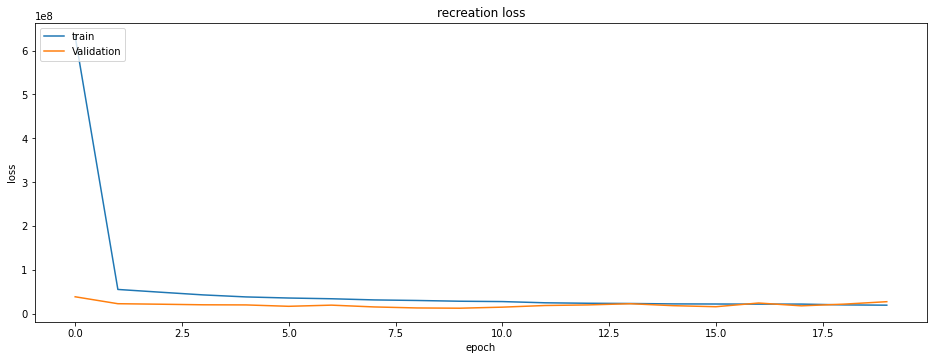

Intlier max value: 58616036.0 Index Val: 712
outlier max value: 72011950.0 Index Val: 30
outlier min value: 11349879.0 Index Val: 47


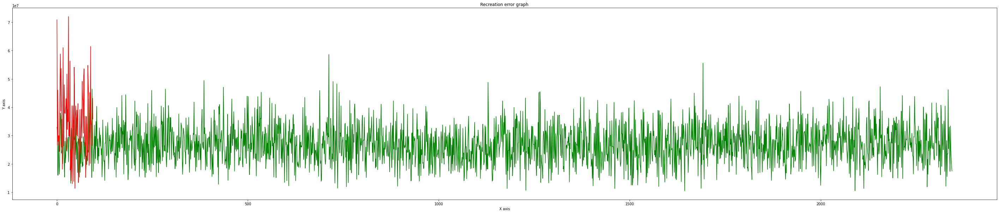

Total member in inlear: 2345
Total False alarm: 535
Total member in Outlier: 95
Total missed true alarm: 39
              precision    recall  f1-score   support

           0       0.98      0.77      0.86      2345
           1       0.09      0.59      0.16        95

    accuracy                           0.76      2440
   macro avg       0.54      0.68      0.51      2440
weighted avg       0.94      0.76      0.84      2440



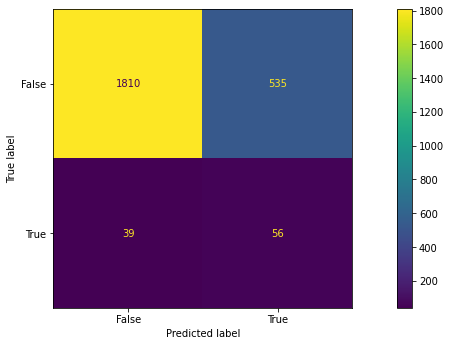

Epoch 1/20
59/59 [==============================] - 1s 10ms/step - loss: 915091520.0000 - val_loss: 642949312.0000
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 625740224.0000 - val_loss: 622718336.0000
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 622400768.0000 - val_loss: 623198592.0000
Epoch 4/20
59/59 [==============================] - 0s 7ms/step - loss: 620366912.0000 - val_loss: 622504704.0000
Epoch 5/20
59/59 [==============================] - 0s 8ms/step - loss: 618633152.0000 - val_loss: 621314880.0000
Epoch 6/20
59/59 [==============================] - 0s 7ms/step - loss: 617517184.0000 - val_loss: 622091072.0000
Epoch 7/20
59/59 [==============================] - 0s 7ms/step - loss: 615960384.0000 - val_loss: 622128128.0000
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 613936512.0000 - val_loss: 618120384.0000
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 612760256.0000 

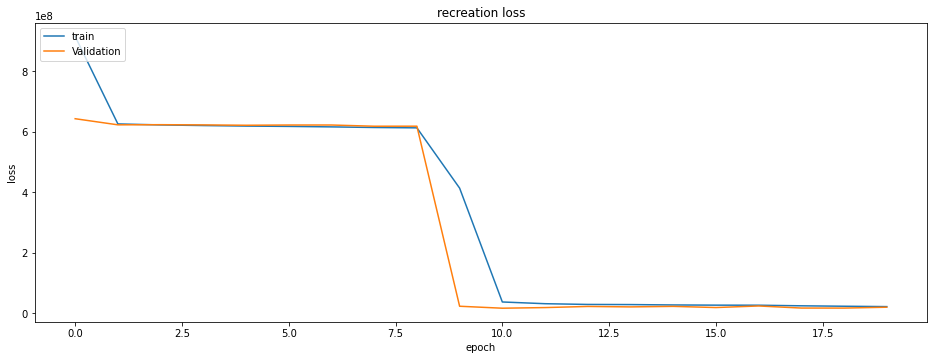

Intlier max value: 56097384.0 Index Val: 2154
outlier max value: 141221390.0 Index Val: 0
outlier min value: 11880420.0 Index Val: 47


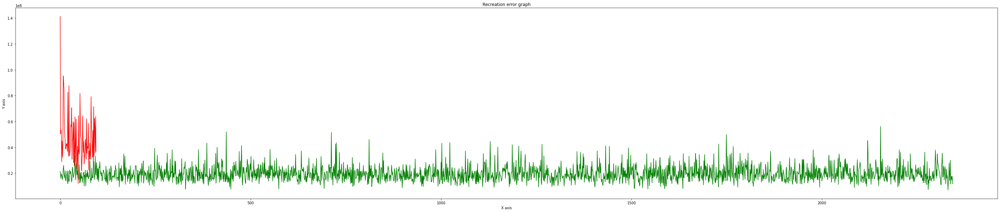

Total member in inlear: 2345
Total False alarm: 74
Total member in Outlier: 95
Total missed true alarm: 21
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      2345
           1       0.50      0.78      0.61        95

    accuracy                           0.96      2440
   macro avg       0.75      0.87      0.79      2440
weighted avg       0.97      0.96      0.97      2440



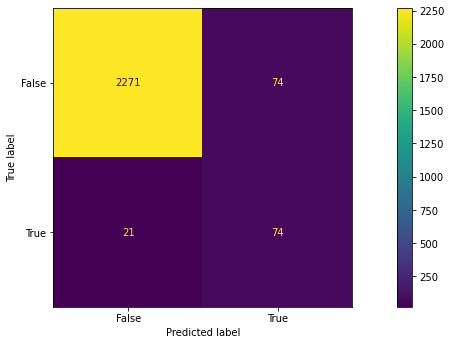

trecall_max: 0.9684434968017057 frecall_max: 0.7789473684210526 Count: 3


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn/assets


In [ ]:
# Inputs for PWF model:
w = 4
epochs = 20
# Get Raw Data for PWF
#fFiled = 'machineFailure'
fFiled = 'PWF'
rd, rd_o = rawDataload()
md = OnlyPWF(rd_o)
#md = rd_o

# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only pow related field
XPopIndex = [0,1,4,5,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 1
trn = np.power(XT, amp)
tst = np.power(XTs, amp)

# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
#m1, history = m1_pwf_1dcnn(Tr_w,epochs)
#m1_pwf , history = m1_pwf_1dcnn(Tr_w,epochs)
while count < 5:
    # Build,train the Model
    m1_pwf , history = m1_pwf_1dcnn(Tr_w,epochs)
    m1 = m1_pwf
    # Check model accuracy
    print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
    plt_model_accuracy(history)
    inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1)
    #outlier cut-off point:
    oc_pwf = min(outlier_lst)
    oc_pwf = oc_pwf+oc_pwf*1.8
    oc = oc_pwf
    mat1 = confusionMatrix(oc_pwf,inlier_lst,outlier_lst)
    trecall = mat1['0']['recall']
    frecall = mat1['1']['recall']
    if trecall_max <= trecall and frecall_max <= frecall:
        trecall_max = trecall
        frecall_max = frecall
        count+=1
        print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
        m1.save(m1_path)
        if count == 3:
            break
    inf+=1
    if inf > 20:
        break

[ 2695.     70.  85924.8]
Mounted at /content/gdrive
Folder already exist
Intlier max value: 56097384.0 Index Val: 2154
outlier max value: 141221390.0 Index Val: 0
outlier min value: 11880420.0 Index Val: 47


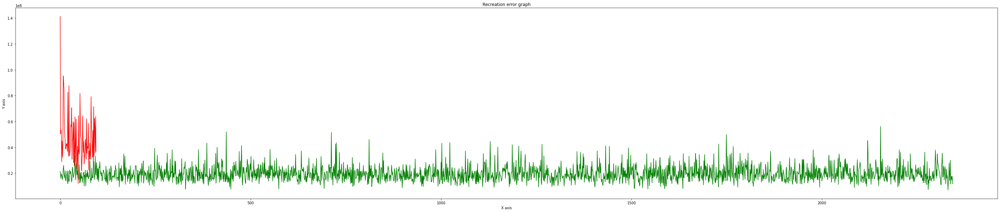

Total member in inlear: 2345
Total False alarm: 212
Total member in Outlier: 95
Total missed true alarm: 7
              precision    recall  f1-score   support

           0       1.00      0.91      0.95      2345
           1       0.29      0.93      0.45        95

    accuracy                           0.91      2440
   macro avg       0.65      0.92      0.70      2440
weighted avg       0.97      0.91      0.93      2440



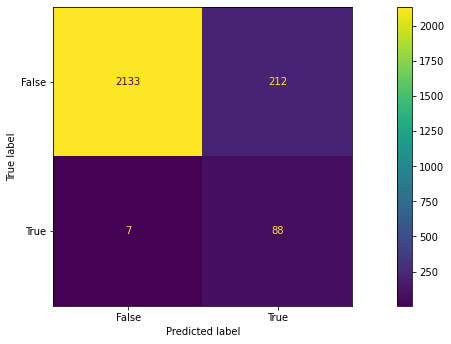

In [ ]:
# Check the oc level value and final freezed model
# Inputs for PWF model:
w = 4
epochs = 20
# Get Raw Data for PWF
#fFiled = 'machineFailure'
fFiled = 'PWF'
rd, rd_o = rawDataload()
md = OnlyPWF(rd_o)
#md = rd_o

# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only pow related field
XPopIndex = [0,1,4,5,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 1
trn = np.power(XT, amp)
tst = np.power(XTs, amp)

# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)*max_value
testN = (tst/max_value)*max_value
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m1_pwf_1dcnn_freezed'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
#m1, history = m1_pwf_1dcnn(Tr_w,epochs)
#m1_pwf , history = m1_pwf_1dcnn(Tr_w,epochs)

# load the model
m1_load = tf.keras.models.load_model(m1_path)
inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1_load)
#outlier cut-off point:
oc_pwf = min(outlier_lst)
oc_pwf = oc_pwf+oc_pwf*1.3
oc = oc_pwf
mat1 = confusionMatrix(oc_pwf,inlier_lst,outlier_lst)

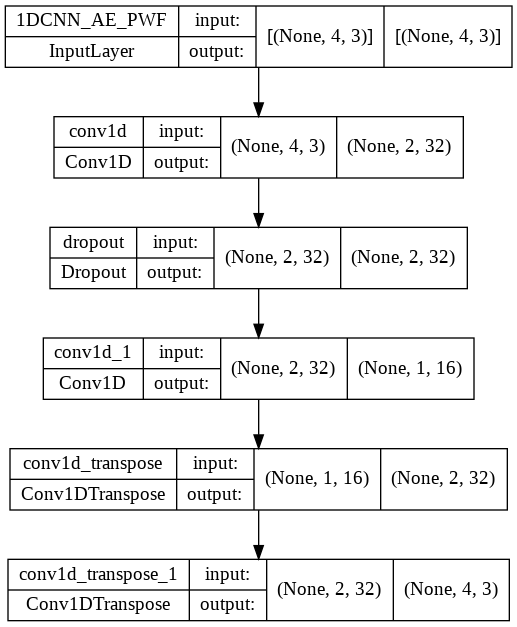

In [ ]:
# Model graph view
tf.keras.utils.plot_model(m1_load, show_shapes=True)

#### OSF Model freezed

[1.681e+09 9.009e+11 4.613e+28 1.000e+00 1.000e+00 1.000e+00]
Mounted at /content/gdrive
Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1167 - val_loss: 0.0812
Epoch 2/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0649 - val_loss: 0.0444
Epoch 3/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0347 - val_loss: 0.0243
Epoch 4/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0242 - val_loss: 0.0177
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0184 - val_loss: 0.0125
Epoch 6/20
59/59 [==============================] - 0s 8ms/step - loss: 0.0146 - val_loss: 0.0085
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0119 - val_loss: 0.0061
Epoch 8/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0096 - val_loss: 0.0044
Epoch 9/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0087 - val_loss: 0.0038
Epoch 10/20
59/59 [==========

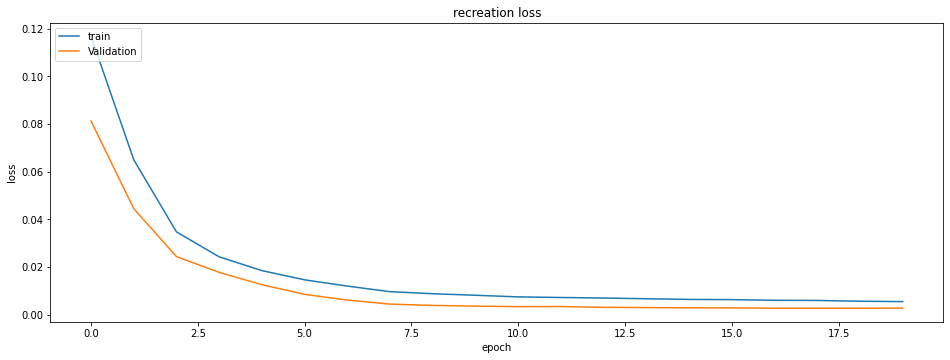

Intlier max value: 0.044595994 Index Val: 1655
outlier max value: 0.07961477 Index Val: 86
outlier min value: 0.0029478658 Index Val: 67


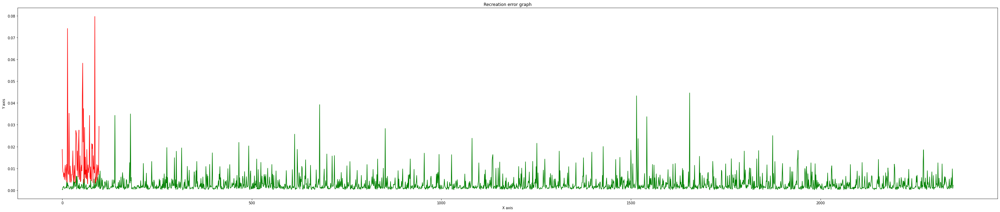

Total member in inlear: 2351
Total False alarm: 547
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.77      0.87      2351
           1       0.15      0.98      0.26        98

    accuracy                           0.78      2449
   macro avg       0.57      0.87      0.56      2449
weighted avg       0.96      0.78      0.84      2449



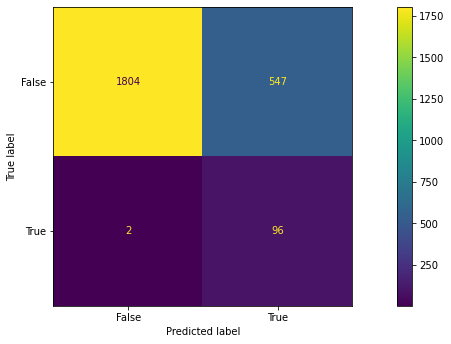

trecall_max: 0.767333049766057 frecall_max: 0.9795918367346939 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1181 - val_loss: 0.0769
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0641 - val_loss: 0.0451
Epoch 3/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0330 - val_loss: 0.0212
Epoch 4/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0223 - val_loss: 0.0167
Epoch 5/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0187 - val_loss: 0.0135
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0160 - val_loss: 0.0111
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0139 - val_loss: 0.0079
Epoch 8/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0114 - val_loss: 0.0054
Epoch 9/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0095 - val_loss: 0.0043
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0084 - val_loss: 0.0039
Epoch 11/20
59/59 [

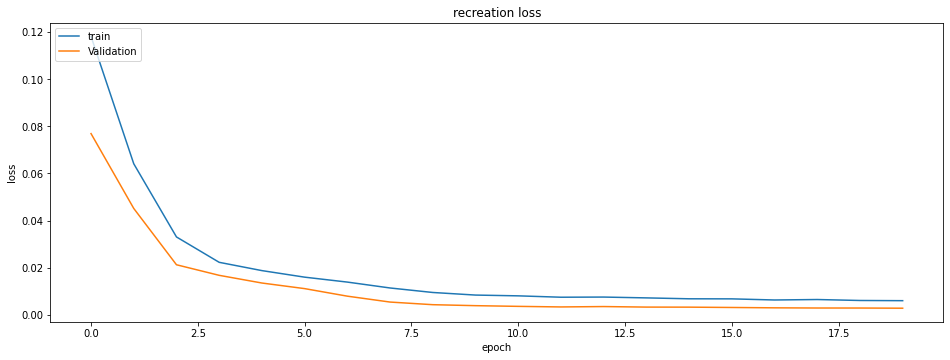

Intlier max value: 0.059610263 Index Val: 139
outlier max value: 0.07687837 Index Val: 54
outlier min value: 0.0023104479 Index Val: 87


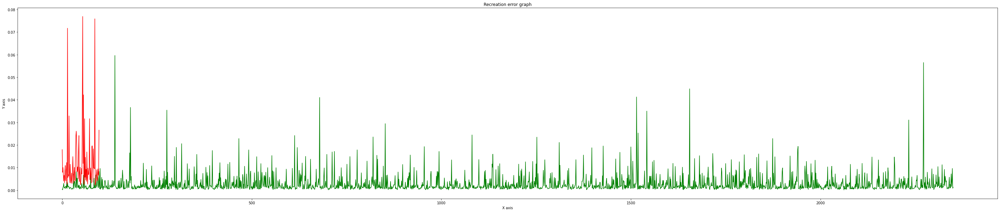

Total member in inlear: 2351
Total False alarm: 663
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.72      0.84      2351
           1       0.13      0.98      0.22        98

    accuracy                           0.73      2449
   macro avg       0.56      0.85      0.53      2449
weighted avg       0.96      0.73      0.81      2449



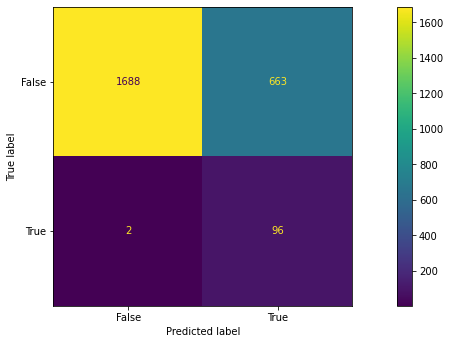

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1302 - val_loss: 0.0844
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0627 - val_loss: 0.0431
Epoch 3/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0342 - val_loss: 0.0214
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0201 - val_loss: 0.0117
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0143 - val_loss: 0.0067
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0111 - val_loss: 0.0049
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0096 - val_loss: 0.0041
Epoch 8/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0084 - val_loss: 0.0035
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0077 - val_loss: 0.0031
Epoch 10/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0073 - val_loss: 0.0029
Epoch 11/20
59/59 [

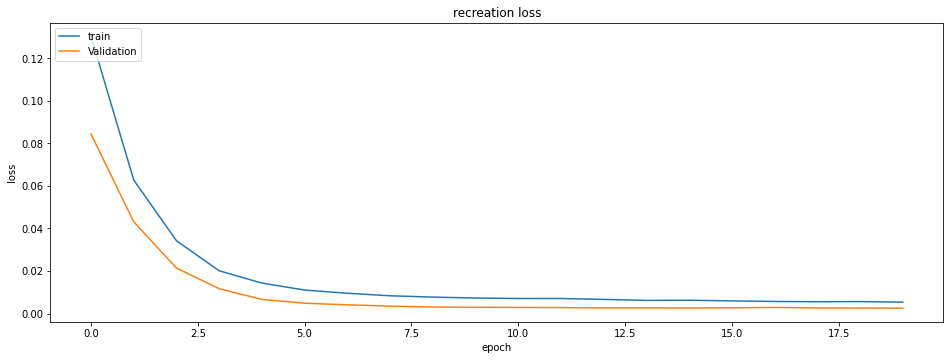

Intlier max value: 0.045447372 Index Val: 1655
outlier max value: 0.07520146 Index Val: 86
outlier min value: 0.0024569905 Index Val: 57


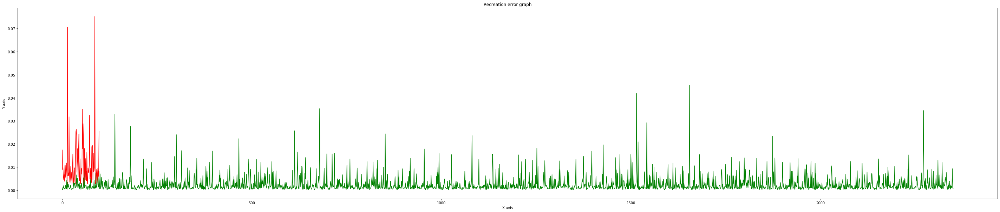

Total member in inlear: 2351
Total False alarm: 601
Total member in Outlier: 98
Total missed true alarm: 3
              precision    recall  f1-score   support

           0       1.00      0.74      0.85      2351
           1       0.14      0.97      0.24        98

    accuracy                           0.75      2449
   macro avg       0.57      0.86      0.55      2449
weighted avg       0.96      0.75      0.83      2449



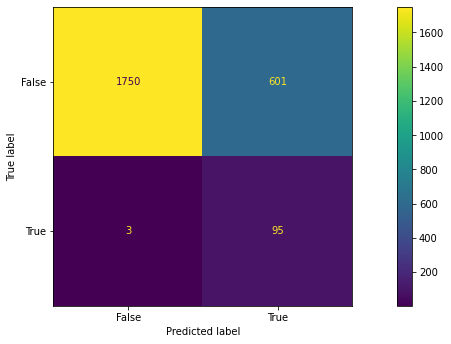

Epoch 1/20
59/59 [==============================] - 1s 6ms/step - loss: 0.1393 - val_loss: 0.1027
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0813 - val_loss: 0.0513
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0378 - val_loss: 0.0224
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0222 - val_loss: 0.0146
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0166 - val_loss: 0.0089
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0126 - val_loss: 0.0058
Epoch 7/20
59/59 [==============================] - 0s 3ms/step - loss: 0.0106 - val_loss: 0.0045
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0094 - val_loss: 0.0041
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0087 - val_loss: 0.0037
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0081 - val_loss: 0.0035
Epoch 11/20
59/59 [

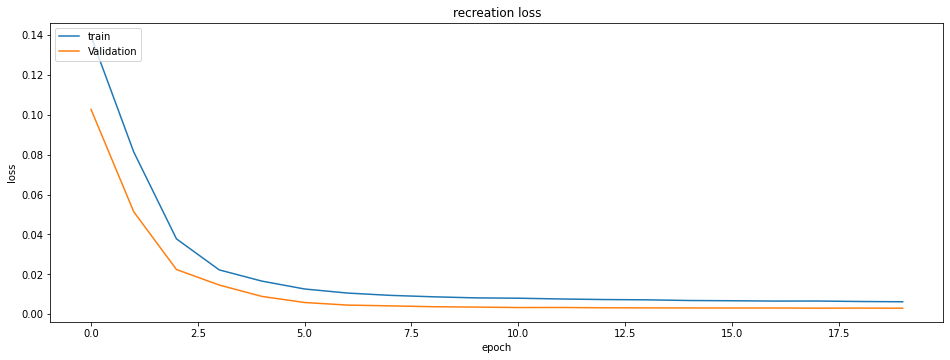

Intlier max value: 0.055707518 Index Val: 1655
outlier max value: 0.07716325 Index Val: 86
outlier min value: 0.0069920872 Index Val: 49


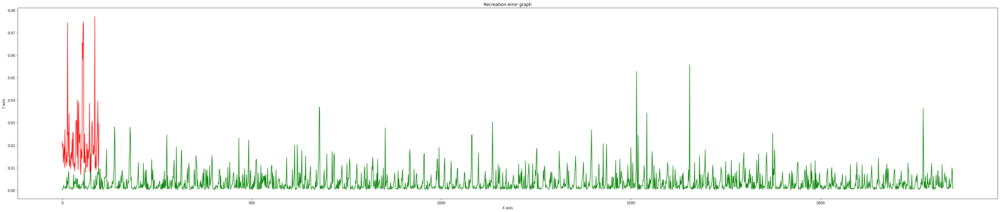

Total member in inlear: 2351
Total False alarm: 276
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.88      0.94      2351
           1       0.26      0.99      0.41        98

    accuracy                           0.89      2449
   macro avg       0.63      0.94      0.67      2449
weighted avg       0.97      0.89      0.92      2449



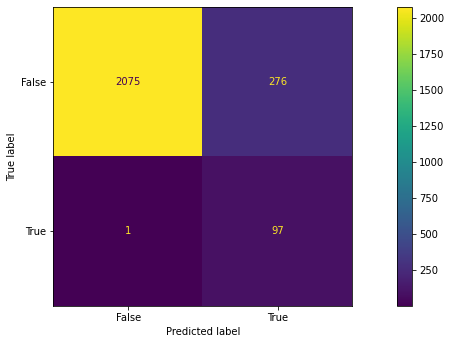

trecall_max: 0.8826031475967673 frecall_max: 0.9897959183673469 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn/assets


Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1270 - val_loss: 0.0852
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0671 - val_loss: 0.0454
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0332 - val_loss: 0.0176
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0181 - val_loss: 0.0097
Epoch 5/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0126 - val_loss: 0.0055
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0102 - val_loss: 0.0042
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0091 - val_loss: 0.0035
Epoch 8/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0083 - val_loss: 0.0033
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0074 - val_loss: 0.0030
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0072 - val_loss: 0.0029
Epoch 11/20
59/59 [

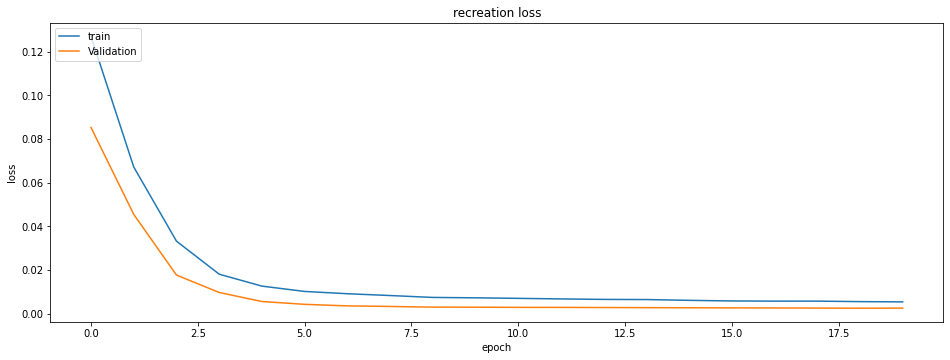

Intlier max value: 0.045269106 Index Val: 1655
outlier max value: 0.07620449 Index Val: 86
outlier min value: 0.0028570194 Index Val: 57


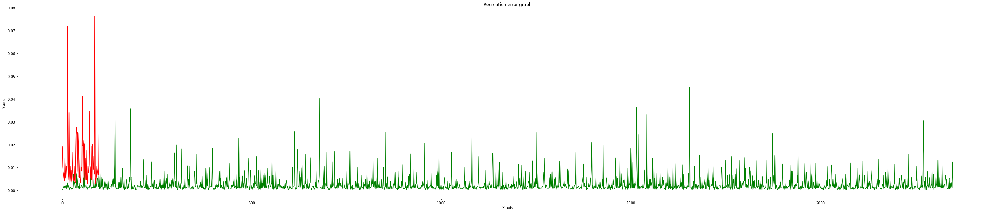

Total member in inlear: 2351
Total False alarm: 517
Total member in Outlier: 98
Total missed true alarm: 6
              precision    recall  f1-score   support

           0       1.00      0.78      0.88      2351
           1       0.15      0.94      0.26        98

    accuracy                           0.79      2449
   macro avg       0.57      0.86      0.57      2449
weighted avg       0.96      0.79      0.85      2449



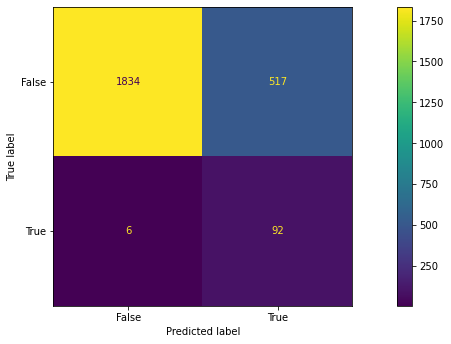

Epoch 1/20
59/59 [==============================] - 1s 6ms/step - loss: 0.1230 - val_loss: 0.0799
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0623 - val_loss: 0.0422
Epoch 3/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0331 - val_loss: 0.0199
Epoch 4/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0208 - val_loss: 0.0142
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0163 - val_loss: 0.0105
Epoch 6/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0130 - val_loss: 0.0072
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0109 - val_loss: 0.0053
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0094 - val_loss: 0.0043
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0085 - val_loss: 0.0039
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0080 - val_loss: 0.0038
Epoch 11/20
59/59 [

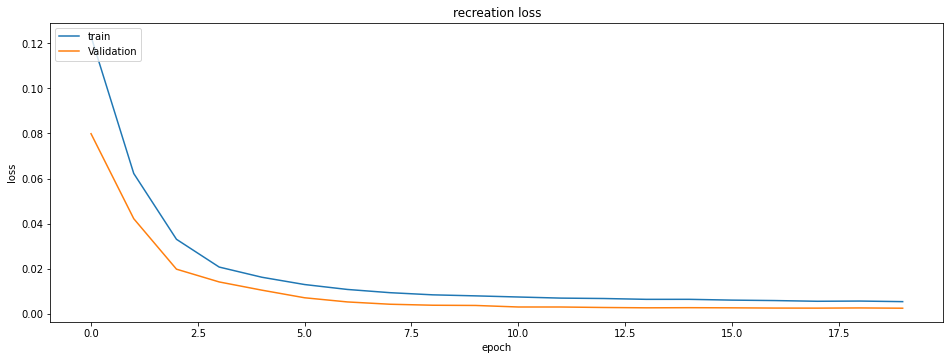

Intlier max value: 0.044946738 Index Val: 139
outlier max value: 0.07603509 Index Val: 86
outlier min value: 0.0025211948 Index Val: 87


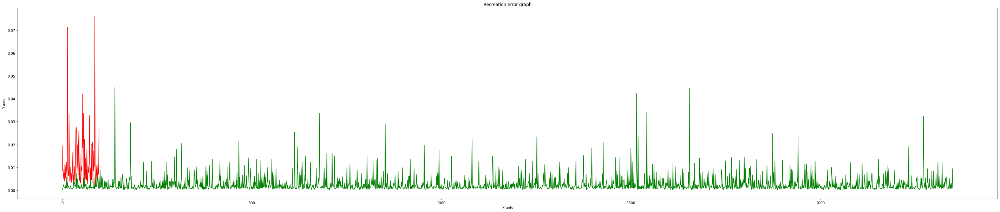

Total member in inlear: 2351
Total False alarm: 587
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.75      0.86      2351
           1       0.14      0.98      0.25        98

    accuracy                           0.76      2449
   macro avg       0.57      0.86      0.55      2449
weighted avg       0.96      0.76      0.83      2449



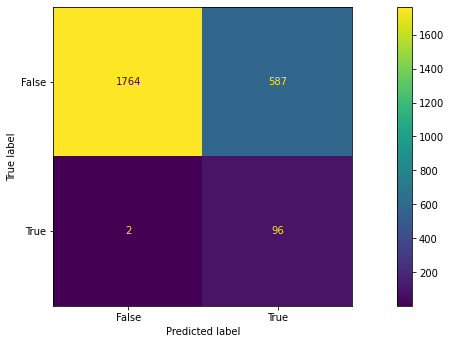

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1298 - val_loss: 0.0859
Epoch 2/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0657 - val_loss: 0.0469
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0355 - val_loss: 0.0230
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0236 - val_loss: 0.0181
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0203 - val_loss: 0.0143
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0161 - val_loss: 0.0089
Epoch 7/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0115 - val_loss: 0.0044
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0092 - val_loss: 0.0035
Epoch 9/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0081 - val_loss: 0.0030
Epoch 10/20
59/59 [==============================] - 0s 4ms/step - loss: 0.0075 - val_loss: 0.0030
Epoch 11/20
59/59 [

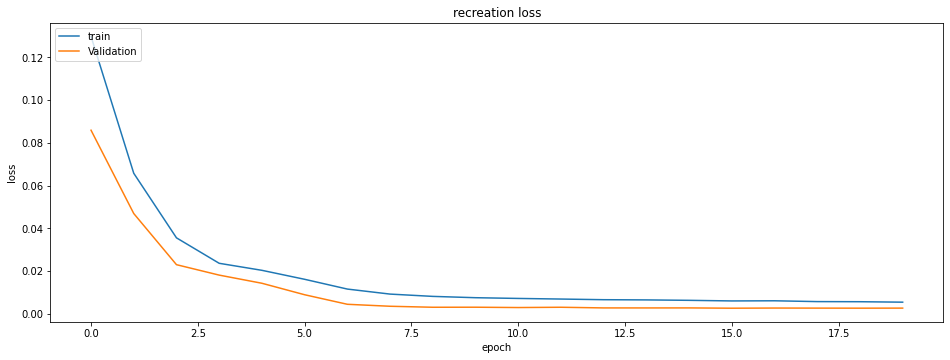

Intlier max value: 0.04511743 Index Val: 1655
outlier max value: 0.07568098 Index Val: 86
outlier min value: 0.0023566582 Index Val: 87


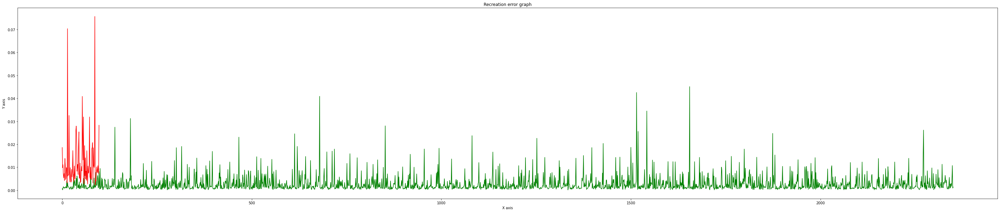

Total member in inlear: 2351
Total False alarm: 701
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.70      0.82      2351
           1       0.12      0.99      0.22        98

    accuracy                           0.71      2449
   macro avg       0.56      0.85      0.52      2449
weighted avg       0.96      0.71      0.80      2449



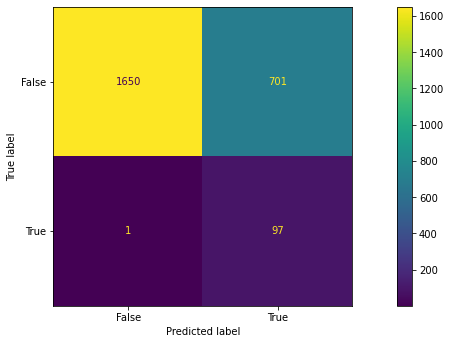

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1163 - val_loss: 0.0755
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0622 - val_loss: 0.0421
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0341 - val_loss: 0.0243
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0253 - val_loss: 0.0186
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0213 - val_loss: 0.0151
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0190 - val_loss: 0.0141
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0180 - val_loss: 0.0139
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0174 - val_loss: 0.0134
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0167 - val_loss: 0.0128
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0160 - val_loss: 0.0124
Epoch 11/20
59/59 [

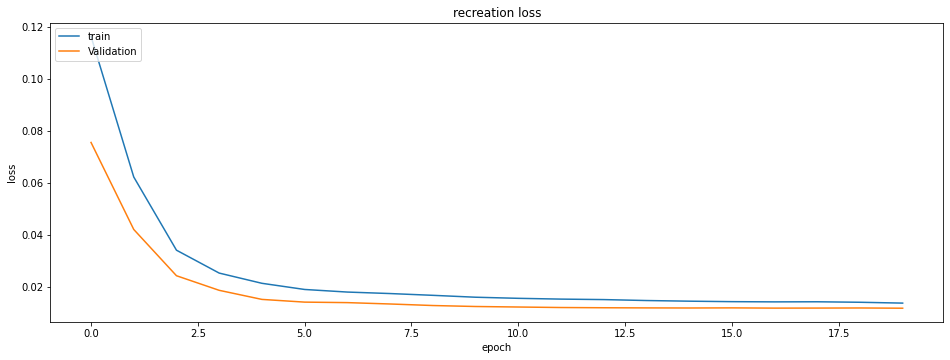

Intlier max value: 0.094729714 Index Val: 2196
outlier max value: 0.08896025 Index Val: 42
outlier min value: 0.0021712165 Index Val: 87


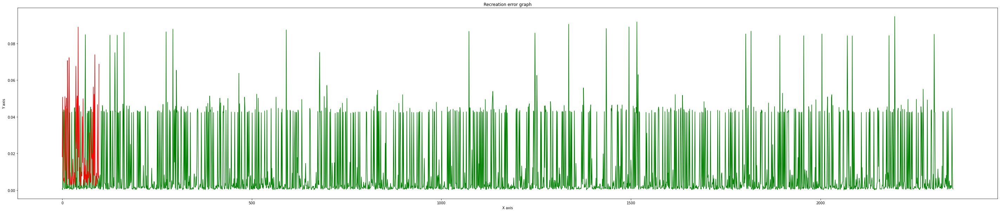

Total member in inlear: 2351
Total False alarm: 997
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.58      0.73      2351
           1       0.09      0.98      0.16        98

    accuracy                           0.59      2449
   macro avg       0.54      0.78      0.45      2449
weighted avg       0.96      0.59      0.71      2449



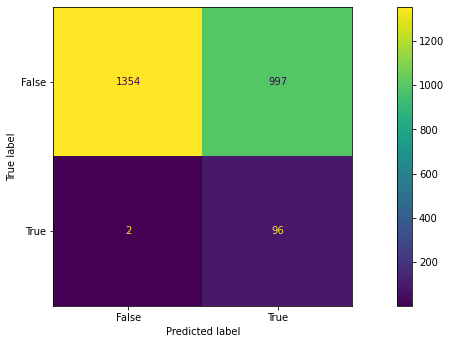

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1326 - val_loss: 0.0865
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0638 - val_loss: 0.0419
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0328 - val_loss: 0.0218
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0226 - val_loss: 0.0171
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0193 - val_loss: 0.0138
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0161 - val_loss: 0.0098
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0130 - val_loss: 0.0068
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0108 - val_loss: 0.0050
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0095 - val_loss: 0.0044
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0086 - val_loss: 0.0036
Epoch 11/20
59/59 [

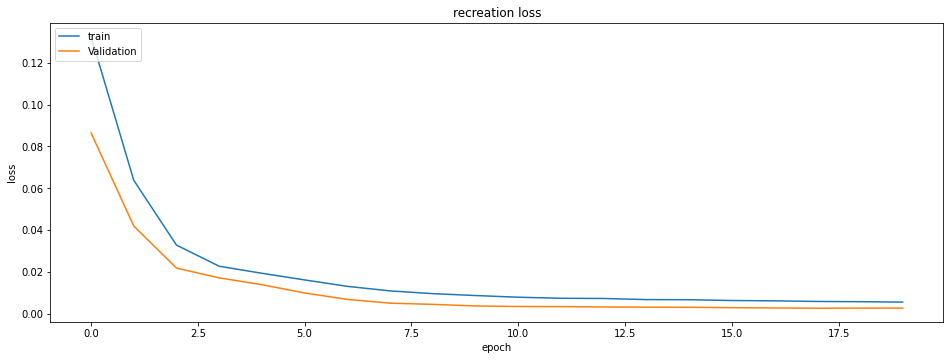

Intlier max value: 0.04669344 Index Val: 679
outlier max value: 0.0727604 Index Val: 86
outlier min value: 0.002229663 Index Val: 13


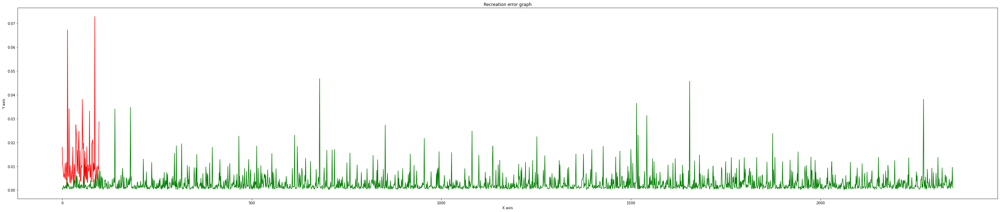

Total member in inlear: 2351
Total False alarm: 704
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.70      0.82      2351
           1       0.12      0.99      0.22        98

    accuracy                           0.71      2449
   macro avg       0.56      0.85      0.52      2449
weighted avg       0.96      0.71      0.80      2449



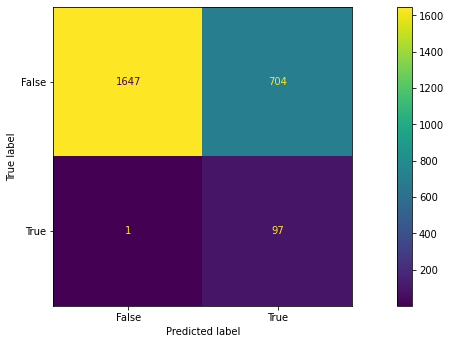

Epoch 1/20
59/59 [==============================] - 1s 7ms/step - loss: 0.1137 - val_loss: 0.0782
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0590 - val_loss: 0.0355
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0280 - val_loss: 0.0186
Epoch 4/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0206 - val_loss: 0.0153
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0178 - val_loss: 0.0137
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0164 - val_loss: 0.0123
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0148 - val_loss: 0.0108
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0132 - val_loss: 0.0092
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0113 - val_loss: 0.0077
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0101 - val_loss: 0.0070
Epoch 11/20
59/59 [

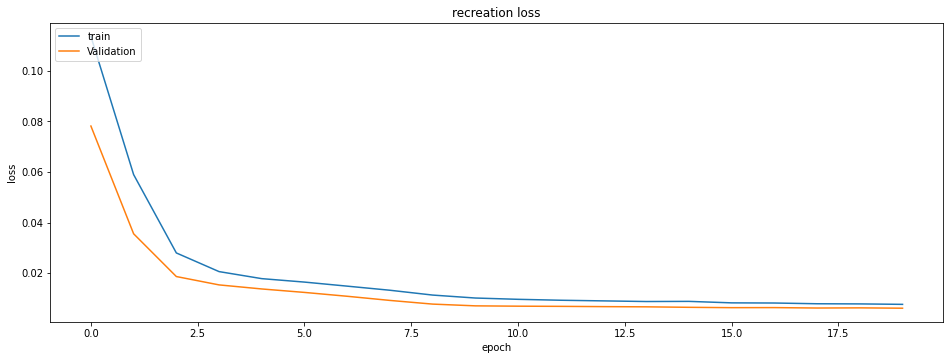

Intlier max value: 0.09563211 Index Val: 2223
outlier max value: 0.07574797 Index Val: 86
outlier min value: 0.0023255479 Index Val: 13


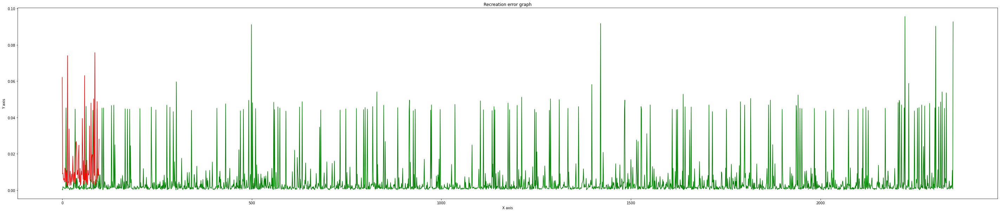

Total member in inlear: 2351
Total False alarm: 701
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.70      0.82      2351
           1       0.12      0.98      0.21        98

    accuracy                           0.71      2449
   macro avg       0.56      0.84      0.52      2449
weighted avg       0.96      0.71      0.80      2449



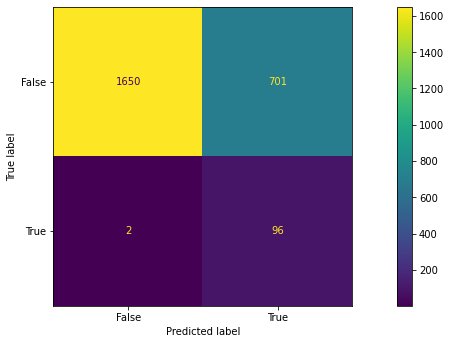

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.1248 - val_loss: 0.0822
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0650 - val_loss: 0.0438
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0344 - val_loss: 0.0219
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0225 - val_loss: 0.0158
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0179 - val_loss: 0.0103
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0131 - val_loss: 0.0064
Epoch 7/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0107 - val_loss: 0.0047
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0096 - val_loss: 0.0041
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0086 - val_loss: 0.0035
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0081 - val_loss: 0.0033
Epoch 11/20
59/59 [

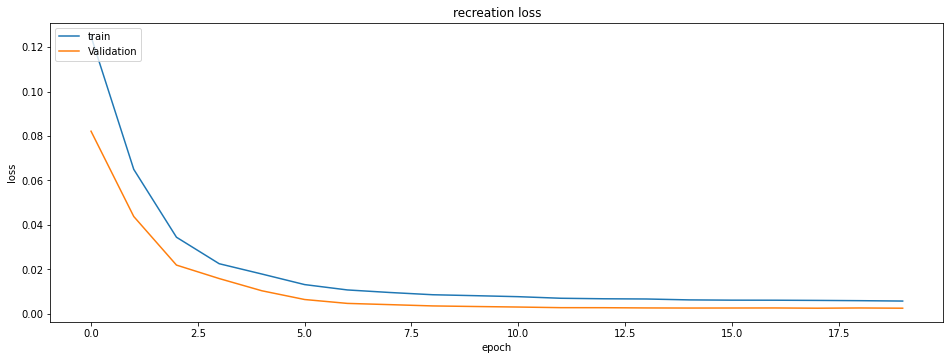

Intlier max value: 0.04507608 Index Val: 1655
outlier max value: 0.07561375 Index Val: 86
outlier min value: 0.0025843703 Index Val: 67


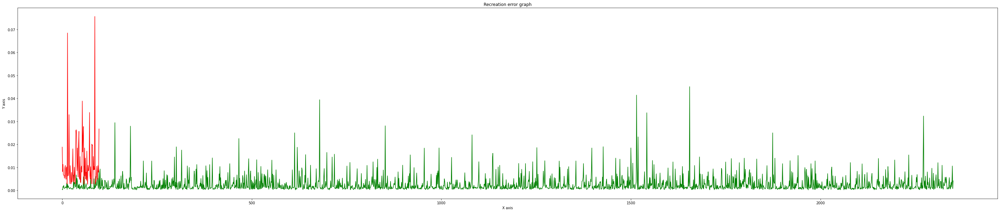

Total member in inlear: 2351
Total False alarm: 581
Total member in Outlier: 98
Total missed true alarm: 6
              precision    recall  f1-score   support

           0       1.00      0.75      0.86      2351
           1       0.14      0.94      0.24        98

    accuracy                           0.76      2449
   macro avg       0.57      0.85      0.55      2449
weighted avg       0.96      0.76      0.83      2449



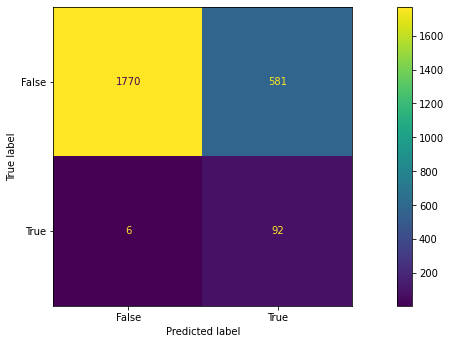

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.1189 - val_loss: 0.0749
Epoch 2/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0594 - val_loss: 0.0376
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0291 - val_loss: 0.0184
Epoch 4/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0202 - val_loss: 0.0143
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0171 - val_loss: 0.0121
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0157 - val_loss: 0.0103
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0136 - val_loss: 0.0085
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0119 - val_loss: 0.0064
Epoch 9/20
59/59 [==============================] - 0s 7ms/step - loss: 0.0104 - val_loss: 0.0051
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0091 - val_loss: 0.0041
Epoch 11/20
59/59 [

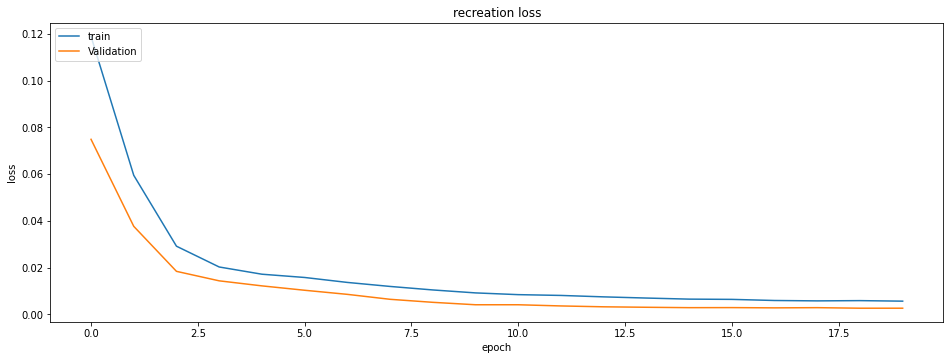

Intlier max value: 0.041385368 Index Val: 1515
outlier max value: 0.073112875 Index Val: 86
outlier min value: 0.0018660186 Index Val: 26


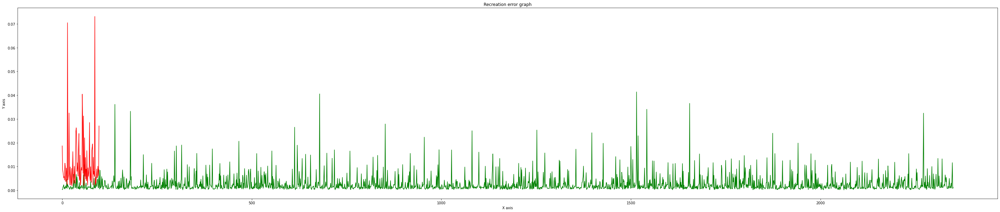

Total member in inlear: 2351
Total False alarm: 815
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.65      0.79      2351
           1       0.11      0.99      0.19        98

    accuracy                           0.67      2449
   macro avg       0.55      0.82      0.49      2449
weighted avg       0.96      0.67      0.77      2449



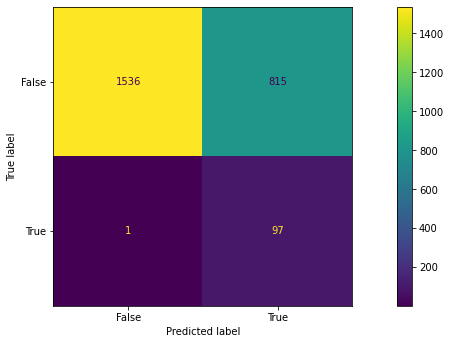

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.1181 - val_loss: 0.0784
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0668 - val_loss: 0.0515
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0395 - val_loss: 0.0251
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0255 - val_loss: 0.0187
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0210 - val_loss: 0.0142
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0171 - val_loss: 0.0091
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0130 - val_loss: 0.0062
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0113 - val_loss: 0.0051
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0098 - val_loss: 0.0043
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0092 - val_loss: 0.0040
Epoch 11/20
59/59 [

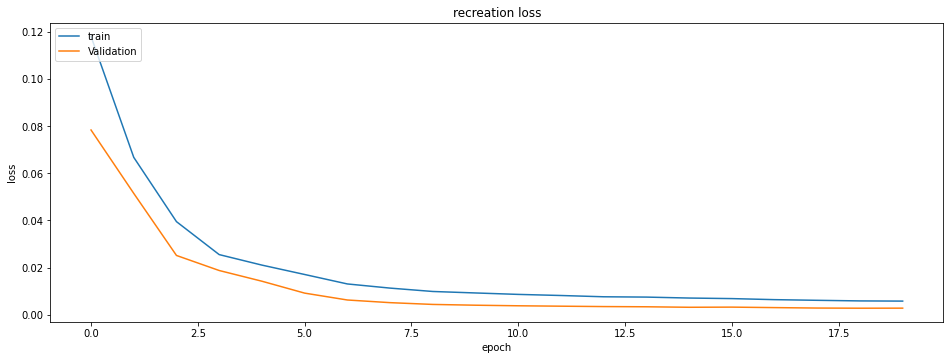

Intlier max value: 0.056326218 Index Val: 139
outlier max value: 0.07675787 Index Val: 86
outlier min value: 0.0027701205 Index Val: 13


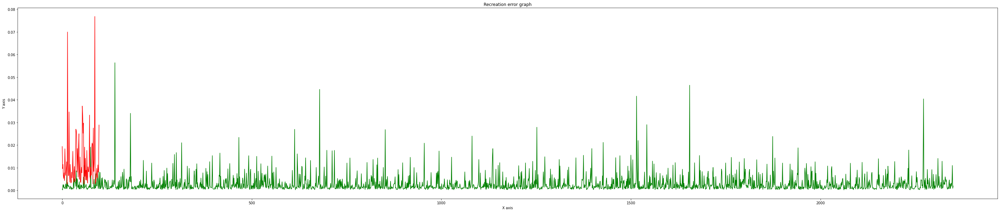

Total member in inlear: 2351
Total False alarm: 603
Total member in Outlier: 98
Total missed true alarm: 4
              precision    recall  f1-score   support

           0       1.00      0.74      0.85      2351
           1       0.13      0.96      0.24        98

    accuracy                           0.75      2449
   macro avg       0.57      0.85      0.54      2449
weighted avg       0.96      0.75      0.83      2449



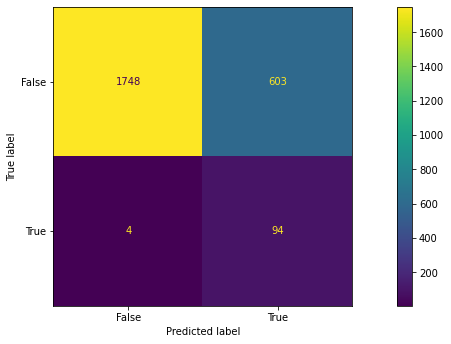

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.1133 - val_loss: 0.0848
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0707 - val_loss: 0.0475
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0339 - val_loss: 0.0186
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0203 - val_loss: 0.0107
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0146 - val_loss: 0.0067
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0117 - val_loss: 0.0058
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0104 - val_loss: 0.0050
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0096 - val_loss: 0.0047
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0091 - val_loss: 0.0042
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0084 - val_loss: 0.0040
Epoch 11/20
59/59 [

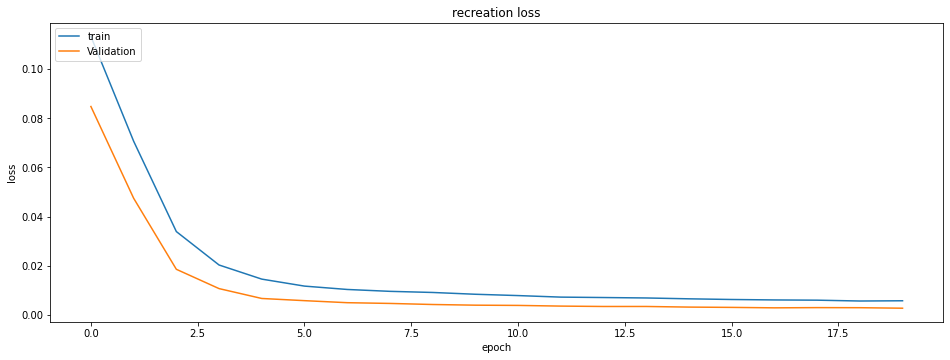

Intlier max value: 0.04332203 Index Val: 1515
outlier max value: 0.07570655 Index Val: 86
outlier min value: 0.0025018256 Index Val: 57


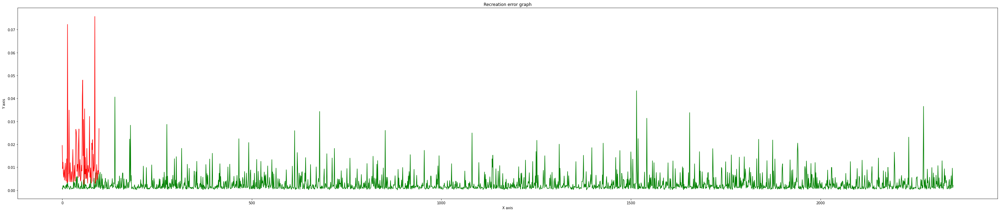

Total member in inlear: 2351
Total False alarm: 615
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.74      0.85      2351
           1       0.14      0.99      0.24        98

    accuracy                           0.75      2449
   macro avg       0.57      0.86      0.54      2449
weighted avg       0.96      0.75      0.82      2449



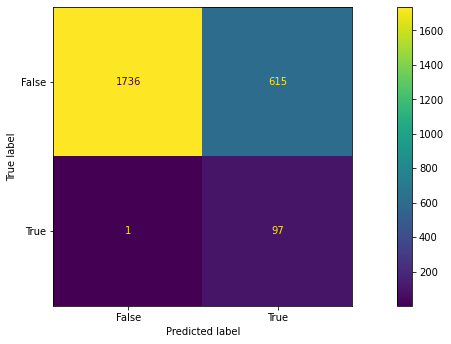

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.1425 - val_loss: 0.1184
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.1070 - val_loss: 0.0868
Epoch 3/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0802 - val_loss: 0.0708
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0694 - val_loss: 0.0621
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0643 - val_loss: 0.0575
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0607 - val_loss: 0.0543
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0582 - val_loss: 0.0526
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0569 - val_loss: 0.0518
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0559 - val_loss: 0.0514
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0553 - val_loss: 0.0512
Epoch 11/20
59/59 [

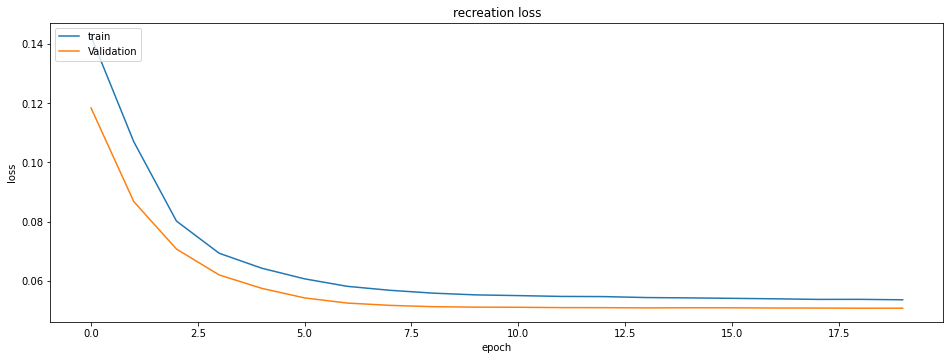

Intlier max value: 0.12655659 Index Val: 1655
outlier max value: 0.14674757 Index Val: 14
outlier min value: 0.0026338203 Index Val: 77


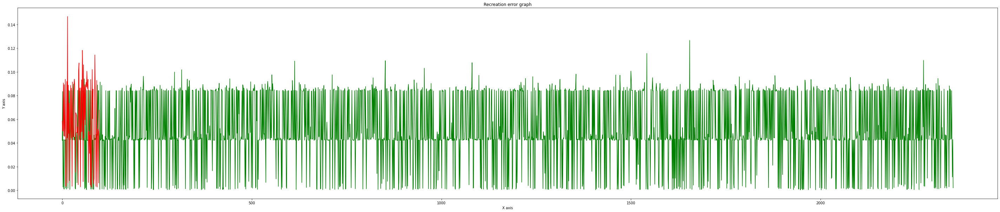

Total member in inlear: 2351
Total False alarm: 2055
Total member in Outlier: 98
Total missed true alarm: 3
              precision    recall  f1-score   support

           0       0.99      0.13      0.22      2351
           1       0.04      0.97      0.08        98

    accuracy                           0.16      2449
   macro avg       0.52      0.55      0.15      2449
weighted avg       0.95      0.16      0.22      2449



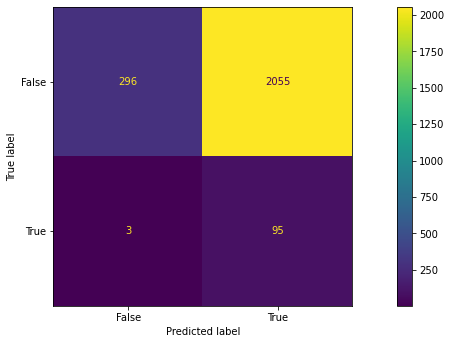

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.1269 - val_loss: 0.0956
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0763 - val_loss: 0.0511
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0386 - val_loss: 0.0243
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0240 - val_loss: 0.0169
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0187 - val_loss: 0.0115
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0140 - val_loss: 0.0073
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0108 - val_loss: 0.0052
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0092 - val_loss: 0.0042
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0084 - val_loss: 0.0036
Epoch 10/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0078 - val_loss: 0.0032
Epoch 11/20
59/59 [

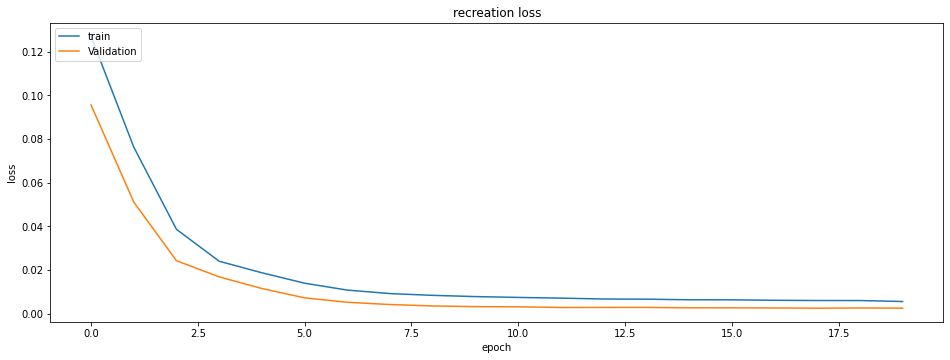

Intlier max value: 0.04822945 Index Val: 679
outlier max value: 0.07437218 Index Val: 86
outlier min value: 0.0020367396 Index Val: 57


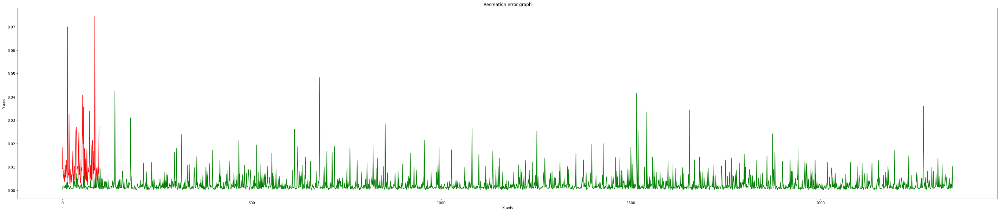

Total member in inlear: 2351
Total False alarm: 711
Total member in Outlier: 98
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.70      0.82      2351
           1       0.12      0.99      0.21        98

    accuracy                           0.71      2449
   macro avg       0.56      0.84      0.52      2449
weighted avg       0.96      0.71      0.80      2449



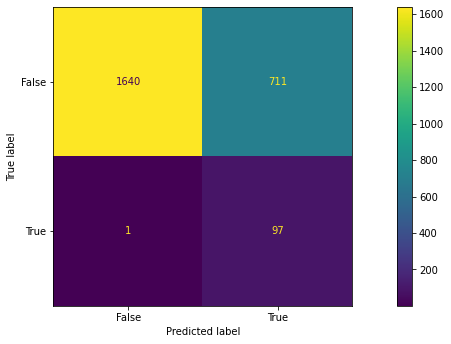

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.1242 - val_loss: 0.0858
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0718 - val_loss: 0.0537
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0403 - val_loss: 0.0231
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0233 - val_loss: 0.0175
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0192 - val_loss: 0.0143
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0165 - val_loss: 0.0117
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0141 - val_loss: 0.0091
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0116 - val_loss: 0.0068
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0101 - val_loss: 0.0051
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0090 - val_loss: 0.0041
Epoch 11/20
59/59 [

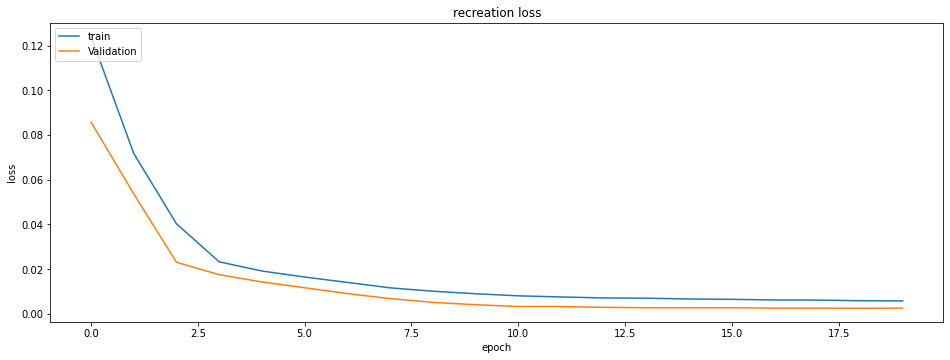

Intlier max value: 0.04442794 Index Val: 1655
outlier max value: 0.07861671 Index Val: 86
outlier min value: 0.002451479 Index Val: 34


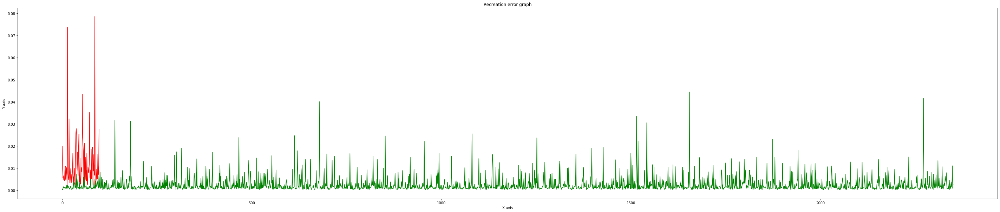

Total member in inlear: 2351
Total False alarm: 590
Total member in Outlier: 98
Total missed true alarm: 5
              precision    recall  f1-score   support

           0       1.00      0.75      0.86      2351
           1       0.14      0.95      0.24        98

    accuracy                           0.76      2449
   macro avg       0.57      0.85      0.55      2449
weighted avg       0.96      0.76      0.83      2449



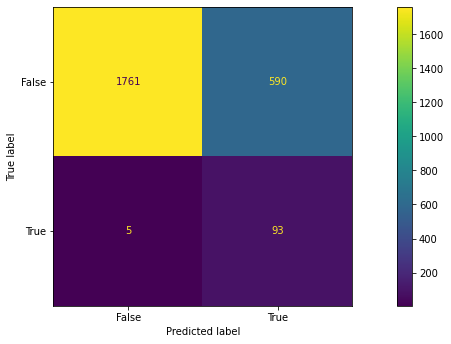

Epoch 1/20
59/59 [==============================] - 1s 8ms/step - loss: 0.1160 - val_loss: 0.0852
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0704 - val_loss: 0.0563
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0469 - val_loss: 0.0364
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0313 - val_loss: 0.0234
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0254 - val_loss: 0.0200
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0228 - val_loss: 0.0170
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0203 - val_loss: 0.0146
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0184 - val_loss: 0.0134
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0172 - val_loss: 0.0128
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0167 - val_loss: 0.0124
Epoch 11/20
59/59 [

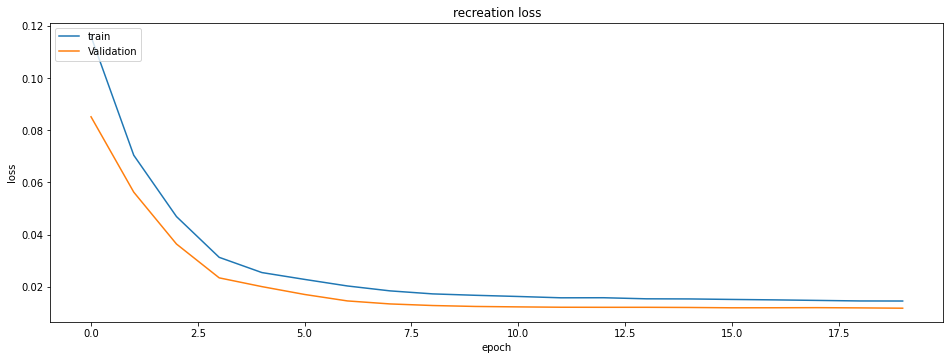

Intlier max value: 0.09896266 Index Val: 163
outlier max value: 0.08876526 Index Val: 42
outlier min value: 0.0028141164 Index Val: 87


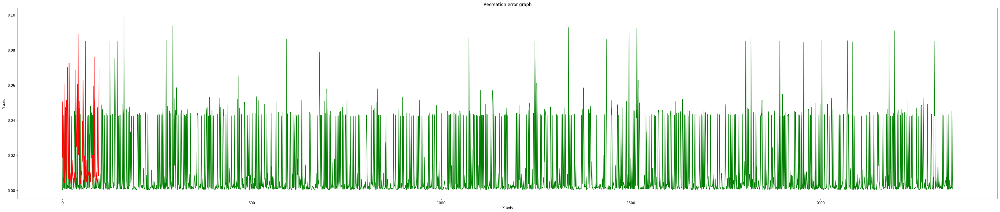

Total member in inlear: 2351
Total False alarm: 889
Total member in Outlier: 98
Total missed true alarm: 3
              precision    recall  f1-score   support

           0       1.00      0.62      0.77      2351
           1       0.10      0.97      0.18        98

    accuracy                           0.64      2449
   macro avg       0.55      0.80      0.47      2449
weighted avg       0.96      0.64      0.74      2449



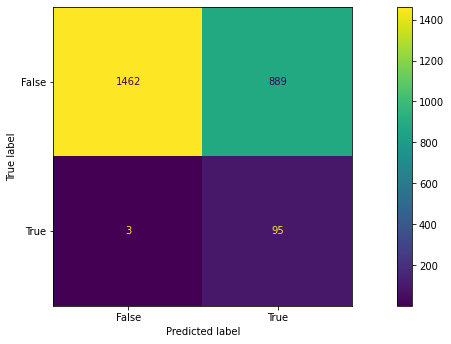

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.1137 - val_loss: 0.0780
Epoch 2/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0607 - val_loss: 0.0364
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0296 - val_loss: 0.0189
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0205 - val_loss: 0.0134
Epoch 5/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0161 - val_loss: 0.0098
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0137 - val_loss: 0.0079
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0122 - val_loss: 0.0068
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0112 - val_loss: 0.0059
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0104 - val_loss: 0.0054
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0100 - val_loss: 0.0051
Epoch 11/20
59/59 [

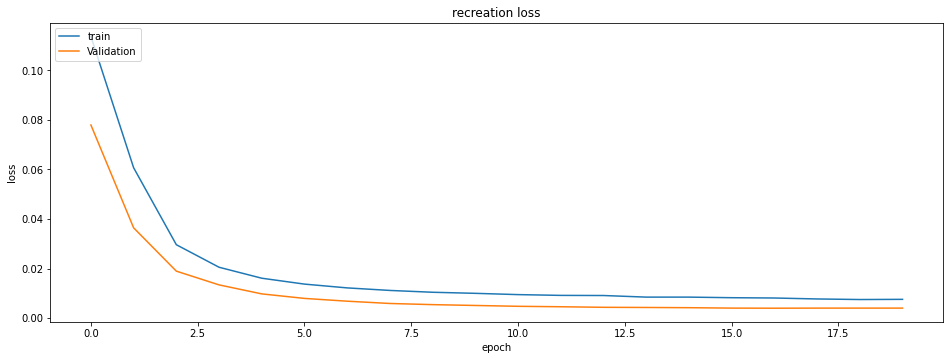

Intlier max value: 0.09866829 Index Val: 2272
outlier max value: 0.117593735 Index Val: 56
outlier min value: 0.009451688 Index Val: 74


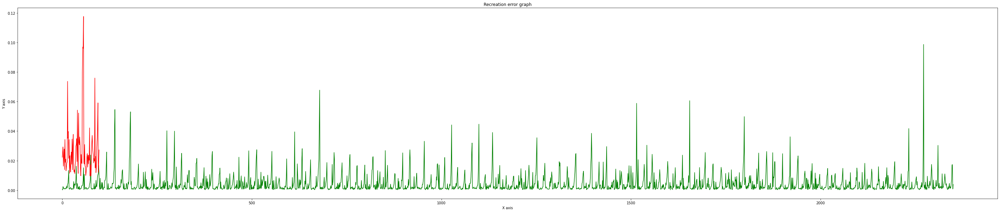

Total member in inlear: 2351
Total False alarm: 260
Total member in Outlier: 98
Total missed true alarm: 5
              precision    recall  f1-score   support

           0       1.00      0.89      0.94      2351
           1       0.26      0.95      0.41        98

    accuracy                           0.89      2449
   macro avg       0.63      0.92      0.68      2449
weighted avg       0.97      0.89      0.92      2449



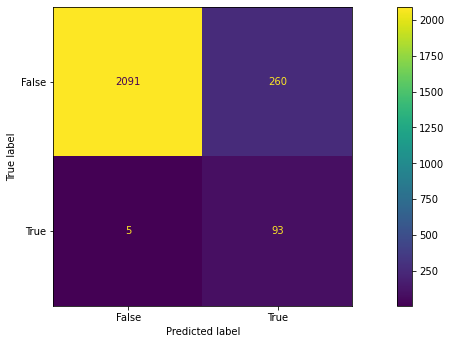

Epoch 1/20
59/59 [==============================] - 1s 9ms/step - loss: 0.1236 - val_loss: 0.0846
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0674 - val_loss: 0.0424
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0313 - val_loss: 0.0172
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0185 - val_loss: 0.0102
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0137 - val_loss: 0.0070
Epoch 6/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0115 - val_loss: 0.0055
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0102 - val_loss: 0.0047
Epoch 8/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0091 - val_loss: 0.0040
Epoch 9/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0089 - val_loss: 0.0037
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0082 - val_loss: 0.0037
Epoch 11/20
59/59 [

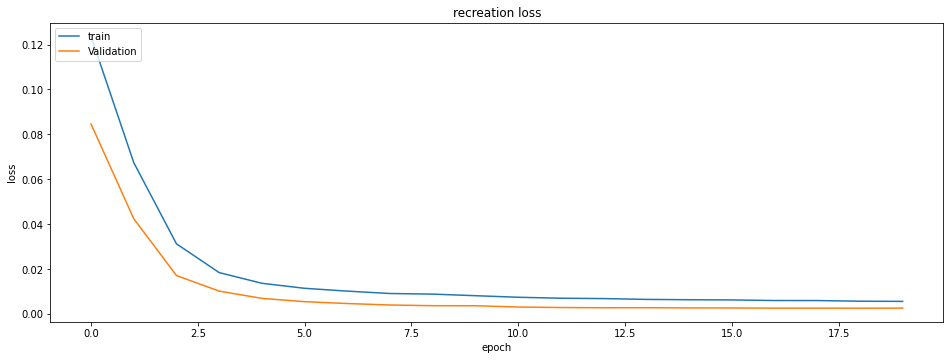

Intlier max value: 0.045055006 Index Val: 1655
outlier max value: 0.07730234 Index Val: 86
outlier min value: 0.0032294416 Index Val: 87


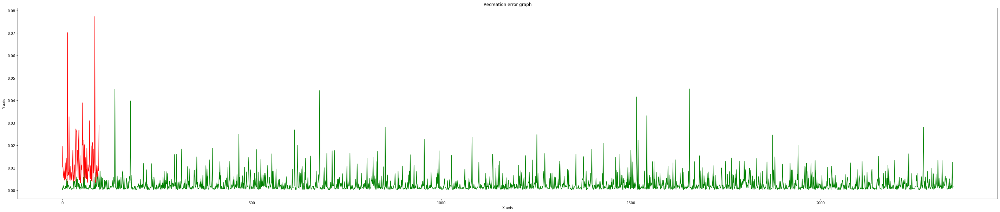

Total member in inlear: 2351
Total False alarm: 496
Total member in Outlier: 98
Total missed true alarm: 5
              precision    recall  f1-score   support

           0       1.00      0.79      0.88      2351
           1       0.16      0.95      0.27        98

    accuracy                           0.80      2449
   macro avg       0.58      0.87      0.58      2449
weighted avg       0.96      0.80      0.86      2449



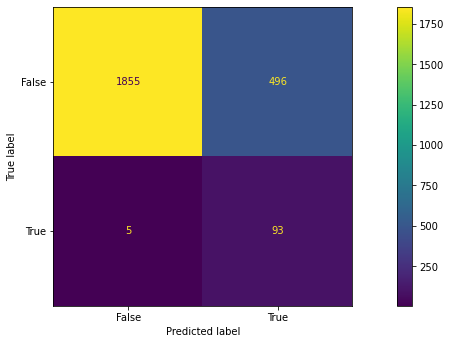

Epoch 1/20
59/59 [==============================] - 1s 10ms/step - loss: 0.1226 - val_loss: 0.0769
Epoch 2/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0637 - val_loss: 0.0431
Epoch 3/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0342 - val_loss: 0.0255
Epoch 4/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0262 - val_loss: 0.0199
Epoch 5/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0216 - val_loss: 0.0159
Epoch 6/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0194 - val_loss: 0.0146
Epoch 7/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0179 - val_loss: 0.0136
Epoch 8/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0172 - val_loss: 0.0130
Epoch 9/20
59/59 [==============================] - 0s 5ms/step - loss: 0.0165 - val_loss: 0.0126
Epoch 10/20
59/59 [==============================] - 0s 6ms/step - loss: 0.0159 - val_loss: 0.0124
Epoch 11/20
59/59 

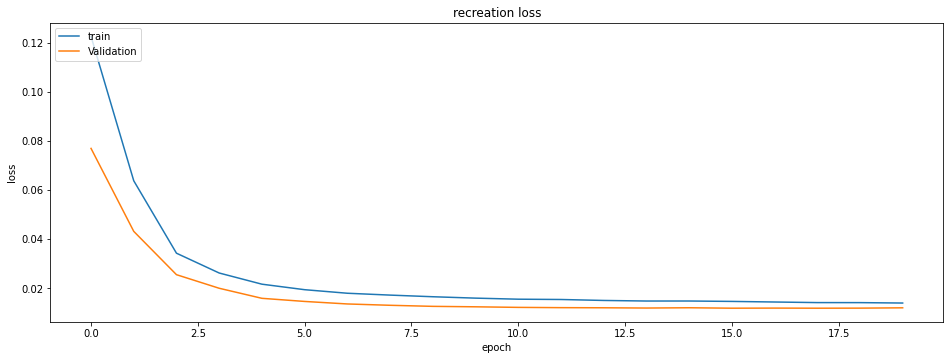

Intlier max value: 0.0939356 Index Val: 1336
outlier max value: 0.08882375 Index Val: 42
outlier min value: 0.0023661766 Index Val: 13


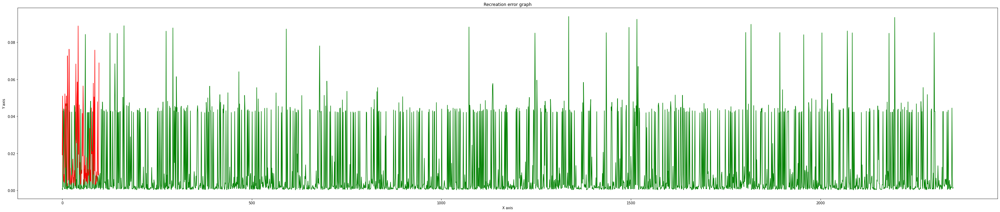

Total member in inlear: 2351
Total False alarm: 1036
Total member in Outlier: 98
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.56      0.72      2351
           1       0.08      0.98      0.16        98

    accuracy                           0.58      2449
   macro avg       0.54      0.77      0.44      2449
weighted avg       0.96      0.58      0.69      2449



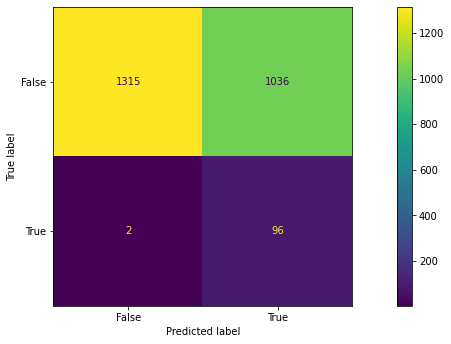

In [ ]:
# Inputs for OSF model:
w = 4
epochs = 20
# Get Raw Data for OSF
#fFiled = 'machineFailure'
fFiled = 'OSF'
rd, rd_o = rawDataload()
md = OnlyOSF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only osf related field
XPopIndex = [0,1,2,5,6]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 5
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
recall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# Build,train the Model
# Build,train the Model
while count < 5:
    # Build,train the Model
    m1_osf , history = m1_osf_1dcnn(Tr_w,epochs)
    m1 = m1_osf
    # Check model accuracy
    print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
    plt_model_accuracy(history)
    inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1)
    #outlier cut-off point:
    oc_osf = min(outlier_lst)
    oc_osf = oc_osf+oc_osf*0.1
    oc = oc_osf
    mat1 = confusionMatrix(oc_osf,inlier_lst,outlier_lst)
    trecall = mat1['0']['recall']
    frecall = mat1['1']['recall']
    recall = trecall + frecall
    if recall_max < recall:
        recall_max = recall
        trecall_max = trecall
        frecall_max = frecall
        count+=1
        print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
        m1.save(m1_path)
        if count == 3:
            break
    inf+=1
    if inf > 20:
        break

[1.681e+09 9.009e+11 4.613e+28 1.000e+00 1.000e+00 1.000e+00]
Mounted at /content/gdrive
Folder already exist
Intlier max value: 0.055707518 Index Val: 1655
outlier max value: 0.07716325 Index Val: 86
outlier min value: 0.0069920872 Index Val: 49


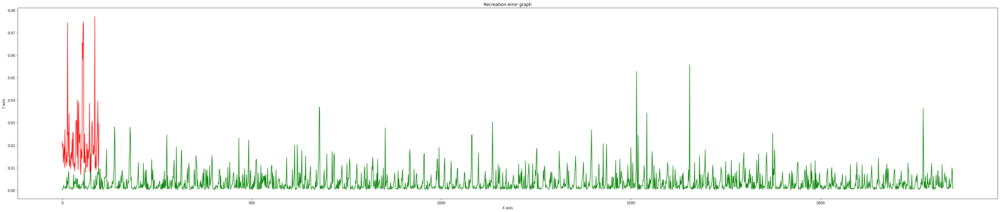

Total member in inlear: 2351
Total False alarm: 218
Total member in Outlier: 98
Total missed true alarm: 6
              precision    recall  f1-score   support

           0       1.00      0.91      0.95      2351
           1       0.30      0.94      0.45        98

    accuracy                           0.91      2449
   macro avg       0.65      0.92      0.70      2449
weighted avg       0.97      0.91      0.93      2449



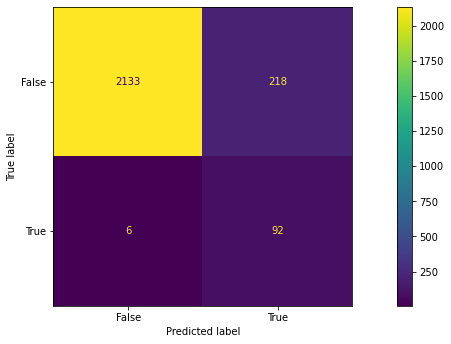

In [ ]:
# Inputs for OSF model freezed:
w = 4
epochs = 20
# Get Raw Data for OSF
#fFiled = 'machineFailure'
fFiled = 'OSF'
rd, rd_o = rawDataload()
md = OnlyOSF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only osf related field
XPopIndex = [0,1,2,5,6]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 5
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_osf_1dcnn_freezed'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# load the model
m2_osf_load = tf.keras.models.load_model(m1_path)
inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m2_osf_load)
#outlier cut-off point:
oc_osf = min(outlier_lst)
oc_osf = oc_osf+oc_osf*0.25
oc = oc_osf
mat1 = confusionMatrix(oc_osf,inlier_lst,outlier_lst)

#### TWF Model - freezed

[9.009e+11]
Mounted at /content/gdrive
Folder already exist
Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0133 - val_loss: 0.0034
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0022 - val_loss: 0.0012
Epoch 3/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0014 - val_loss: 6.9925e-04
Epoch 4/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0010 - val_loss: 5.4365e-04
Epoch 5/20
60/60 [==============================] - 0s 2ms/step - loss: 7.9175e-04 - val_loss: 4.2810e-04
Epoch 6/20
60/60 [==============================] - 0s 2ms/step - loss: 5.8975e-04 - val_loss: 2.9161e-04
Epoch 7/20
60/60 [==============================] - 0s 2ms/step - loss: 4.7845e-04 - val_loss: 1.4727e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 3.9305e-04 - val_loss: 1.0487e-04
Epoch 9/20
60/60 [==============================] - 0s 2ms/step - loss: 3.7325e-04 - val_loss: 9.3129e-05
Epoch 10/2

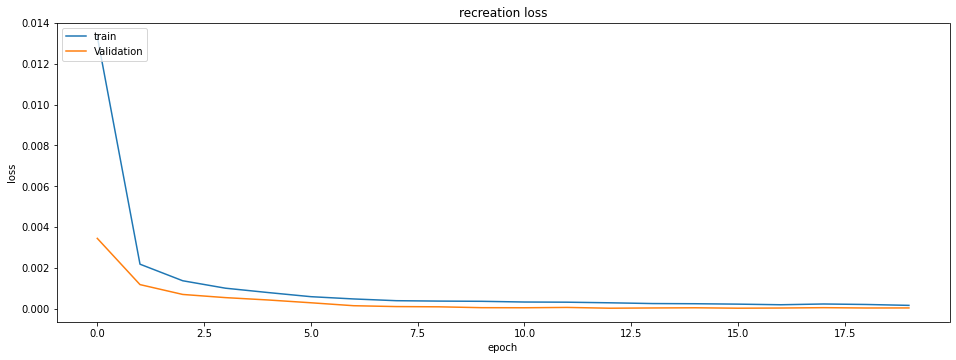

Intlier max value: 0.0022048433 Index Val: 2299
outlier max value: 0.00428105 Index Val: 23
outlier min value: 8.2641236e-05 Index Val: 5


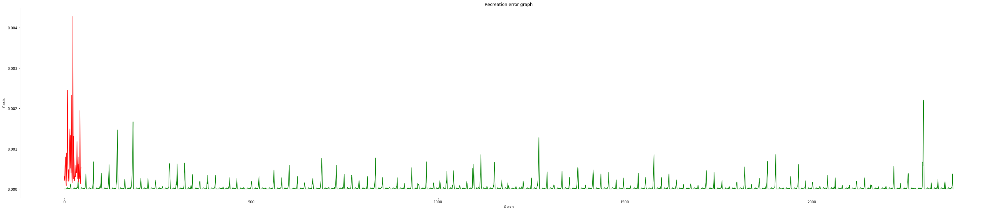

Total member in inlear: 2380
Total False alarm: 234
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.90      0.95      2380
           1       0.16      0.98      0.28        46

    accuracy                           0.90      2426
   macro avg       0.58      0.94      0.61      2426
weighted avg       0.98      0.90      0.94      2426



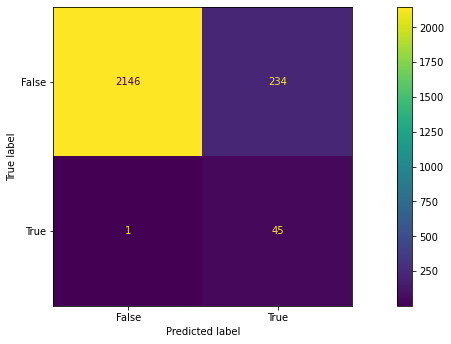

trecall_max: 0.9016806722689076 frecall_max: 0.9782608695652174 Count: 1


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0134 - val_loss: 0.0028
Epoch 2/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0026 - val_loss: 0.0015
Epoch 3/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0019 - val_loss: 9.9248e-04
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0013 - val_loss: 7.1056e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0010 - val_loss: 5.6283e-04
Epoch 6/20
60/60 [==============================] - 0s 2ms/step - loss: 9.2958e-04 - val_loss: 4.1317e-04
Epoch 7/20
60/60 [==============================] - 0s 2ms/step - loss: 7.5101e-04 - val_loss: 2.7756e-04
Epoch 8/20
60/60 [==============================] - 0s 2ms/step - loss: 5.8944e-04 - val_loss: 1.7149e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 5.3400e-04 - val_loss: 1.1487e-04
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 3

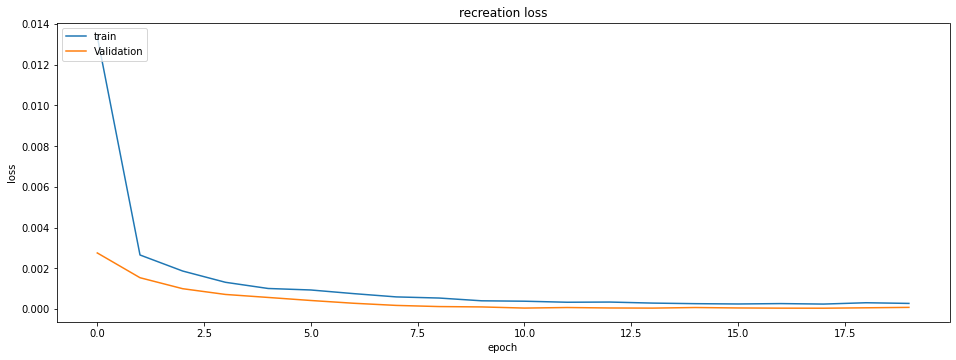

Intlier max value: 0.0032927217 Index Val: 2299
outlier max value: 0.006871698 Index Val: 23
outlier min value: 0.00037101994 Index Val: 5


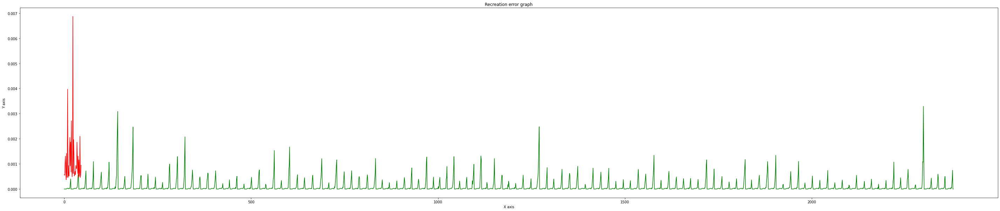

Total member in inlear: 2380
Total False alarm: 177
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      2380
           1       0.20      0.98      0.34        46

    accuracy                           0.93      2426
   macro avg       0.60      0.95      0.65      2426
weighted avg       0.98      0.93      0.95      2426



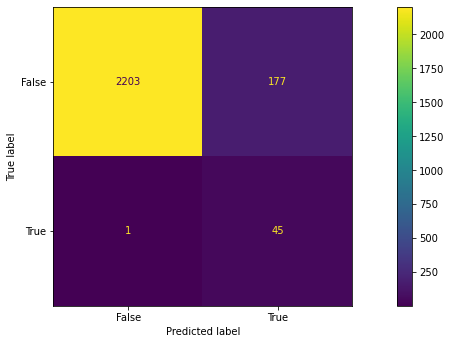

trecall_max: 0.9256302521008404 frecall_max: 0.9782608695652174 Count: 2


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


Epoch 1/20
60/60 [==============================] - 1s 6ms/step - loss: 0.0119 - val_loss: 0.0021
Epoch 2/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0021 - val_loss: 0.0012
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0014 - val_loss: 7.6431e-04
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 9.9968e-04 - val_loss: 6.3716e-04
Epoch 5/20
60/60 [==============================] - 0s 2ms/step - loss: 9.2865e-04 - val_loss: 5.4583e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 8.0825e-04 - val_loss: 4.3615e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 6.7450e-04 - val_loss: 2.9261e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 5.9524e-04 - val_loss: 2.1392e-04
Epoch 9/20
60/60 [==============================] - 0s 2ms/step - loss: 4.6619e-04 - val_loss: 2.0098e-04
Epoch 10/20
60/60 [==============================] - 0s 2ms/step -

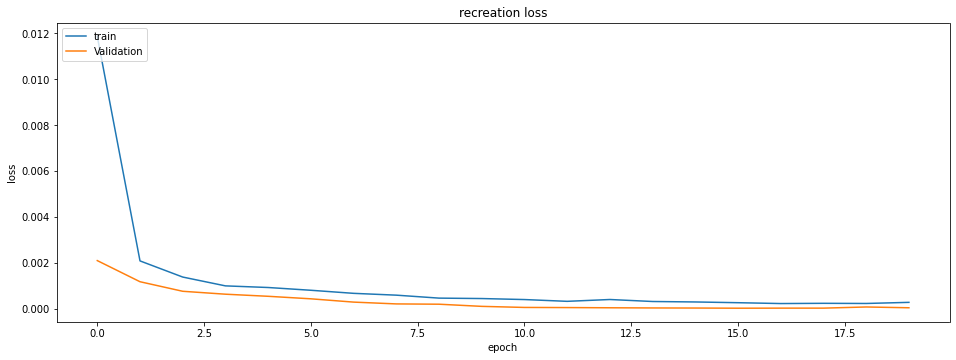

Intlier max value: 0.0013442083 Index Val: 2299
outlier max value: 0.0026433943 Index Val: 23
outlier min value: 9.169735e-05 Index Val: 43


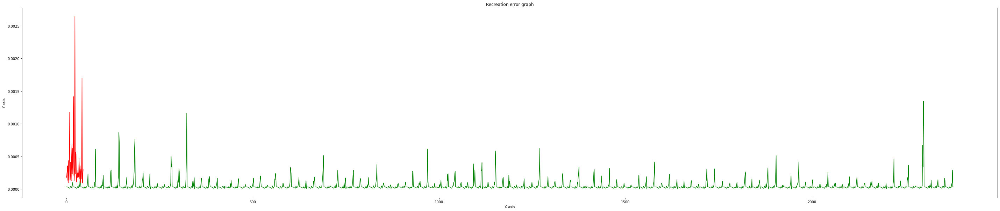

Total member in inlear: 2380
Total False alarm: 203
Total member in Outlier: 46
Total missed true alarm: 3
              precision    recall  f1-score   support

           0       1.00      0.91      0.95      2380
           1       0.17      0.93      0.29        46

    accuracy                           0.92      2426
   macro avg       0.59      0.92      0.62      2426
weighted avg       0.98      0.92      0.94      2426



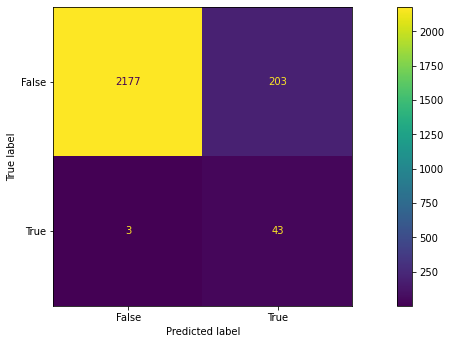

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0111 - val_loss: 0.0025
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0015
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 4/20
60/60 [==============================] - 0s 2ms/step - loss: 0.0013 - val_loss: 7.0345e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 5.7483e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 8.7505e-04 - val_loss: 3.9768e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 6.9738e-04 - val_loss: 3.0718e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 6.4386e-04 - val_loss: 2.6658e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 5.7696e-04 - val_loss: 1.7565e-04
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 5.073

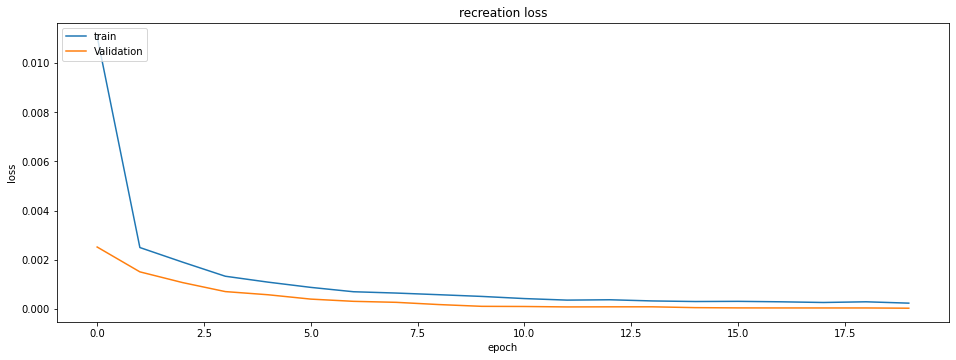

Intlier max value: 0.00199111 Index Val: 143
outlier max value: 0.0030076816 Index Val: 23
outlier min value: 6.031747e-05 Index Val: 43


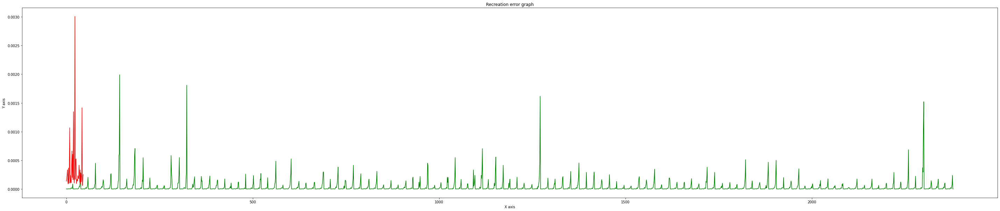

Total member in inlear: 2380
Total False alarm: 275
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.88      0.94      2380
           1       0.14      0.98      0.25        46

    accuracy                           0.89      2426
   macro avg       0.57      0.93      0.59      2426
weighted avg       0.98      0.89      0.93      2426



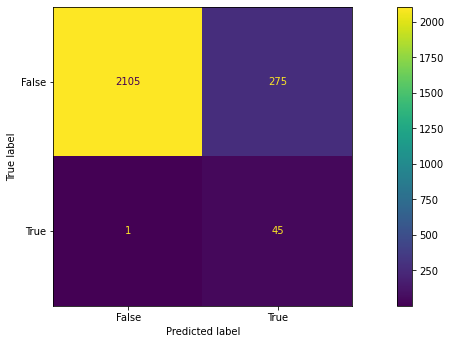

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0107 - val_loss: 0.0016
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0013 - val_loss: 6.9515e-04
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 9.7710e-04 - val_loss: 5.0161e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 7.4423e-04 - val_loss: 3.5070e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 6.4999e-04 - val_loss: 2.3904e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 5.4076e-04 - val_loss: 1.3684e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 4.4840e-04 - val_loss: 9.9058e-05
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 3.7308e-04 - val_loss: 7.7252e-05
Epoch 10/20
60/60 [==============================] - 0s 3ms/step -

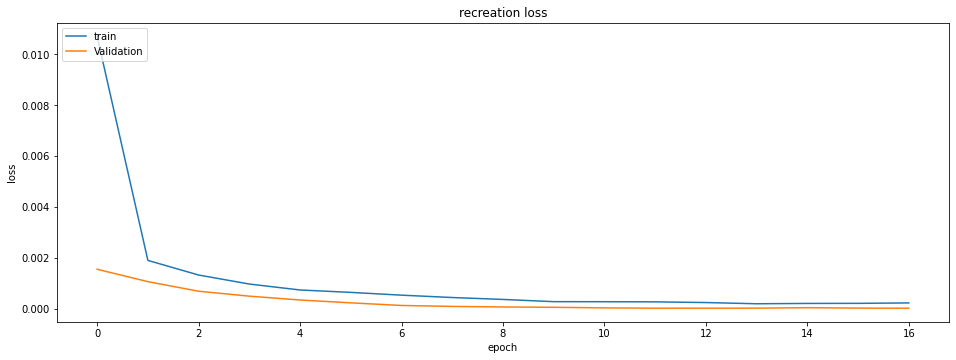

Intlier max value: 0.0015023807 Index Val: 2299
outlier max value: 0.0026648277 Index Val: 23
outlier min value: 5.1420324e-05 Index Val: 5


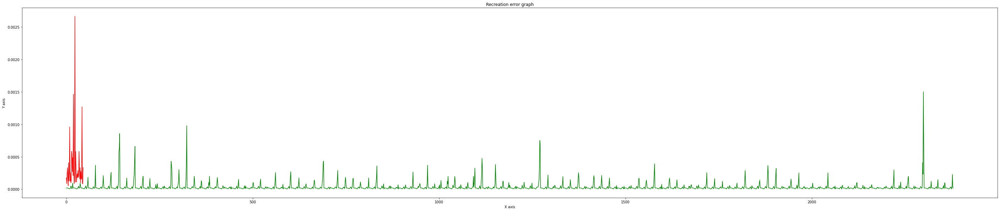

Total member in inlear: 2380
Total False alarm: 228
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.90      0.95      2380
           1       0.16      0.98      0.28        46

    accuracy                           0.91      2426
   macro avg       0.58      0.94      0.62      2426
weighted avg       0.98      0.91      0.94      2426



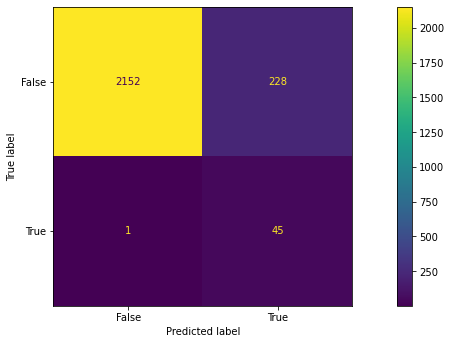

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0140 - val_loss: 0.0043
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0028 - val_loss: 0.0014
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 9.4749e-04
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 6.8936e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 8.5814e-04 - val_loss: 5.1491e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 6.9022e-04 - val_loss: 3.8275e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 5.3127e-04 - val_loss: 2.2054e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 3.7736e-04 - val_loss: 1.4127e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 3.5115e-04 - val_loss: 7.9626e-05
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - los

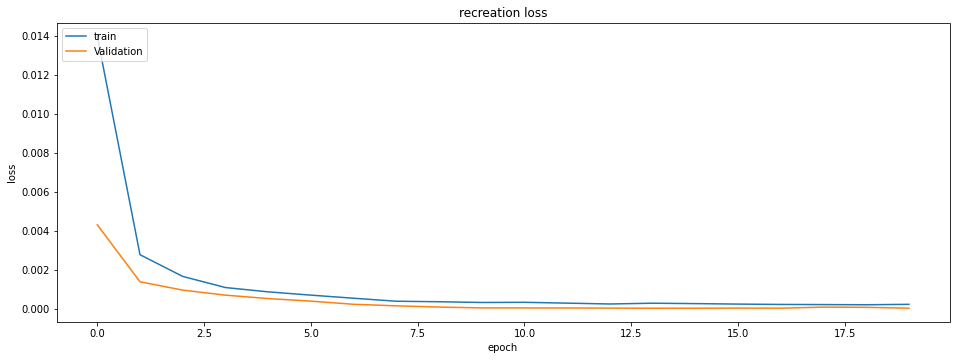

Intlier max value: 0.00075809576 Index Val: 2299
outlier max value: 0.0023632625 Index Val: 23
outlier min value: 5.098806e-06 Index Val: 12


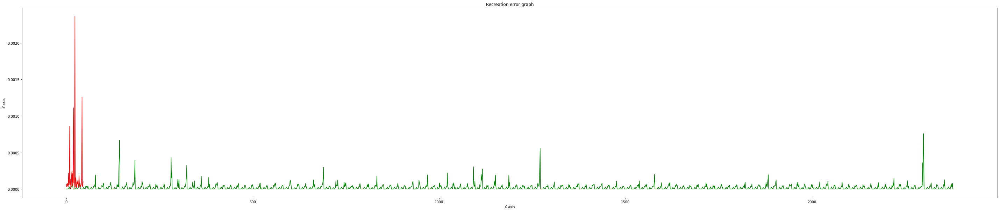

Total member in inlear: 2380
Total False alarm: 1362
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.43      0.60      2380
           1       0.03      0.98      0.06        46

    accuracy                           0.44      2426
   macro avg       0.52      0.70      0.33      2426
weighted avg       0.98      0.44      0.59      2426



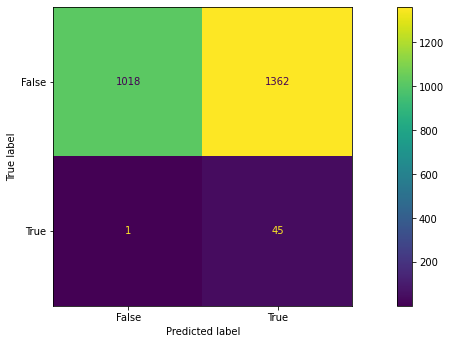

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0119 - val_loss: 0.0021
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0015
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0020 - val_loss: 0.0011
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0014 - val_loss: 7.4665e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 6.2524e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 8.4331e-04 - val_loss: 4.4196e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 7.6292e-04 - val_loss: 3.1909e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 6.6332e-04 - val_loss: 2.7630e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 5.3454e-04 - val_loss: 1.1965e-04
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 4.519

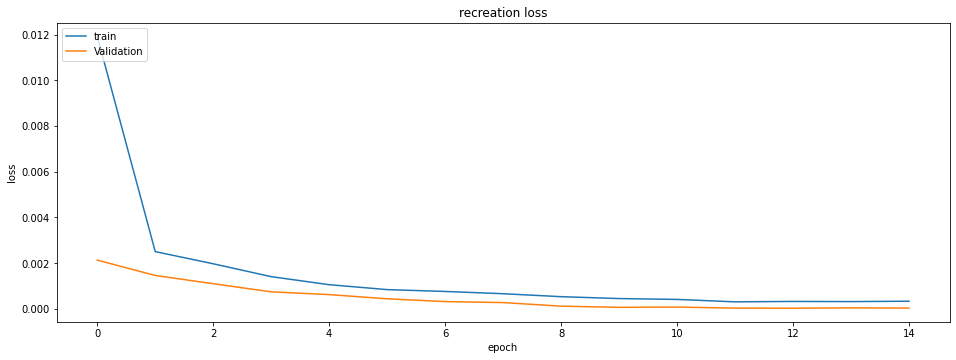

Intlier max value: 0.0028122778 Index Val: 2300
outlier max value: 0.0024465648 Index Val: 23
outlier min value: 2.4095687e-05 Index Val: 14


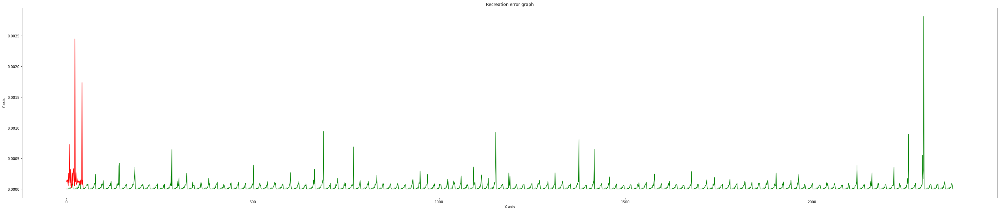

Total member in inlear: 2380
Total False alarm: 671
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.72      0.84      2380
           1       0.06      0.98      0.12        46

    accuracy                           0.72      2426
   macro avg       0.53      0.85      0.48      2426
weighted avg       0.98      0.72      0.82      2426



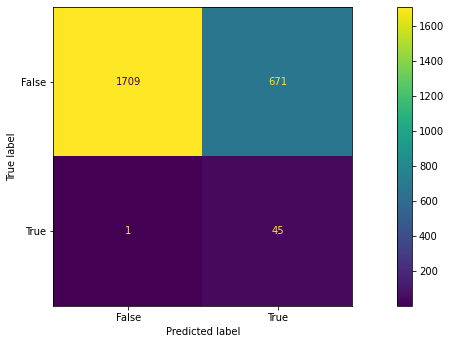

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0140 - val_loss: 0.0038
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0027 - val_loss: 0.0014
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0017 - val_loss: 8.8769e-04
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 6.1326e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 9.1990e-04 - val_loss: 4.9765e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 8.0420e-04 - val_loss: 3.8696e-04
Epoch 7/20
60/60 [==============================] - 0s 4ms/step - loss: 6.6509e-04 - val_loss: 3.5835e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 5.7461e-04 - val_loss: 1.7959e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 5.1681e-04 - val_loss: 1.8534e-04
Epoch 10/20
60/60 [==============================] - 0s 4ms/step - los

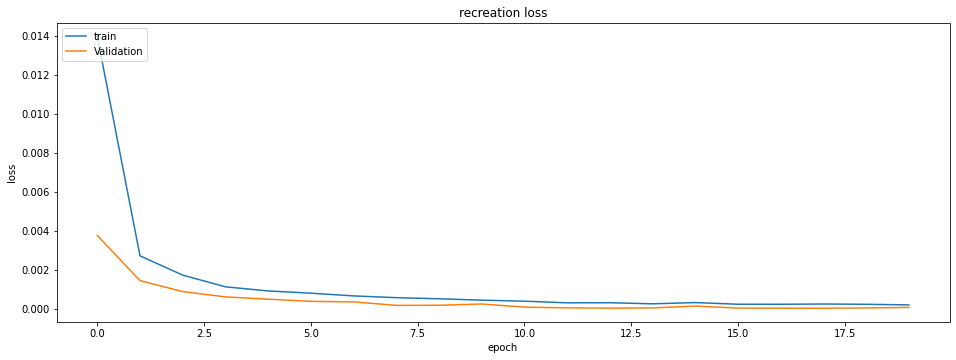

Intlier max value: 0.003384408 Index Val: 2299
outlier max value: 0.006392401 Index Val: 23
outlier min value: 0.00035446836 Index Val: 5


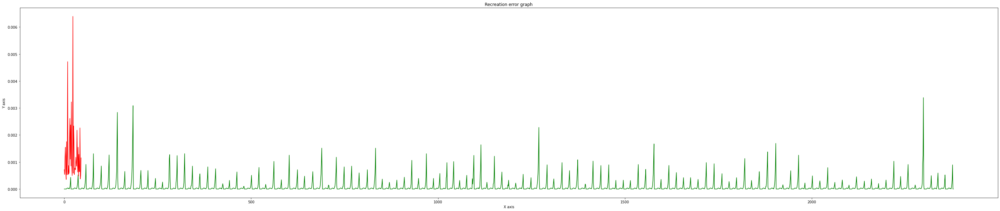

Total member in inlear: 2380
Total False alarm: 157
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.93      0.97      2380
           1       0.22      0.96      0.36        46

    accuracy                           0.93      2426
   macro avg       0.61      0.95      0.66      2426
weighted avg       0.98      0.93      0.95      2426



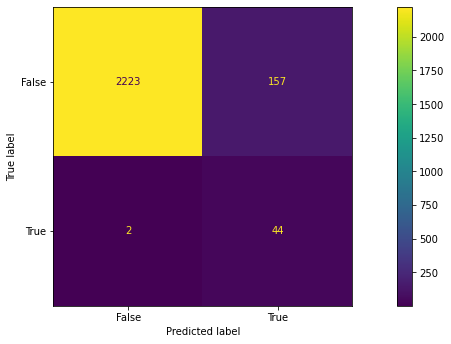

Epoch 1/20
60/60 [==============================] - 1s 5ms/step - loss: 0.0119 - val_loss: 0.0028
Epoch 2/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0025 - val_loss: 0.0015
Epoch 3/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0019 - val_loss: 0.0012
Epoch 4/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0014 - val_loss: 7.9030e-04
Epoch 5/20
60/60 [==============================] - 0s 3ms/step - loss: 0.0011 - val_loss: 5.4942e-04
Epoch 6/20
60/60 [==============================] - 0s 3ms/step - loss: 8.0304e-04 - val_loss: 4.3601e-04
Epoch 7/20
60/60 [==============================] - 0s 3ms/step - loss: 6.0526e-04 - val_loss: 2.7080e-04
Epoch 8/20
60/60 [==============================] - 0s 3ms/step - loss: 5.0825e-04 - val_loss: 1.6567e-04
Epoch 9/20
60/60 [==============================] - 0s 3ms/step - loss: 4.0073e-04 - val_loss: 1.0146e-04
Epoch 10/20
60/60 [==============================] - 0s 3ms/step - loss: 3.214

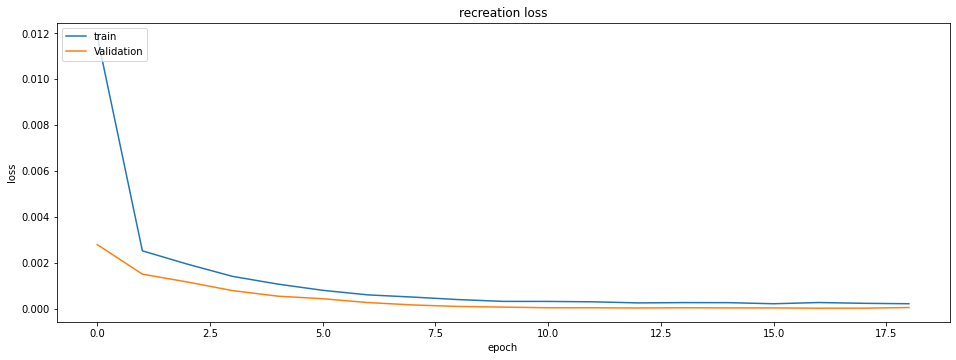

Intlier max value: 0.0023061307 Index Val: 2299
outlier max value: 0.004836545 Index Val: 23
outlier min value: 0.00022601175 Index Val: 5


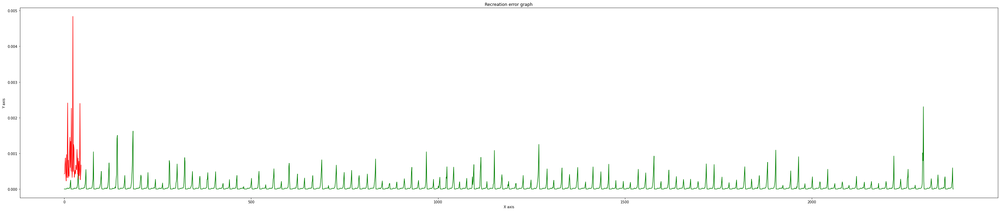

Total member in inlear: 2380
Total False alarm: 163
Total member in Outlier: 46
Total missed true alarm: 1
              precision    recall  f1-score   support

           0       1.00      0.93      0.96      2380
           1       0.22      0.98      0.35        46

    accuracy                           0.93      2426
   macro avg       0.61      0.95      0.66      2426
weighted avg       0.98      0.93      0.95      2426



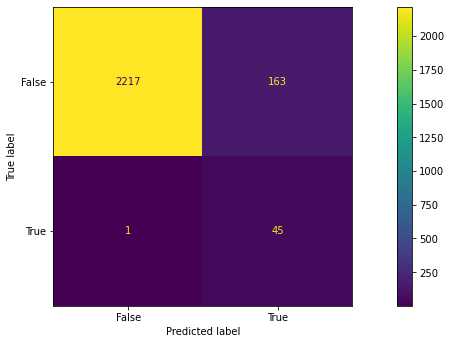

trecall_max: 0.9315126050420168 frecall_max: 0.9782608695652174 Count: 3


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn/assets


In [ ]:
# Inputs for TWF model:
w = 4
epochs = 20
# Get Raw Data for TWF
#fFiled = 'machineFailure'
fFiled = 'TWF'
rd, rd_o = rawDataload()
md = OnlyTWF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only osf related field
XPopIndex = [0,1,2,3,5,6,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 5
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
count = 0
trecall_max = 0.0
frecall_max = 0.0
recall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
#Build,train the Model
while count < 5:
    # Build,train the Model
    m1_twf , history = m2_twf_1dcnn(Tr_w,epochs)
    m1 = m1_twf
    # Check model accuracy
    print("Loss",list(history.history['loss'])[-1],"Validation Loss:",list(history.history['val_loss'])[-1])
    plt_model_accuracy(history)
    inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m1)
    #outlier cut-off point:
    oc_twf = min(outlier_lst)
    oc_twf = oc_twf+oc_twf*0.1
    oc = oc_twf
    mat1 = confusionMatrix(oc_twf,inlier_lst,outlier_lst)
    trecall = mat1['0']['recall']
    frecall = mat1['1']['recall']
    recall = trecall + frecall
    if recall_max < recall:
        recall_max = recall
        trecall_max = trecall
        frecall_max = frecall
        count+=1
        print("trecall_max:",trecall_max,'frecall_max:',frecall_max, 'Count:',count)
        m1.save(m1_path)
        if count == 3:
            break
    inf+=1
    if inf > 20:
        break

[9.009e+11]
Mounted at /content/gdrive
Folder already exist
Intlier max value: 0.0023061307 Index Val: 2299
outlier max value: 0.004836545 Index Val: 23
outlier min value: 0.00022601175 Index Val: 5


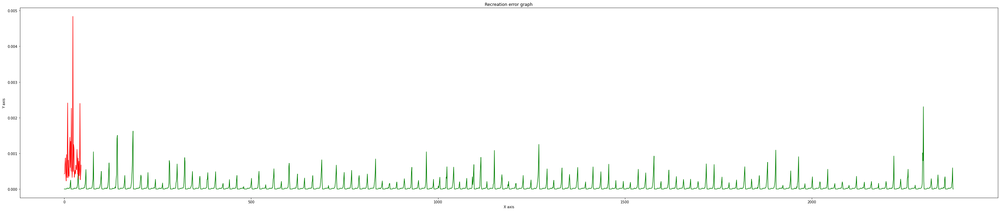

Total member in inlear: 2380
Total False alarm: 146
Total member in Outlier: 46
Total missed true alarm: 2
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      2380
           1       0.23      0.96      0.37        46

    accuracy                           0.94      2426
   macro avg       0.62      0.95      0.67      2426
weighted avg       0.98      0.94      0.96      2426



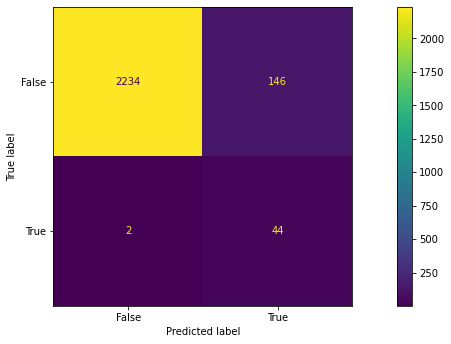

In [ ]:
# Inputs for TWF model freezed:
w = 4
epochs = 20
# Get Raw Data for TWF
#fFiled = 'machineFailure'
fFiled = 'TWF'
rd, rd_o = rawDataload()
md = OnlyTWF(rd_o)
#md = rd_o
# Create test and training sets
XT,YT,XTs,YTs = winTrain_test(md,w,fFiled)
# Take only osf related field
XPopIndex = [0,1,2,3,5,6,7,8,9,10]
XT = np.delete(XT, XPopIndex, axis=1)
XTs = np.delete(XTs, XPopIndex, axis=1)
# amplify the diffrences 
amp = 5
trn = np.power(XT, amp)
tst = np.power(XTs, amp)
# nomalize by dividing max value of train matrix
max_value = np.max(trn,axis = 0)
print(max_value)
trainN = (trn/max_value)
testN = (tst/max_value)
# Convert data into windows
n= trainN.shape[1]
Tr_w = TS_window(w,n,trainN) # Numpy windows output of Inliear data
Ts_w = TS_window(w,n,testN) # Numpy windows output of Outlier data
#m1, h1 = m1_1dcnn(Tr_w,epochs)
#m1, h1 = m1_1dcnn(Tr_w,epochs)
count = 0
trecall_max = 0.0
frecall_max = 0.0
recall_max = 0.0
inf = 0
from google.colab import drive
import os
drive.mount('/content/gdrive', force_remount=True)
m1_path = '/content/gdrive/MyDrive/outlier_models/m2_twf_1dcnn_freezed'
try:
  os.mkdir(m1_path)
except:
  print("Folder already exist")
# load the model
m2_twf_load = tf.keras.models.load_model(m1_path)
inlier_lst,outlier_lst = model_analysis(Tr_w,Ts_w,m2_twf_load)
#outlier cut-off point:
oc_twf = min(outlier_lst)
oc_twf = oc_twf+oc_twf*0.2
oc = oc_twf
mat1 = confusionMatrix(oc,inlier_lst,outlier_lst)

# Misc

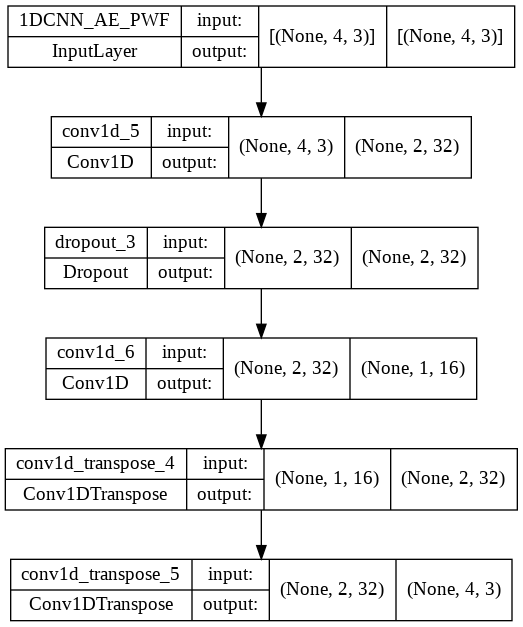

In [ ]:
Xtrain = Tr_w
input = keras.Input(shape = (Xtrain.shape[1],Xtrain.shape[2]), name = "1DCNN_AE_PWF")
x = layers.Conv1D(filters=32, kernel_size=3, padding="same", strides=2, activation="relu")(input)
x = layers.Dropout(rate=0.3)(x)
x = layers.Conv1D(filters=16, kernel_size=3, padding="same", strides=2, activation="relu")(x)
y = layers.Conv1DTranspose(32, kernel_size=3, padding="same", strides=2, activation="relu")(x)
x = layers.Dropout(rate=0.3)(x)
y = layers.Conv1DTranspose(filters=Xtrain.shape[2], kernel_size=3, padding="same", strides=2, activation="relu")(y)
model = keras.Model(input,y)
tf.keras.utils.plot_model(model, show_shapes=True)